In [ ]:
Проаналізуємо за допомогою методів кластерного аналізу товари

In [1]:
%matplotlib inline
from Visualization import give_data
from pandas.plotting import scatter_matrix
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import *
import numpy as np
import matplotlib.pyplot as plt
from Elasticity import elasticity_ols_models
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score, silhouette_score
from sklearn import preprocessing
sns.set()

In [2]:
# виберемо параметри для кластеризації
data = give_data(['Source', 'Month', 'Brand', 'Model', 'ENERGY LABEL EU', 'NOFROST SYSTEM','NET LTRS.', 'Sales Units', 'PRICE USD/UN.'])

In [3]:
# редагування
data = data[data['Source'] == 'Traditional Sales']
data = data[(data['ENERGY LABEL EU'] != 'UNKNOWN') & (data['NET LTRS.'] != 'unknown') & (data['NOFROST SYSTEM'] != 'UNKNOWN')]
mas_for_energy = {'B':1, 'A':2, 'A+':3, 'A++':4, 'A+++':5}
mas_for_system = {'YES':1, 'NO':0}
data['ENERGY LABEL EU'] = data['ENERGY LABEL EU'].apply(lambda x: mas_for_energy[x])
data['NOFROST SYSTEM'] = data['NOFROST SYSTEM'].apply(lambda x: mas_for_system[x])
data['NET LTRS.'] = data['NET LTRS.'].apply(lambda x: int(x))

In [4]:
el = elasticity_ols_models(data, data['Model'].unique(), correct_length_of_sales=9)

In [5]:
data = data[data['Model'].isin(el['Model'].unique())]# додавання еластичності
data['Elasticity'] = pd.Series(np.random.randn(len(data['Model'])), index=data.index)
data['Elasticity'] = data.apply(lambda x: el[el['Model'] == x['Model']]['Elasticity'].values[0], axis=1)  

In [6]:
data.head()

,Source,Month,Brand,Model,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
0,Traditional Sales,2018-01-01,INDESIT,TIAA 14,3,0,245,581.000000,216.907888,-11.815988
1,Traditional Sales,2018-01-01,WHIRLPOOL,BSNF 9121 OX,3,1,349,526.000000,473.180393,-0.312873
2,Traditional Sales,2018-01-01,LG,GA-B429SECZ,4,1,302,521.400000,493.012902,2.804369
3,Traditional Sales,2018-01-01,SAMSUNG,RB37J5000SA/UA,3,1,367,515.000000,576.874039,-0.504816
4,Traditional Sales,2018-01-01,SAMSUNG,RB37J5000EF/UA,3,1,367,496.966038,575.123206,0.455472


In [7]:
data.describe()

,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
count,7606.000000,7606.000000,7606.000000,7606.000000,7606.000000,7606.000000
mean,3.199842,0.491323,313.705627,43.923766,492.908609,-0.051803
std,0.557802,0.499958,101.222006,99.197894,297.546200,1.278280
min,1.000000,0.000000,0.000000,-3.000000,0.000000,-22.929611
25%,3.000000,0.000000,274.000000,4.000000,301.738163,-0.085357
50%,3.000000,0.000000,312.000000,11.784615,420.893950,-0.000462
75%,3.000000,1.000000,352.000000,38.000000,596.367438,0.089745
max,5.000000,1.000000,651.000000,1590.000000,2511.804930,5.517989


In [ ]:
d = data['Month'].unique()
data = data[data['Month'].isin([d[0]])] # можливо розглядати за неповний період

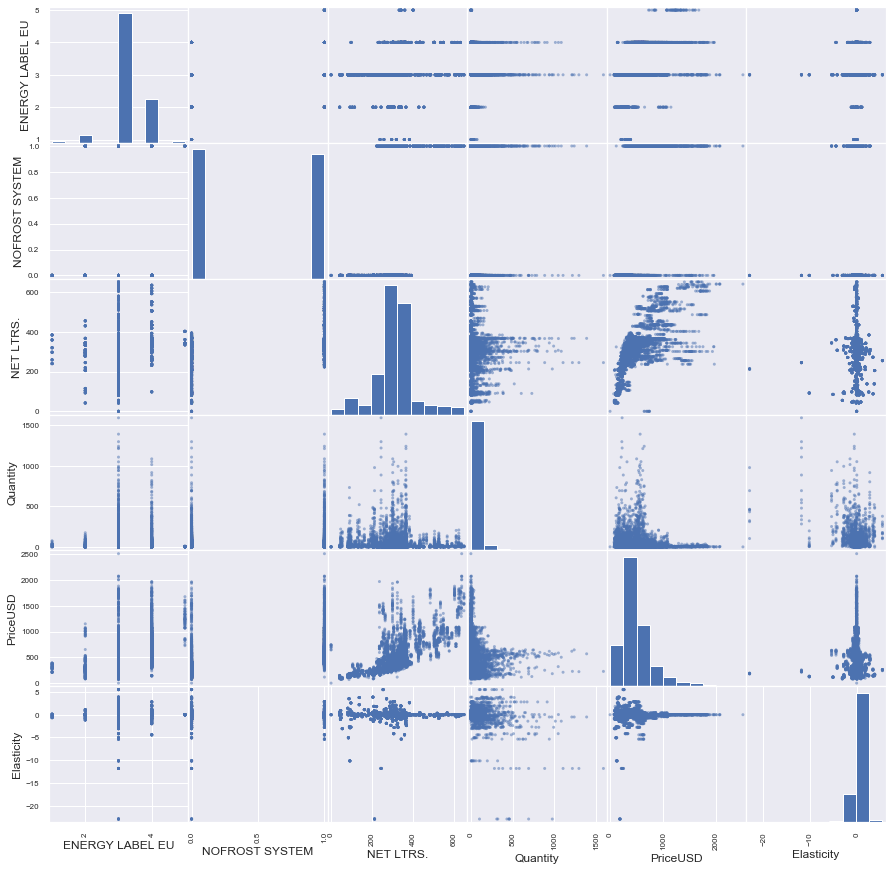

In [8]:
scatter_matrix(data,figsize=(15, 15)); # візуалізація даних

In [9]:
data.corr() # кореляційна матриця

,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
ENERGY LABEL EU,1.000000,0.354662,0.207217,0.002633,0.433595,0.023041
NOFROST SYSTEM,0.354662,1.000000,0.503890,0.015083,0.558897,0.026547
NET LTRS.,0.207217,0.503890,1.000000,-0.043903,0.686601,0.029453
Quantity,0.002633,0.015083,-0.043903,1.000000,-0.095251,-0.263968
PriceUSD,0.433595,0.558897,0.686601,-0.095251,1.000000,0.022523
Elasticity,0.023041,0.026547,0.029453,-0.263968,0.022523,1.000000


In [10]:
data_for_clust=data.drop(data.columns[0], axis=1)
data_for_clust=data_for_clust.drop(data_for_clust.columns[0], axis=1)
data_for_clust=data_for_clust.drop(data_for_clust.columns[0], axis=1)
data_for_clust=data_for_clust.drop(data_for_clust.columns[0], axis=1)
data_for_clust # залишили лише потрібні стовпці

,ENERGY LABEL EU,NOFROST SYSTEM,NET LTRS.,Quantity,PriceUSD,Elasticity
0,3,0,245,581.000000,216.907888,-11.815988
1,3,1,349,526.000000,473.180393,-0.312873
2,4,1,302,521.400000,493.012902,2.804369
3,3,1,367,515.000000,576.874039,-0.504816
4,3,1,367,496.966038,575.123206,0.455472
...,...,...,...,...,...,...
20933,4,0,337,-1.000000,379.752785,-0.010070
20941,3,1,321,-1.000000,461.350709,0.071051
20942,4,1,328,-1.000000,550.078825,0.558278
20944,4,1,346,-1.000000,585.605562,0.034153


In [11]:
digits_proj = TSNE(random_state=20150101).fit_transform(data_for_clust)# поглянемо на проекцію на площину

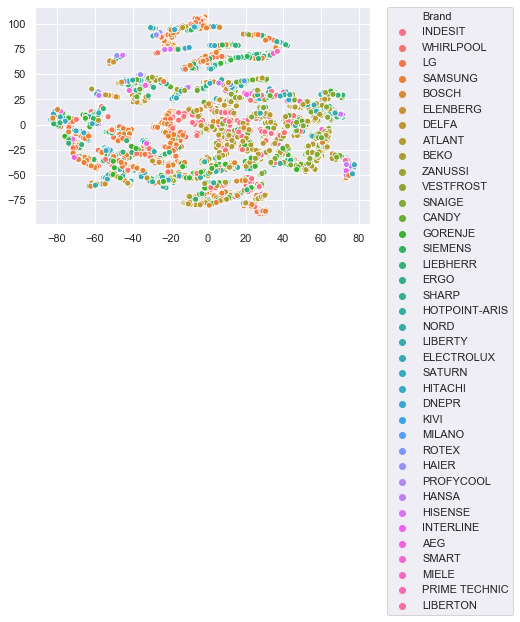

In [12]:
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=data['Brand'], legend='full')# по брендам
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [13]:
dataNorm = preprocessing.scale(data_for_clust) # перетворення даних до нормальних значень

In [14]:
digits_proj_norm = preprocessing.scale(digits_proj)

c:\users\zelen\desktop\python projects\lib\site-packages\sklearn\preprocessing\_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
c:\users\zelen\desktop\python projects\lib\site-packages\sklearn\preprocessing\_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


In [15]:
def clustering_criterion_kmeans(data, metric='euclidean'):# збірний критерій силует, калински-харабас и девіс-болдін
    print('Можлива к-ть класів')
    for i in range(2,20):
        m = KMeans(n_clusters=i).fit(data)
        c = silhouette_score(data, m.labels_, metric=metric)
        ch = calinski_harabasz_score(data, m.labels_)
        db = davies_bouldin_score(data, m.labels_)
        if(c>0):
            print('Clusters: ' + str(i) + '\nsilhouette_score: ' + str(c) + '\ncalinski harabasz score: ' + str(ch) + '\ndavies_bouldin_score: ' + str(db))
def clustering_criterion_ierarhi(data, method, metric):
    print('Можлива к-ть класів')
    for i in range(2,20):
        dist = pdist(data, metric)
        link = linkage(dist, method=method)
        cluster=fcluster(link, i, criterion='maxclust')
        c = silhouette_score(data, cluster, metric=metric, sample_size=6000)
        ch = calinski_harabasz_score(data, cluster)
        db = davies_bouldin_score(data, cluster)
        if(c>0):
            print('Clusters: ' + str(i) + '\nsilhouette_score: ' + str(c) + '\ncalinski harabasz score: ' + str(ch) + '\ndavies_bouldin_score: ' + str(db))

In [16]:
clustering_criterion_kmeans(dataNorm)

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.35982944817284446
calinski harabasz score: 3124.058705774023
davies_bouldin_score: 1.216703411371349
Clusters: 3
silhouette_score: 0.3740217124555935
calinski harabasz score: 2654.1712581581874
davies_bouldin_score: 1.0884682046195457
Clusters: 4
silhouette_score: 0.3537922677412547
calinski harabasz score: 2534.8462149811917
davies_bouldin_score: 1.1574900209964507
Clusters: 5
silhouette_score: 0.36109012483590364
calinski harabasz score: 2479.1988640091718
davies_bouldin_score: 1.042994232589145
Clusters: 6
silhouette_score: 0.37730622869576963
calinski harabasz score: 2565.2761405452575
davies_bouldin_score: 0.9049599077352694
Clusters: 7
silhouette_score: 0.3705114434500788
calinski harabasz score: 2586.6385167474295
davies_bouldin_score: 1.0179413643520616
Clusters: 8
silhouette_score: 0.394743858709575
calinski harabasz score: 2557.005243598355
davies_bouldin_score: 0.9567311632759694
Clusters: 9
silhouette_score: 0.421926404966

In [17]:
# будуємо кластеризацію методом KMeans
# n_clusters - к-ть кластерів
km = KMeans(n_clusters=2).fit(dataNorm)

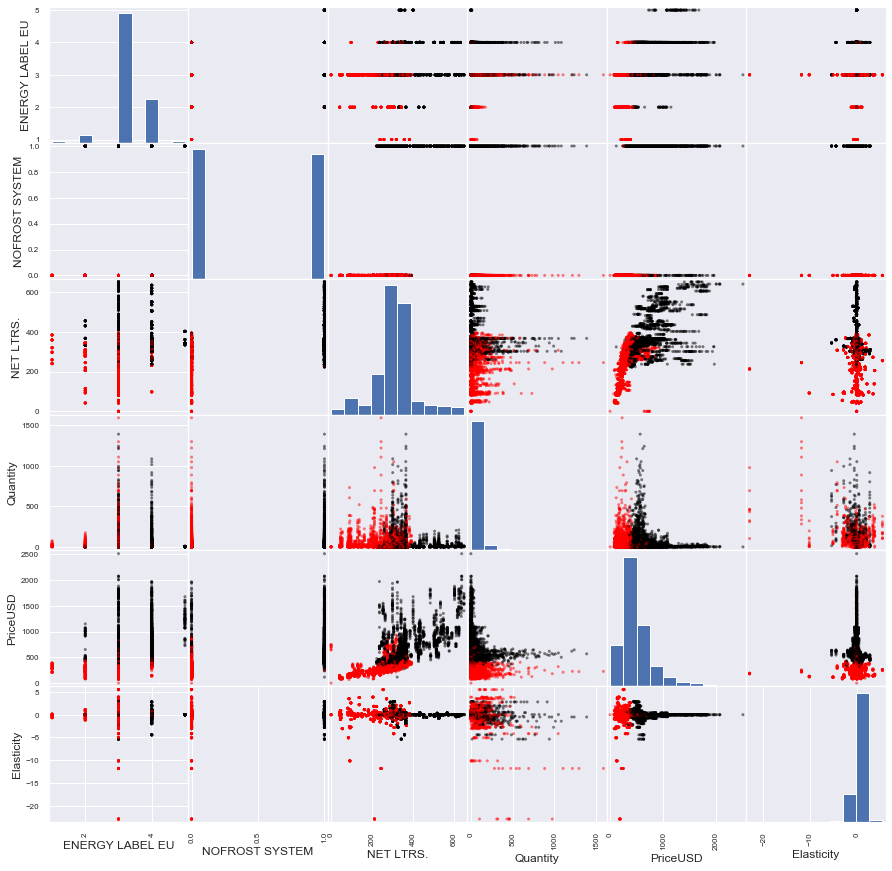

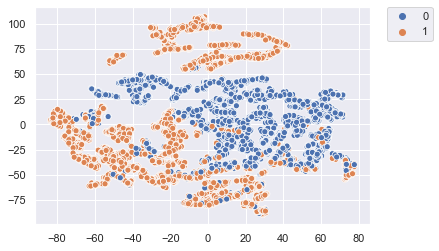

In [18]:
scatter_matrix(data_for_clust, c=km.labels_, cmap='flag', figsize=(15,15))
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=km.labels_, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [19]:
data['cluster_kmean_nd_2']=km.labels_+1

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      3750.000000     3750.000000  3750.000000  3750.000000  3750.000000   
mean          2.965600        0.005067   261.187733    43.663897   303.759029   
std           0.453363        0.071009    84.750659    88.853386   118.950371   
min           1.000000        0.000000     0.000000    -3.000000     0.000000   
25%           3.000000        0.000000   213.000000     5.000000   228.390432   
50%           3.000000        0.000000   285.000000    13.400000   301.254002   
75%           3.000000        0.000000   321.000000    45.985160   356.007506   
max           4.000000        1.000000   393.000000  1590.000000   930.692078   

        Elasticity  
count  3750.000000  
mean     -0.087460  
std       1.707214  
min     -22.929611  
25%      -0.137743  
50%       0.006180  
75%       0.168223  
max       5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

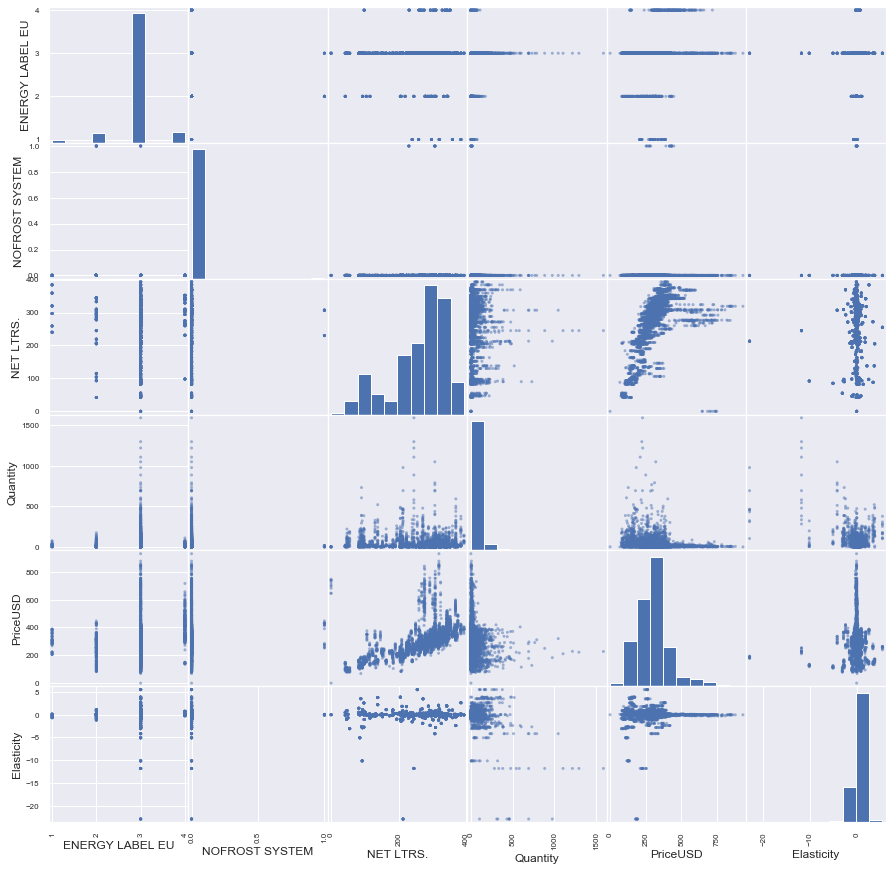

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      3856.000000     3856.000000  3856.000000  3856.000000  3856.000000   
mean          3.427645        0.964212   364.779824    44.176491   676.858538   
std           0.555555        0.185786    89.080238   108.325683   303.721075   
min           2.000000        0.000000   224.000000    -1.000000   116.905072   
25%           3.000000        1.000000   307.000000     3.875000   469.697227   
50%           3.000000        1.000000   339.000000     9.500000   579.238931   
75%           4.000000        1.000000   367.000000    32.000000   780.725811   
max           5.000000        1.000000   651.000000  1388.679739  2511.804930   

        Elasticity  
count  3856.000000  
mean     -0.017126  
std       0.621786  
min      -5.370740  
25%      -0.052266  
50%      -0.001531  
75%       0.045987  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

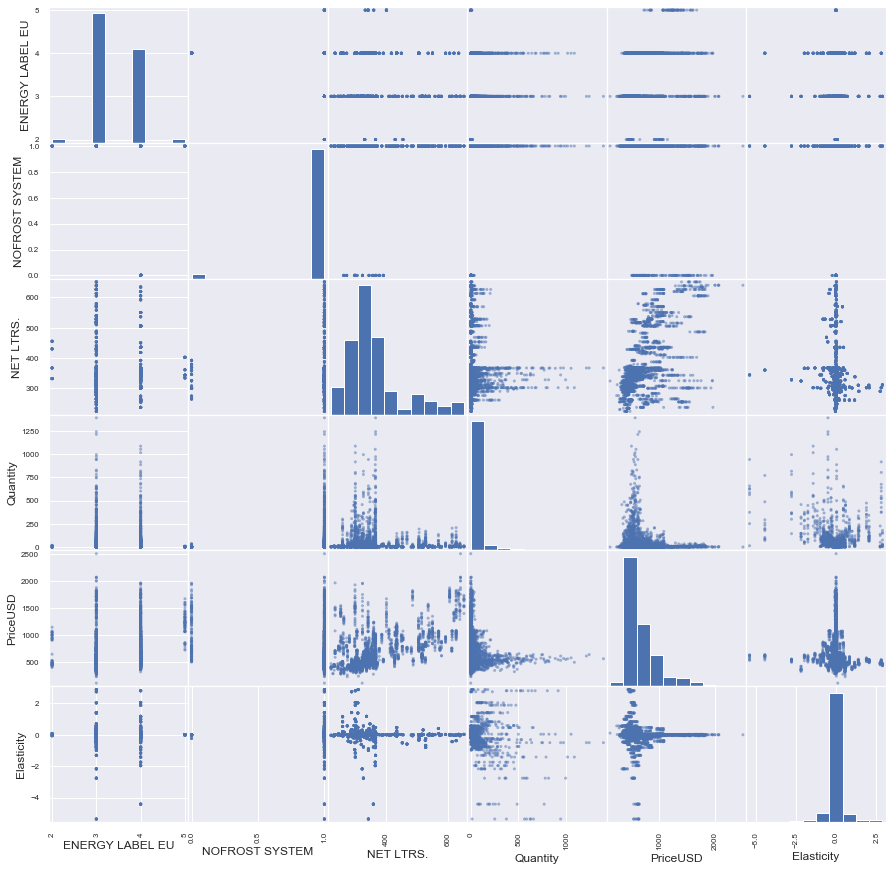

In [20]:
for i in np.unique(km.labels_+1):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_kmean_nd_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_kmean_nd_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_kmean_nd_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [21]:
# будуємо кластеризацію методом KMeans
# n_clusters - к-ть кластерів
km = KMeans(n_clusters=15).fit(dataNorm)

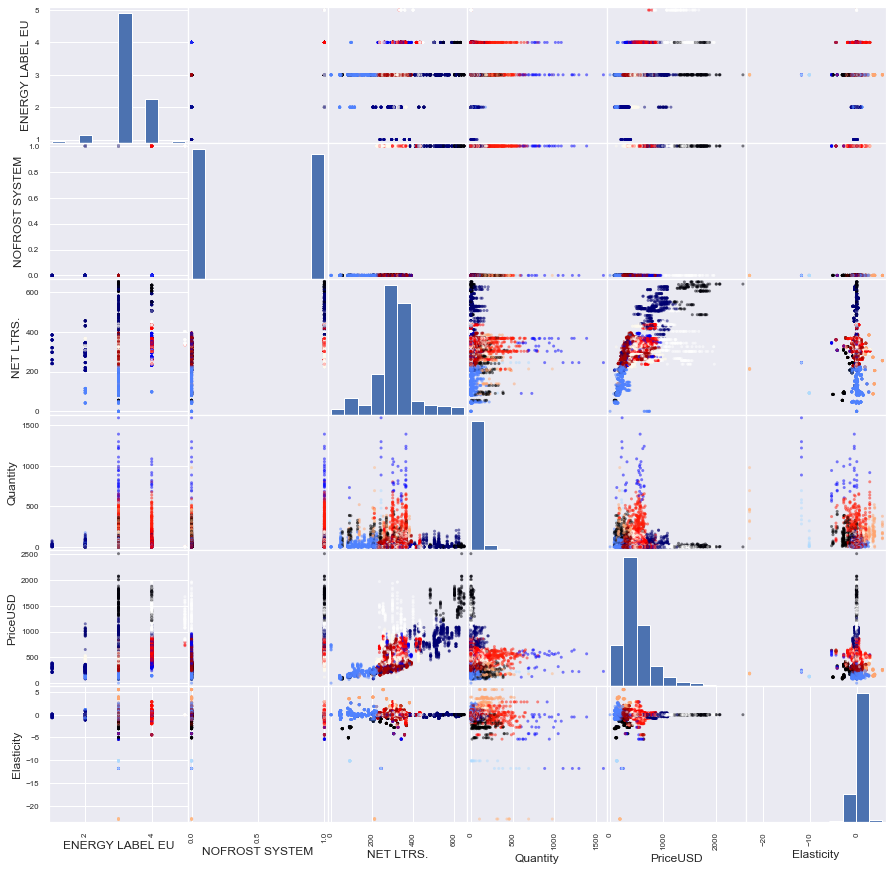

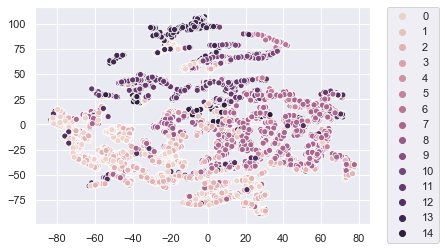

In [22]:
scatter_matrix(data_for_clust, c=km.labels_, cmap='flag', figsize=(15,15))
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=km.labels_, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [23]:
data['cluster_kmean_nd_15']=km.labels_+1

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1005.000000          1005.0  1005.000000  1005.000000  1005.000000   
mean          4.002985             1.0   338.091542    32.987657   603.292239   
std           0.054581             0.0    39.574802    42.318445   123.355316   
min           4.000000             1.0   237.000000    -1.000000   326.271099   
25%           4.000000             1.0   304.000000     6.000000   503.880083   
50%           4.000000             1.0   341.000000    16.650000   596.874065   
75%           4.000000             1.0   360.000000    44.000000   675.791949   
max           5.000000             1.0   435.000000   229.848460   918.790719   

        Elasticity  
count  1005.000000  
mean      0.040150  
std       0.544841  
min      -4.422547  
25%      -0.052266  
50%       0.010796  
75%       0.114040  
max       2.056106  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

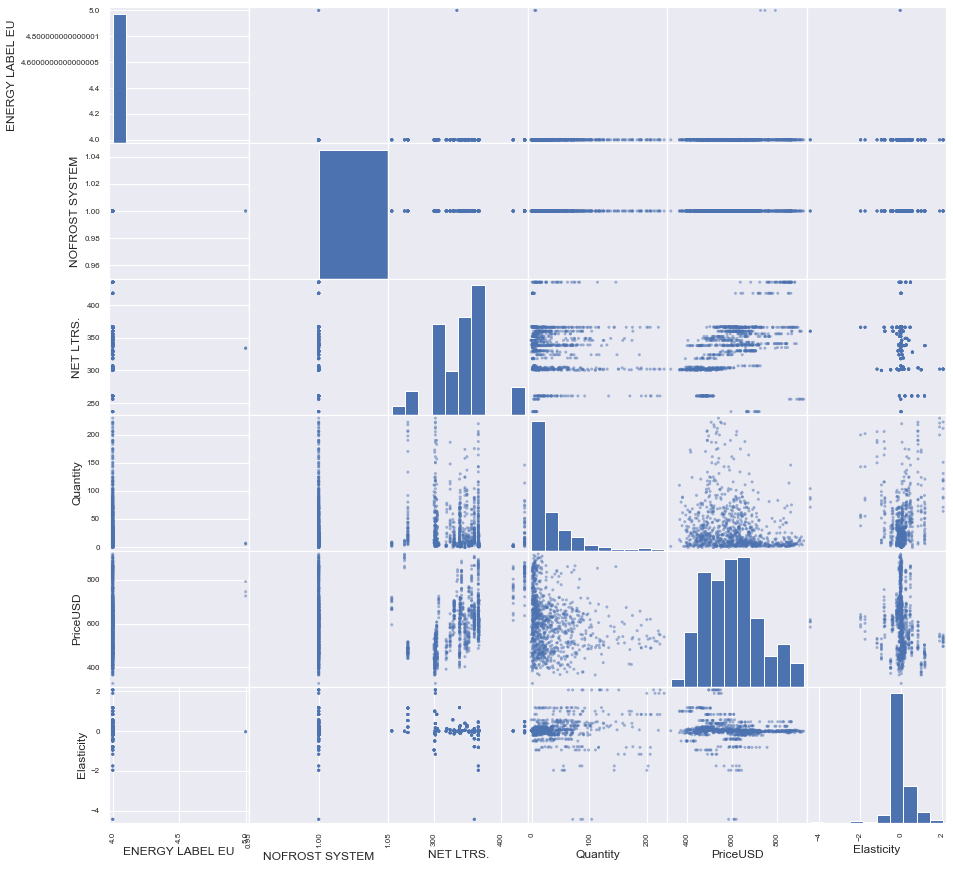

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count            158.0      158.000000  158.000000  158.000000  158.000000   
mean               3.0        0.044304  255.892405  175.405545  268.016890   
std                0.0        0.206423   86.189806   92.877496   92.198434   
min                3.0        0.000000   88.000000   -3.000000  131.662628   
25%                3.0        0.000000  205.000000  114.600000  169.456699   
50%                3.0        0.000000  272.000000  156.893333  266.015155   
75%                3.0        0.000000  319.500000  220.179167  321.419986   
max                3.0        1.000000  384.000000  520.760000  555.385427   

       Elasticity  
count  158.000000  
mean     2.680851  
std      1.242700  
min      0.494805  
25%      1.838574  
50%      2.578980  
75%      3.517151  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

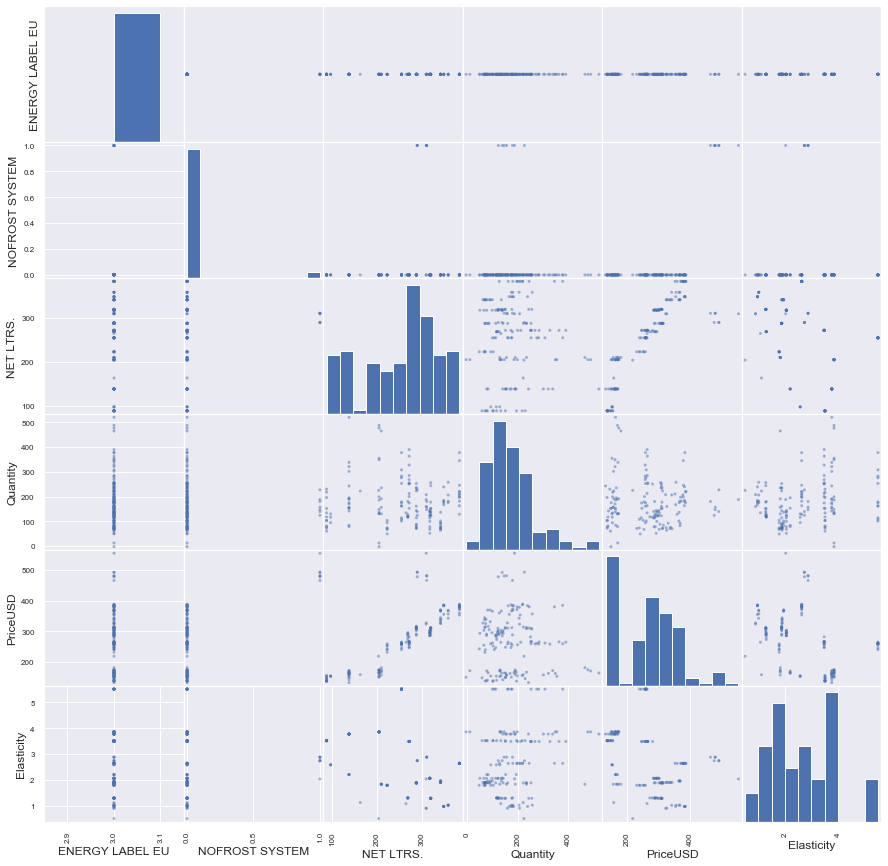

Кластер 3
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1617.000000          1617.0  1617.000000  1617.000000  1617.000000   
mean          2.972171             1.0   319.290662    22.152906   495.605971   
std           0.164534             0.0    35.966357    35.634388   113.068250   
min           2.000000             1.0   224.000000    -1.000000   116.905072   
25%           3.000000             1.0   300.000000     4.000000   424.676422   
50%           3.000000             1.0   319.000000     8.500000   471.109382   
75%           3.000000             1.0   339.000000    22.000000   548.990713   
max           3.000000             1.0   440.000000   215.700000  1050.821296   

        Elasticity  
count  1617.000000  
mean      0.040798  
std       0.448487  
min      -2.767178  
25%      -0.054352  
50%       0.004702  
75%       0.080826  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

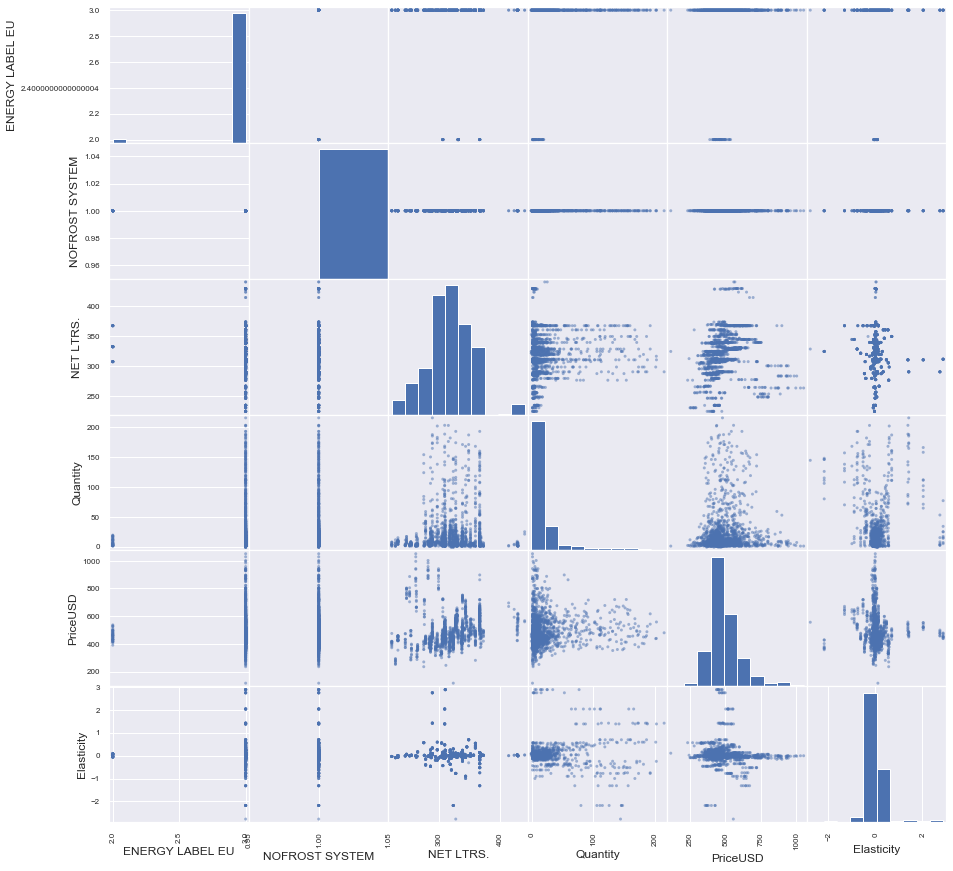

Кластер 4
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count             19.0            19.0   19.000000   19.000000   19.000000   
mean               3.0             0.0  148.368421  221.822473  166.520666   
std                0.0             0.0   75.825978  225.790901   53.296169   
min                3.0             0.0   92.000000    4.000000  117.240770   
25%                3.0             0.0   92.000000   26.925786  125.617973   
50%                3.0             0.0   92.000000  112.401597  132.945257   
75%                3.0             0.0  245.000000  358.500000  224.633321   
max                3.0             0.0  245.000000  693.000000  255.354381   

       Elasticity  
count   19.000000  
mean   -10.762021  
std      0.827039  
min    -11.815988  
25%    -11.815988  
50%    -10.147207  
75%    -10.147207  
max    -10.147207  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

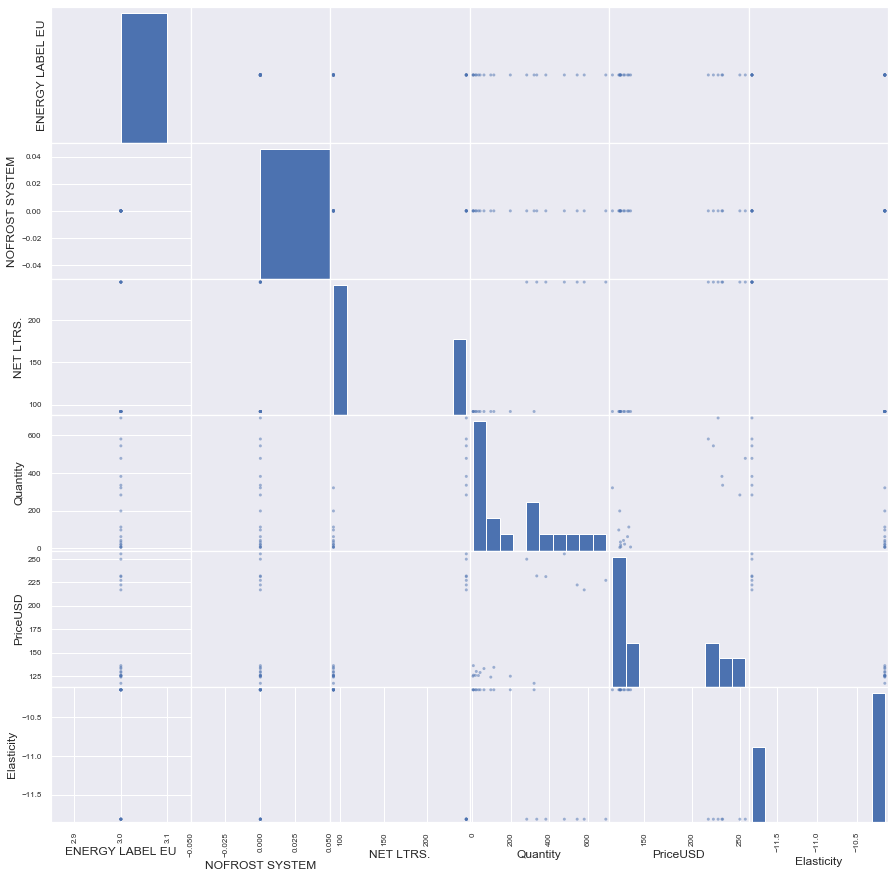

Кластер 5
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.     Quantity    PriceUSD  \
count        40.000000       40.000000   40.000000    40.000000   40.000000   
mean          3.275000        0.700000  315.600000   889.697933  472.760142   
std           0.452203        0.464095   65.850569   236.864444  161.847358   
min           3.000000        0.000000   90.000000   562.800000  115.165367   
25%           3.000000        0.000000  302.000000   733.250000  307.839665   
50%           3.000000        1.000000  336.000000   816.745191  548.213178   
75%           4.000000        1.000000  366.000000  1022.500000  580.563494   
max           4.000000        1.000000  367.000000  1590.000000  645.429020   

       Elasticity  
count   40.000000  
mean    -3.424498  
std      3.802208  
min    -11.815988  
25%     -5.370740  
50%     -2.718688  
75%     -0.504816  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

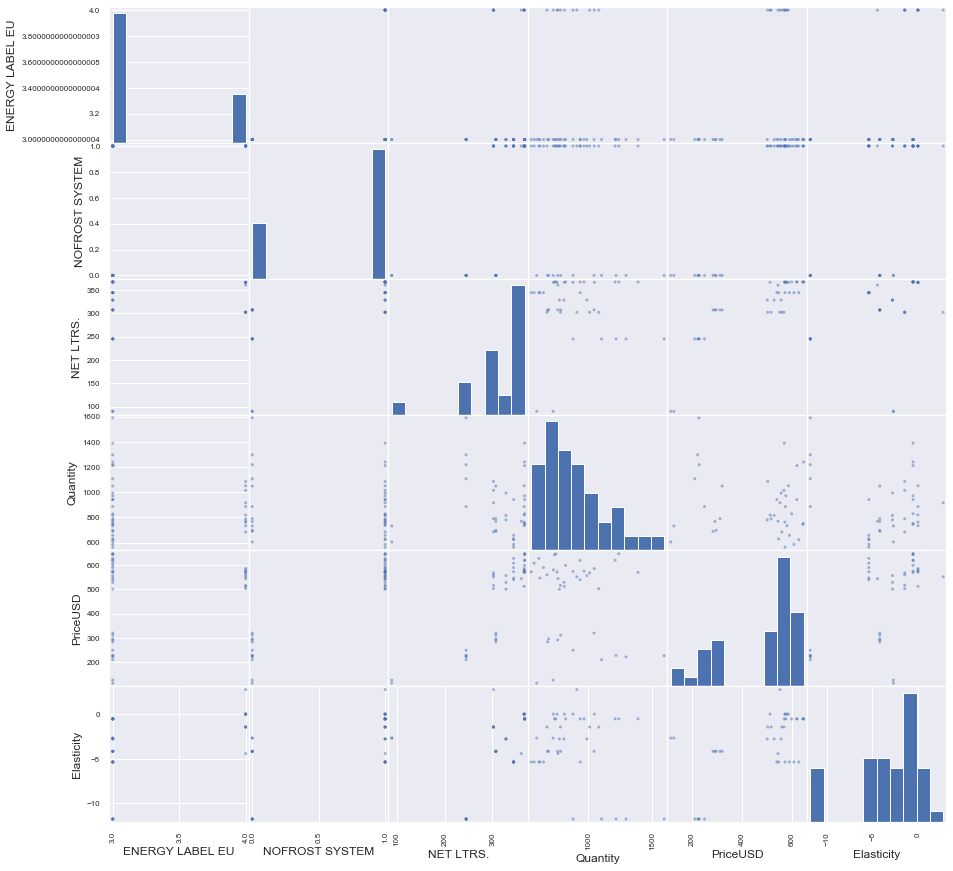

Кластер 6
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       259.000000           259.0  259.000000  259.000000  259.000000   
mean          1.733591             0.0  294.061776   23.352487  279.890818   
std           0.442937             0.0   46.559914   27.274933   57.212799   
min           1.000000             0.0  205.000000    1.000000   82.240372   
25%           1.000000             0.0  278.000000    4.437500  236.610096   
50%           2.000000             0.0  296.000000   13.333333  287.388271   
75%           2.000000             0.0  333.000000   30.250000  316.986389   
max           2.000000             0.0  384.000000  153.000000  388.210305   

       Elasticity  
count  259.000000  
mean    -0.108787  
std      0.376901  
min     -1.138110  
25%     -0.263523  
50%     -0.035574  
75%      0.106068  
max      0.842468  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

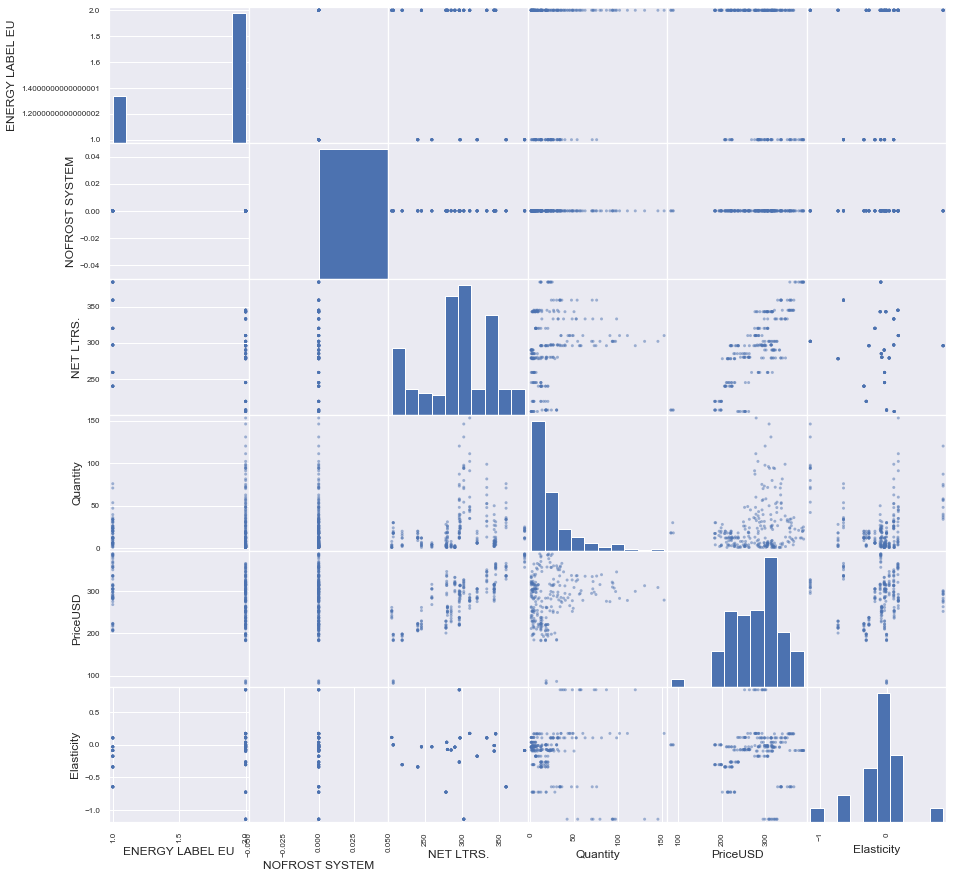

Кластер 7
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       137.000000           137.0  137.000000  137.000000   137.000000   
mean          3.306569             1.0  600.459854    9.621983  1604.710409   
std           0.462761             0.0   50.547301    9.590997   216.075158   
min           3.000000             1.0  486.000000    1.000000  1208.591368   
25%           3.000000             1.0  605.000000    3.000000  1429.187050   
50%           3.000000             1.0  626.000000    6.000000  1646.939586   
75%           4.000000             1.0  634.000000   13.000000  1756.784367   
max           4.000000             1.0  651.000000   45.000000  2511.804930   

       Elasticity  
count  137.000000  
mean    -0.016429  
std      0.027939  
min     -0.062638  
25%     -0.037067  
50%     -0.007408  
75%      0.000227  
max      0.022406  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

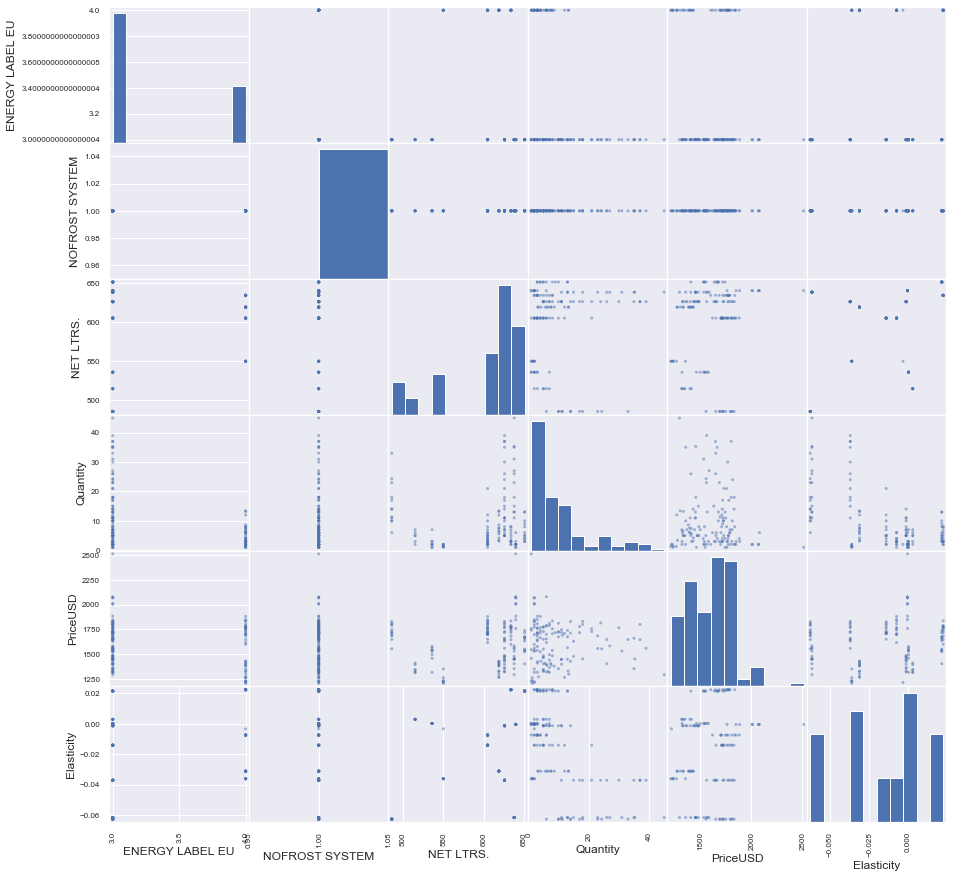

Кластер 8
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count           2006.0          2006.0  2006.000000  2006.000000  2006.000000   
mean               3.0             0.0   305.677468    24.455330   351.238237   
std                0.0             0.0    37.130949    32.744874   105.908733   
min                3.0             0.0   223.000000    -2.000000   153.325751   
25%                3.0             0.0   278.000000     4.000000   289.550605   
50%                3.0             0.0   308.000000    11.000000   332.059932   
75%                3.0             0.0   332.000000    30.286157   373.670459   
max                3.0             0.0   393.000000   241.000000   930.692078   

        Elasticity  
count  2006.000000  
mean      0.021108  
std       0.387104  
min      -1.903171  
25%      -0.088283  
50%       0.012306  
75%       0.106726  
max       2.055882  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

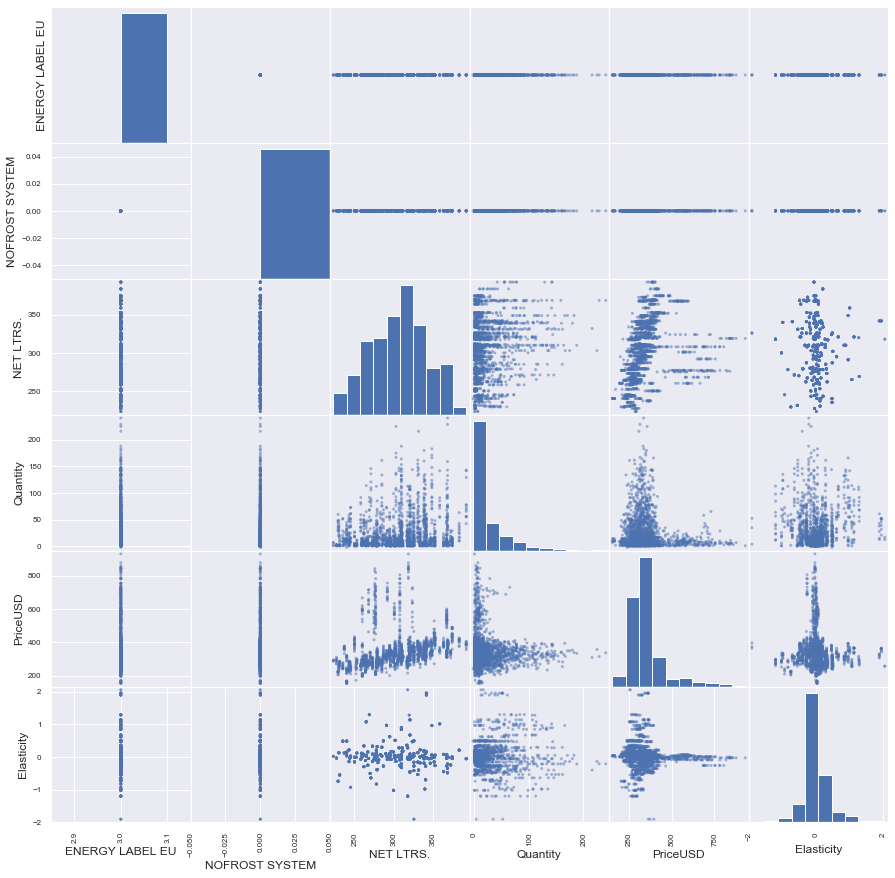

Кластер 9
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       174.000000      174.000000  174.000000  174.000000  174.000000   
mean          3.373563        0.896552  330.626437  371.844424  516.701752   
std           0.485146        0.305422   37.858935  118.272963  105.326131   
min           3.000000        0.000000  212.000000  198.400000  164.127294   
25%           3.000000        1.000000  302.000000  281.000000  476.954917   
50%           3.000000        1.000000  341.500000  353.900000  536.490219   
75%           4.000000        1.000000  366.000000  452.250000  582.250579   
max           4.000000        1.000000  369.000000  802.062727  709.108571   

       Elasticity  
count  174.000000  
mean    -0.426554  
std      1.596317  
min     -5.370740  
25%     -1.395638  
50%     -0.312873  
75%      0.455472  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

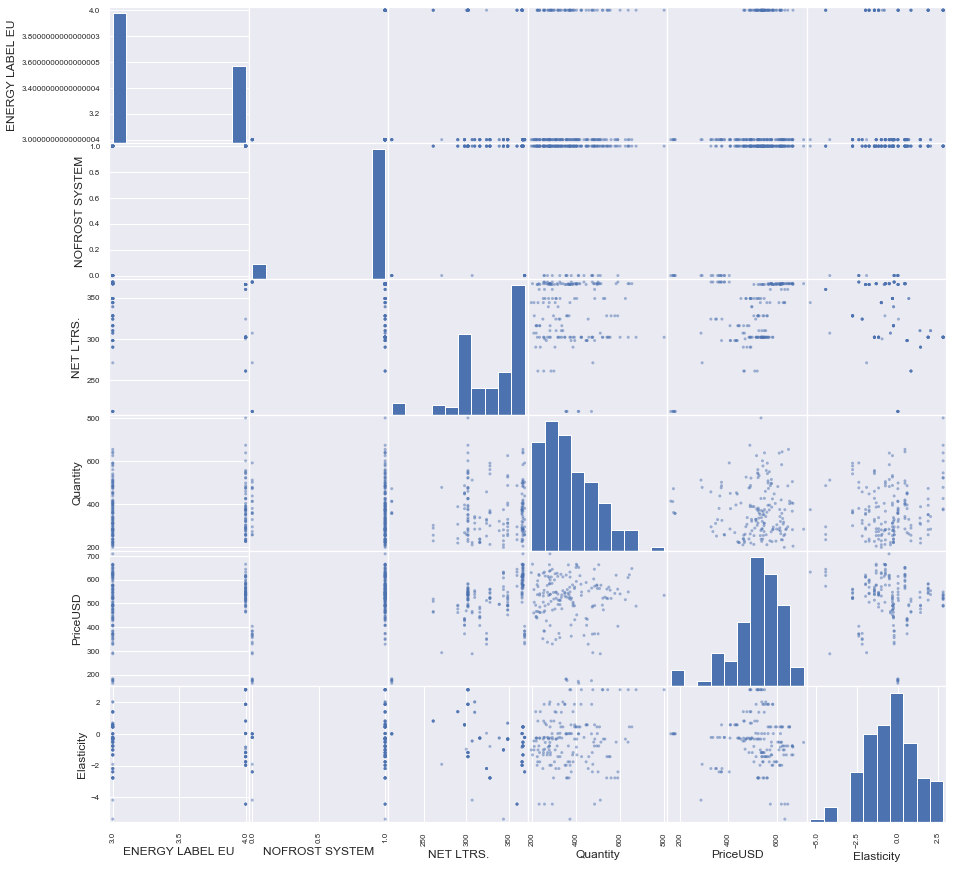

Кластер 10
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.    Quantity    PriceUSD  \
count              9.0             9.0        9.0    9.000000    9.000000   
mean               3.0             0.0      213.0  469.000000  186.047872   
std                0.0             0.0        0.0  247.244818    5.413783   
min                3.0             0.0      213.0  104.000000  178.051725   
25%                3.0             0.0      213.0  324.000000  183.187402   
50%                3.0             0.0      213.0  457.000000  187.211267   
75%                3.0             0.0      213.0  464.000000  188.549703   
max                3.0             0.0      213.0  977.000000  193.524693   

       Elasticity  
count    9.000000  
mean   -22.929611  
std      0.000000  
min    -22.929611  
25%    -22.929611  
50%    -22.929611  
75%    -22.929611  
max    -22.929611  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN          

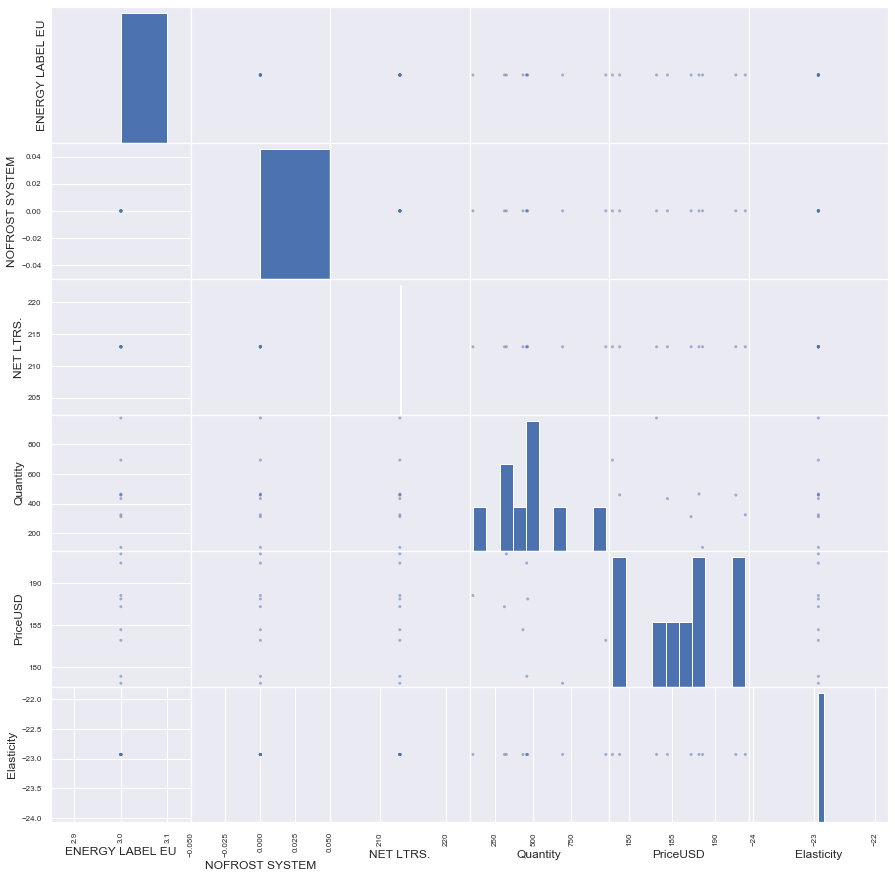

Кластер 11
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       333.000000      333.000000  333.000000  333.000000   333.000000   
mean          4.192192        0.813814  356.639640    5.029589  1184.580468   
std           0.394616        0.389843   66.341458    5.120767   234.623188   
min           4.000000        0.000000  237.000000    1.000000   834.238160   
25%           4.000000        1.000000  307.000000    2.000000   996.506007   
50%           4.000000        1.000000  360.000000    3.651685  1116.611204   
75%           4.000000        1.000000  418.000000    5.800000  1350.304118   
max           5.000000        1.000000  505.000000   39.000000  1971.058245   

       Elasticity  
count  333.000000  
mean    -0.008658  
std      0.022177  
min     -0.092559  
25%     -0.014859  
50%     -0.002218  
75%      0.002188  
max      0.041490  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

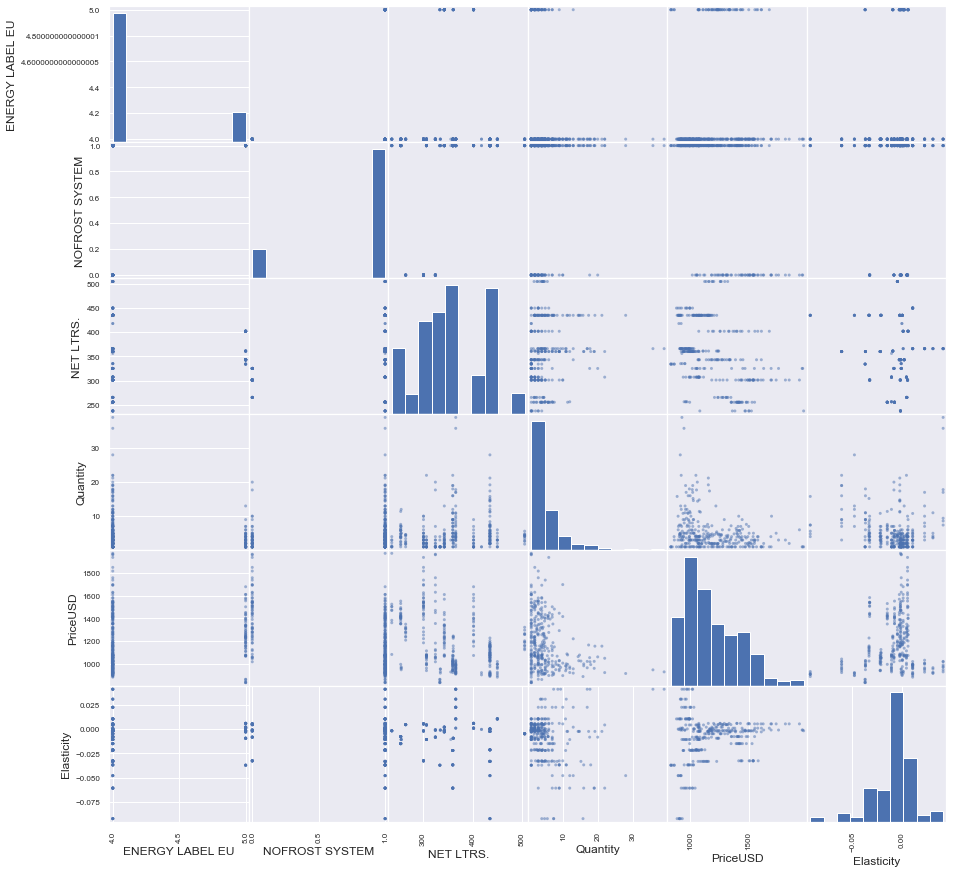

Кластер 12
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       831.000000           831.0  831.000000  831.000000  831.000000   
mean          2.961492             0.0  144.533093   27.303542  196.370550   
std           0.252142             0.0   60.925916   35.335487   81.152558   
min           2.000000             0.0    0.000000   -1.000000    0.000000   
25%           3.000000             0.0   97.000000    4.000000  149.798496   
50%           3.000000             0.0  146.000000   12.000000  193.987083   
75%           3.000000             0.0  207.000000   36.000000  228.541569   
max           4.000000             0.0  230.000000  220.360909  746.947794   

       Elasticity  
count  831.000000  
mean     0.188547  
std      0.628099  
min     -1.452347  
25%     -0.090525  
50%      0.049974  
75%      0.480163  
max      2.578980  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

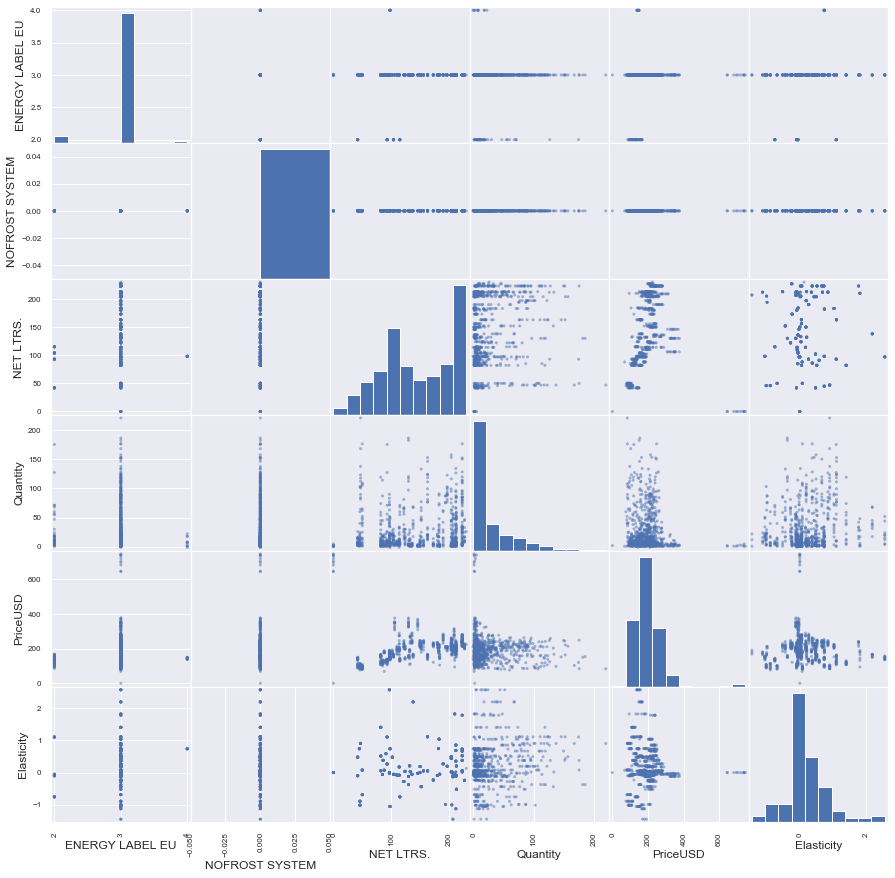

Кластер 13
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count            319.0           319.0  319.000000  319.000000  319.000000   
mean               4.0             0.0  322.025078   12.865324  483.990805   
std                0.0             0.0   39.837950   16.183605  157.482879   
min                4.0             0.0  231.000000   -1.000000  239.013902   
25%                4.0             0.0  294.000000    3.000000  352.949137   
50%                4.0             0.0  337.000000    6.300000  443.797114   
75%                4.0             0.0  346.000000   15.000000  566.393565   
max                4.0             0.0  392.000000  110.500000  960.229339   

       Elasticity  
count  319.000000  
mean     0.022932  
std      0.157286  
min     -0.238619  
25%     -0.025225  
50%     -0.002624  
75%      0.033686  
max      0.706790  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN 

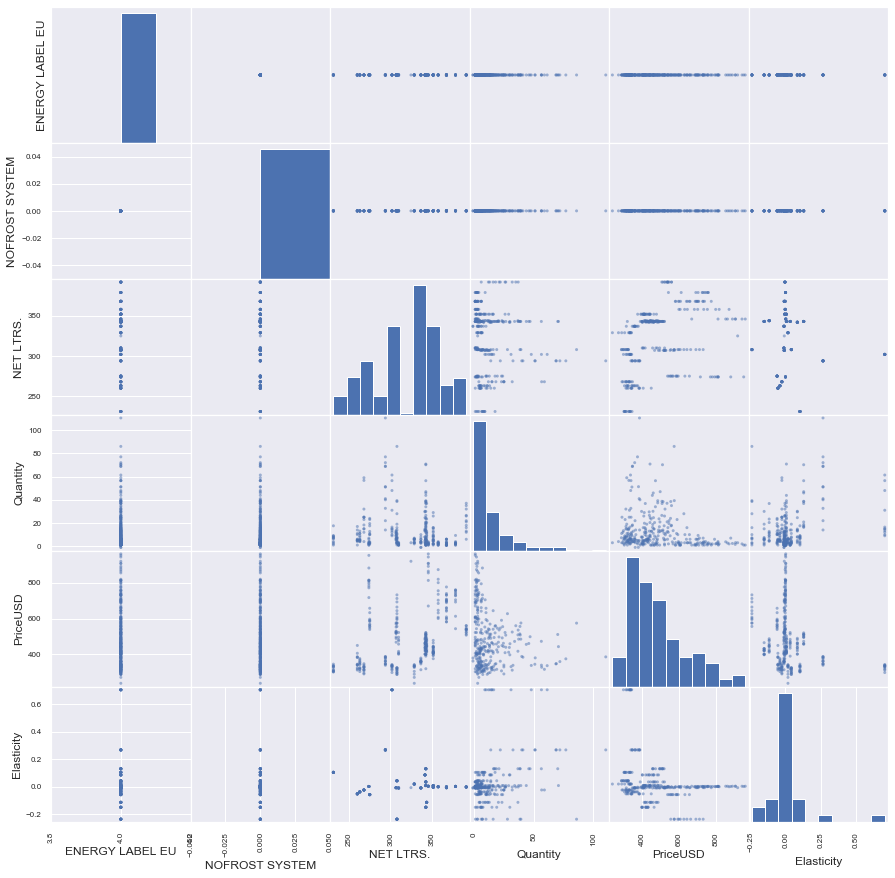

Кластер 14
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       511.000000           511.0  511.000000  511.000000   511.000000   
mean          3.156556             1.0  513.291585   28.140570   849.233581   
std           0.471700             0.0   60.458437   38.235782   166.330018   
min           2.000000             1.0  367.000000   -1.000000   448.489447   
25%           3.000000             1.0  482.000000    3.000000   735.909479   
50%           3.000000             1.0  517.000000   10.000000   846.249253   
75%           3.000000             1.0  550.000000   37.391509   986.854164   
max           4.000000             1.0  626.000000  209.000000  1264.908015   

       Elasticity  
count  511.000000  
mean    -0.101337  
std      0.236512  
min     -0.809636  
25%     -0.227900  
50%     -0.013678  
75%      0.011951  
max      0.396754  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

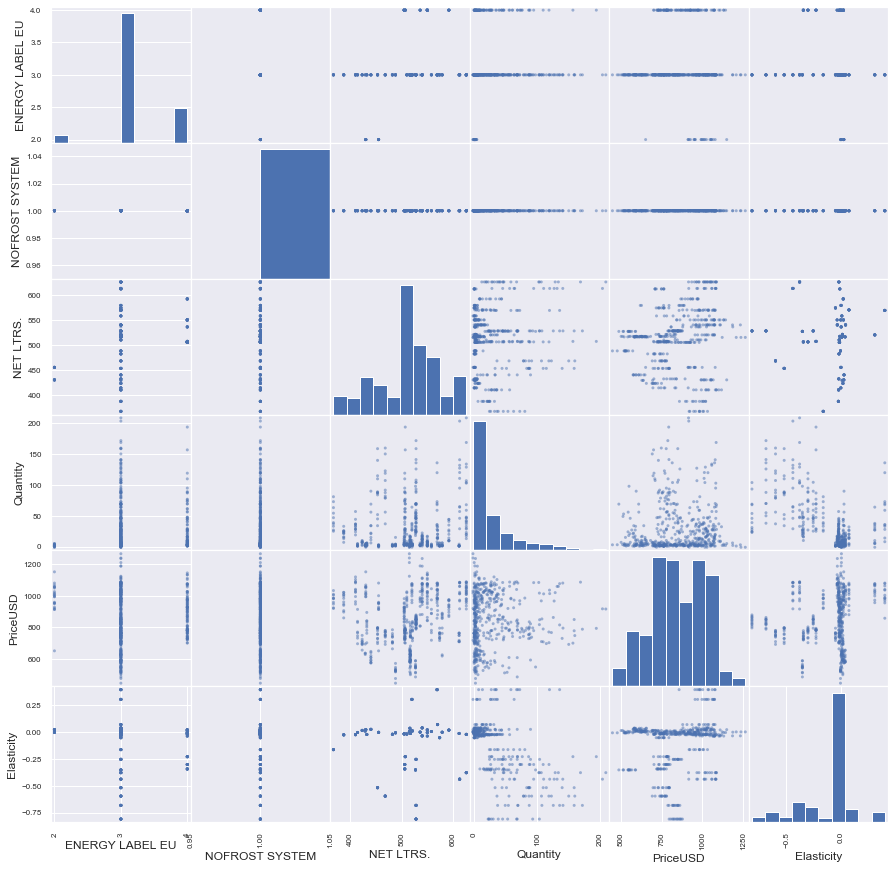

Кластер 15
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       188.000000      188.000000  188.000000  188.000000  188.000000   
mean          3.015957        0.026596  208.244681  156.382466  225.724576   
std           0.125645        0.161328   97.891699   93.678198  111.094290   
min           3.000000        0.000000   55.000000    7.000000   79.360538   
25%           3.000000        0.000000   97.000000   87.300000  134.430511   
50%           3.000000        0.000000  212.000000  149.200000  202.175402   
75%           3.000000        0.000000  293.000000  210.247273  284.048208   
max           4.000000        1.000000  369.000000  437.000000  640.719913   

       Elasticity  
count  188.000000  
mean    -2.250598  
std      1.264355  
min     -5.370740  
25%     -2.826156  
50%     -2.345111  
75%     -1.109767  
max      0.195481  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

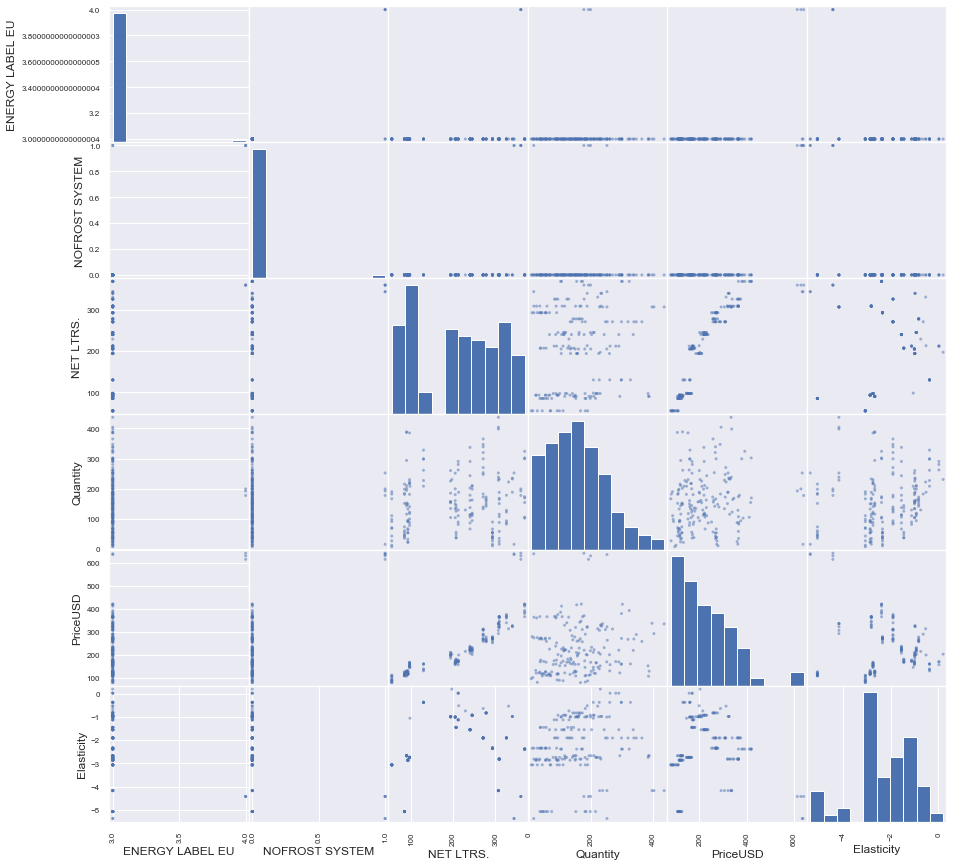

In [26]:
for i in np.unique(km.labels_+1):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_kmean_nd_15']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_kmean_nd_15']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_kmean_nd_15']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [ ]:
Побудуємо кластеризацію на отриманих даних T-SNE

In [27]:
clustering_criterion_kmeans(digits_proj_norm)

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.35066742
calinski harabasz score: 4504.749934711593
davies_bouldin_score: 1.171955713043461
Clusters: 3
silhouette_score: 0.41498905
calinski harabasz score: 6869.374288586837
davies_bouldin_score: 0.7989864495207374
Clusters: 4
silhouette_score: 0.4002723
calinski harabasz score: 7263.990427636897
davies_bouldin_score: 0.7785341502980524
Clusters: 5
silhouette_score: 0.40093905
calinski harabasz score: 7218.158747788047
davies_bouldin_score: 0.8777541989112475
Clusters: 6
silhouette_score: 0.40021014
calinski harabasz score: 7381.616505863486
davies_bouldin_score: 0.8258000559573361
Clusters: 7
silhouette_score: 0.39870653
calinski harabasz score: 7381.794366640945
davies_bouldin_score: 0.8048113111480485
Clusters: 8
silhouette_score: 0.39544657
calinski harabasz score: 7709.523278769251
davies_bouldin_score: 0.788168447100808
Clusters: 9
silhouette_score: 0.40392512
calinski harabasz score: 7993.454126718384
davies_bouldin_score: 0.

In [28]:
# будуємо кластеризацію методом KMeans
# n_clusters - к-ть кластерів
km = KMeans(n_clusters=15).fit(digits_proj_norm)

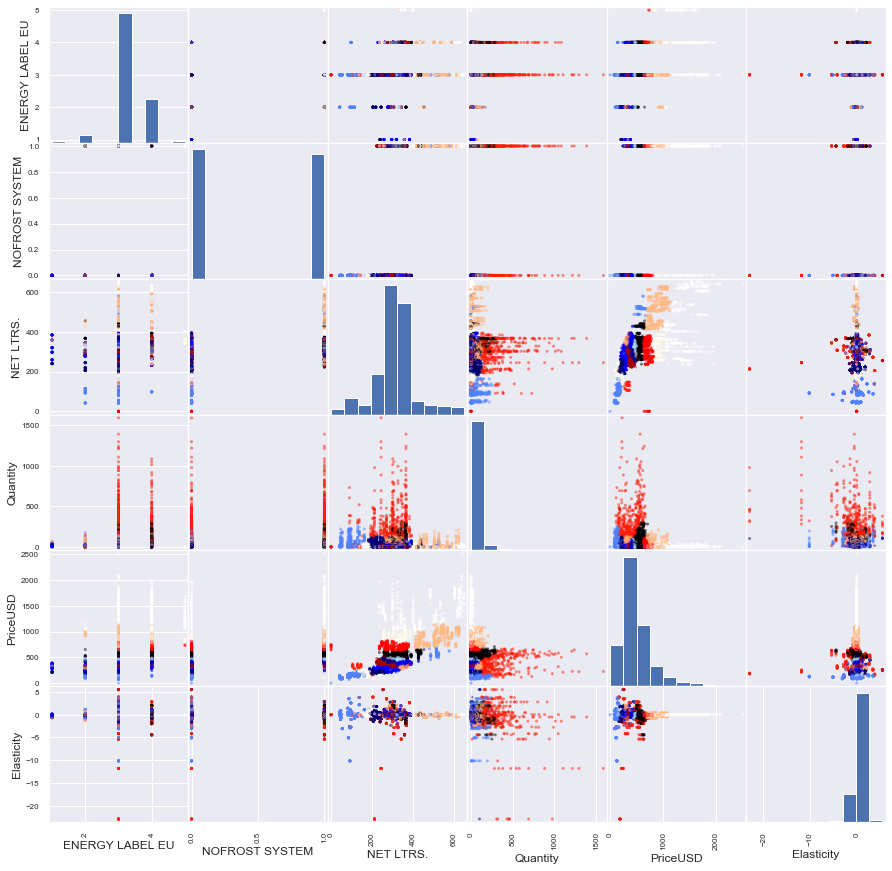

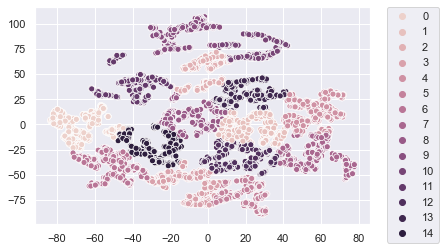

In [29]:
scatter_matrix(data_for_clust, c=km.labels_, cmap='flag', figsize=(15,15))
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=km.labels_, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [30]:
data['cluster_kmean_t_sne']=km.labels_+1

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       606.000000      606.000000  606.000000  606.000000  606.000000   
mean          3.623762        0.793729  327.891089   20.868929  680.339258   
std           0.491612        0.404961   55.721071   25.048220   50.205721   
min           3.000000        0.000000    0.000000    1.000000  587.668869   
25%           3.000000        1.000000  308.000000    4.000000  639.025082   
50%           4.000000        1.000000  343.000000   10.000000  670.842186   
75%           4.000000        1.000000  360.000000   28.975000  715.497103   
max           5.000000        1.000000  379.000000  154.000000  827.670944   

       Elasticity  
count  606.000000  
mean    -0.123432  
std      0.469217  
min     -5.370740  
25%     -0.100904  
50%     -0.014254  
75%      0.002632  
max      0.558278  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

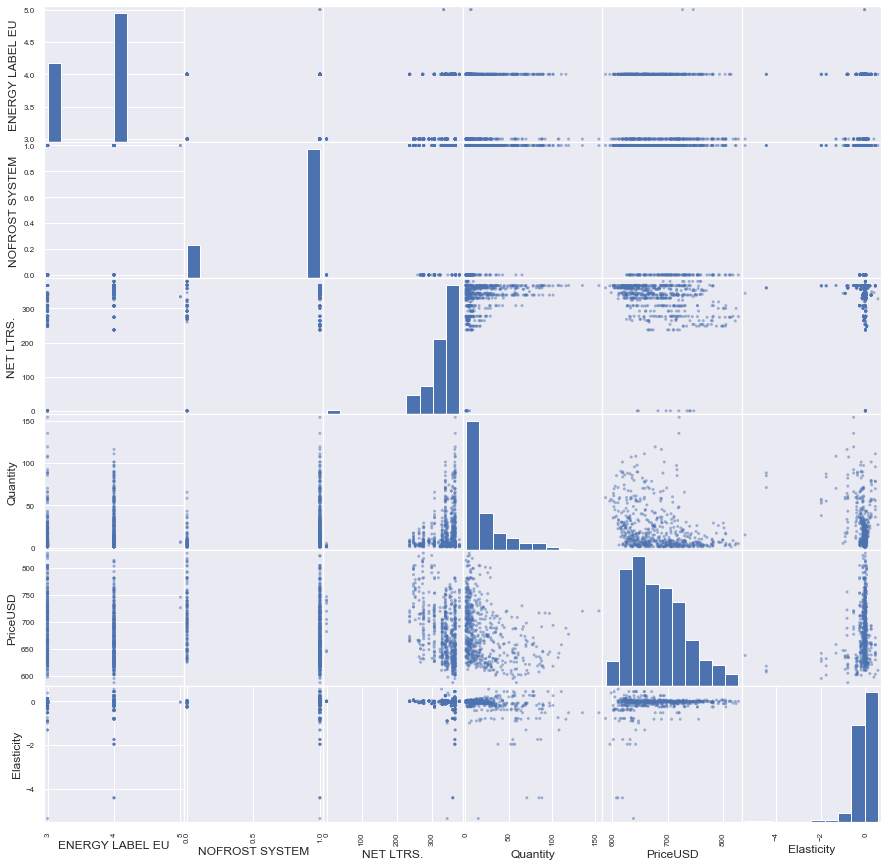

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       562.000000      562.000000  562.000000  562.000000  562.000000   
mean          2.896797        0.039146  321.583630   55.642714  317.416945   
std           0.409369        0.194115   25.306202   36.624507   28.560380   
min           1.000000        0.000000  262.000000    1.000000  242.467460   
25%           3.000000        0.000000  303.000000   26.025000  297.486902   
50%           3.000000        0.000000  324.000000   52.000000  316.024219   
75%           3.000000        0.000000  341.000000   81.841667  335.989234   
max           4.000000        1.000000  373.000000  153.000000  397.273429   

       Elasticity  
count  562.000000  
mean     0.060463  
std      0.845459  
min     -2.814364  
25%     -0.279690  
50%      0.031718  
75%      0.491943  
max      2.055882  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

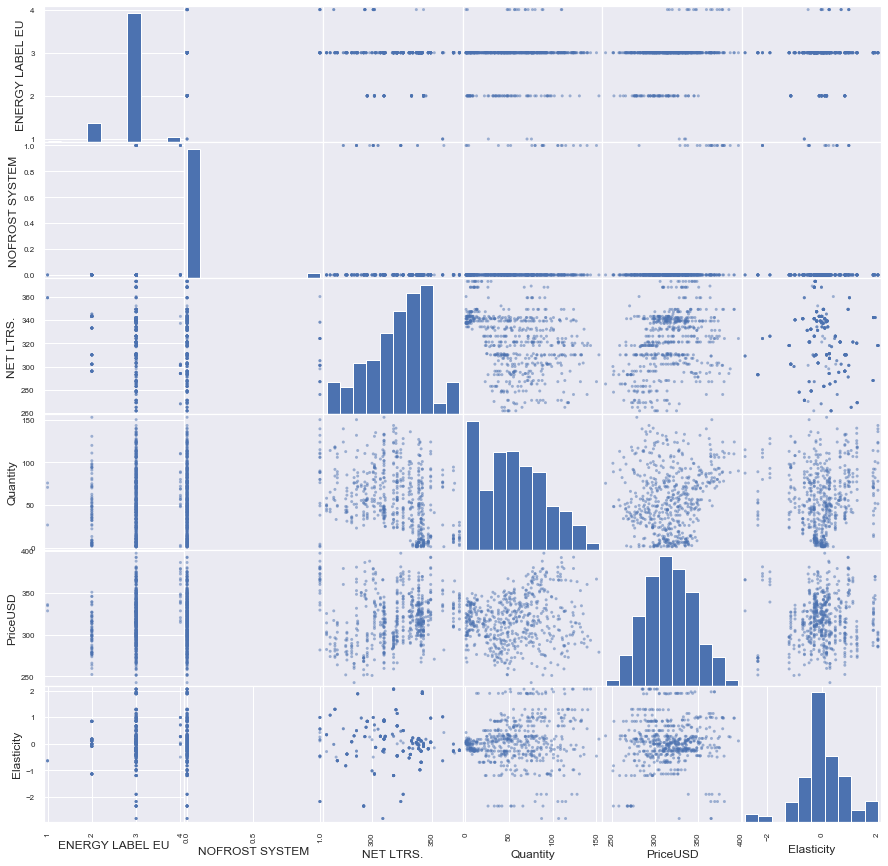

Кластер 3
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       372.000000      372.000000  372.000000  372.000000   372.000000   
mean          3.448925        0.553763  276.322581   10.236416   646.366130   
std           0.554398        0.497771   87.832561   12.065553   354.927523   
min           2.000000        0.000000  114.000000   -3.000000    82.240372   
25%           3.000000        0.000000  182.000000    3.000000   224.754951   
50%           3.000000        1.000000  303.500000    6.000000   847.835932   
75%           4.000000        1.000000  360.000000   12.200000   942.201812   
max           5.000000        1.000000  410.000000   81.000000  1082.826066   

       Elasticity  
count  372.000000  
mean     0.043247  
std      0.335582  
min     -0.438826  
25%     -0.036893  
50%     -0.006203  
75%      0.031199  
max      3.857916  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

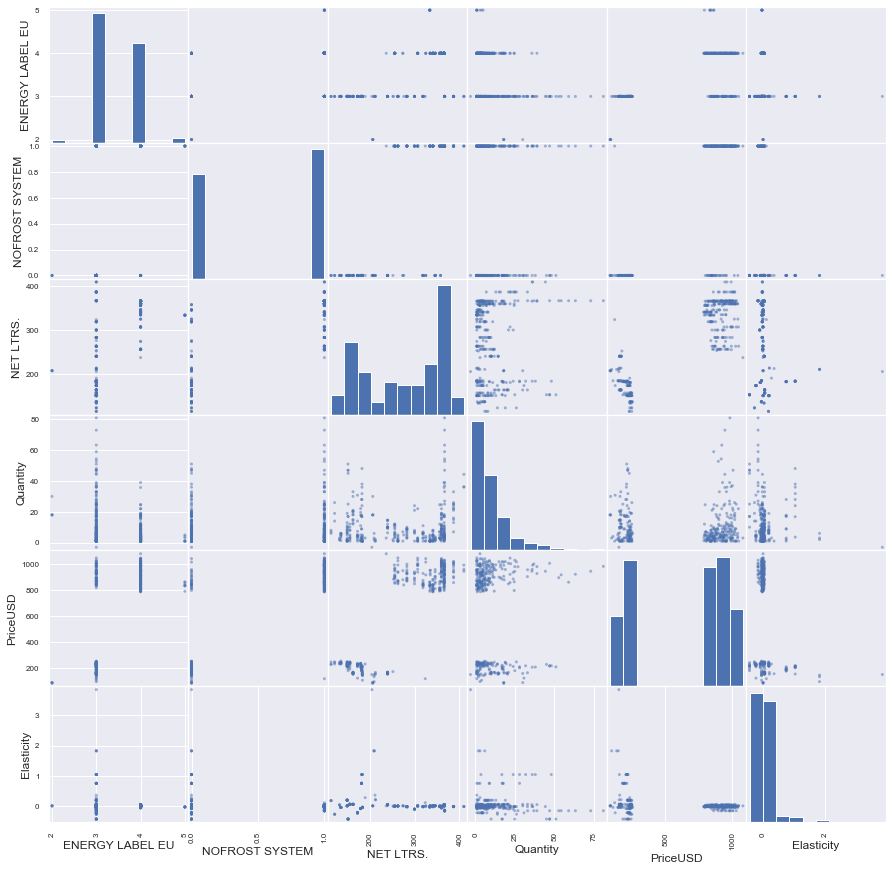

Кластер 4
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       484.000000      484.000000  484.000000  484.000000  484.000000   
mean          3.235537        0.834711  326.927686   14.440282  464.443669   
std           0.521085        0.371826   18.706542   16.071663   18.168423   
min           2.000000        0.000000  277.000000   -1.000000  422.595899   
25%           3.000000        1.000000  310.000000    3.300000  451.786593   
50%           3.000000        1.000000  324.000000    8.000000  464.895361   
75%           4.000000        1.000000  342.000000   20.000000  477.707675   
max           4.000000        1.000000  373.000000   96.000000  508.094065   

       Elasticity  
count  484.000000  
mean     0.066719  
std      0.394388  
min     -0.952429  
25%     -0.022684  
50%      0.018541  
75%      0.095369  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

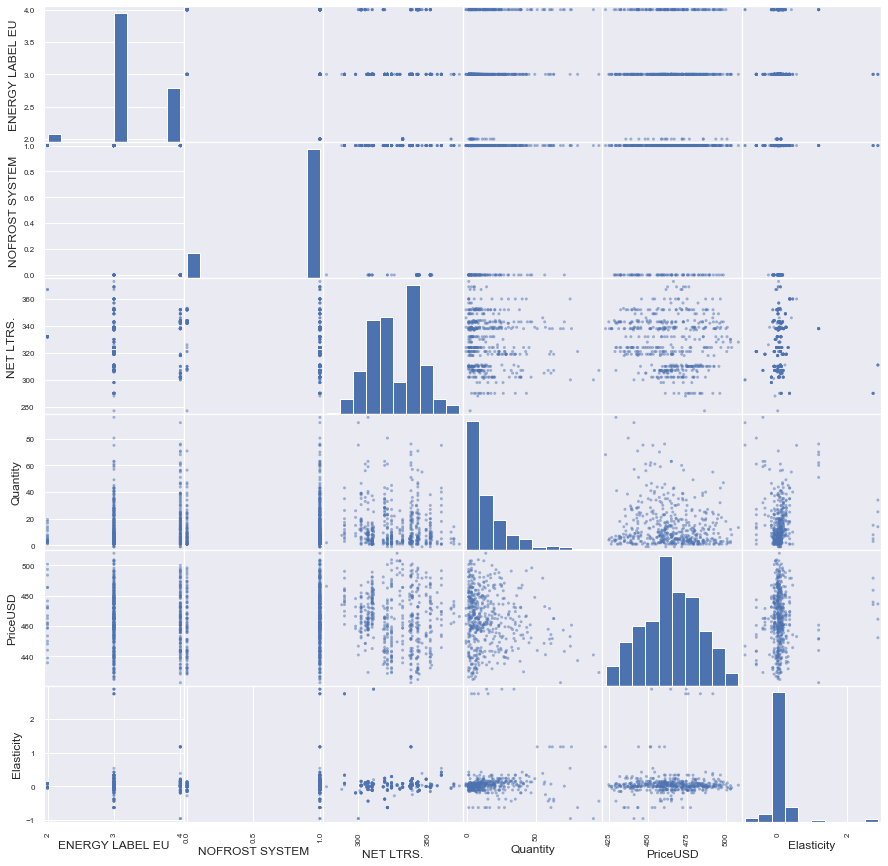

Кластер 5
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       624.000000      624.000000  624.000000  624.000000  624.000000   
mean          2.868590        0.041667  278.461538    9.493295  280.892720   
std           0.585025        0.199987   27.586056    8.571509   26.621999   
min           1.000000        0.000000  209.000000    1.000000  199.793125   
25%           3.000000        0.000000  263.000000    3.000000  264.828641   
50%           3.000000        0.000000  279.000000    6.991667  283.444760   
75%           3.000000        0.000000  297.000000   14.000000  300.245281   
max           4.000000        1.000000  334.000000   59.300000  336.068193   

       Elasticity  
count  624.000000  
mean     0.024424  
std      0.342688  
min     -2.345111  
25%     -0.071099  
50%      0.026943  
75%      0.112383  
max      2.055882  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

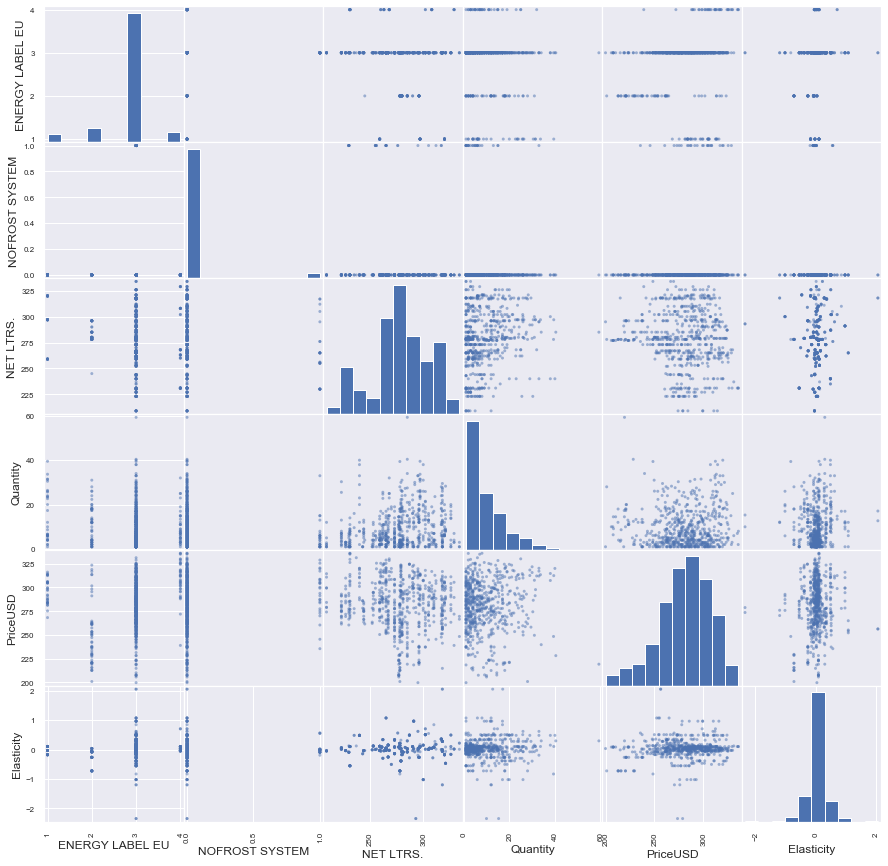

Кластер 6
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       426.000000      426.000000  426.000000  426.000000  426.000000   
mean          3.232394        0.906103  295.234742   15.775229  428.311605   
std           0.485054        0.292028   17.171147   16.060466   24.968054   
min           2.000000        0.000000  246.000000   -1.000000  376.535880   
25%           3.000000        1.000000  287.000000    4.300000  409.461989   
50%           3.000000        1.000000  301.000000   10.000000  427.616974   
75%           4.000000        1.000000  307.000000   21.900000  444.873202   
max           4.000000        1.000000  324.000000   84.100000  497.453630   

       Elasticity  
count  426.000000  
mean     0.076855  
std      0.447228  
min     -0.952429  
25%     -0.075976  
50%      0.005319  
75%      0.102285  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

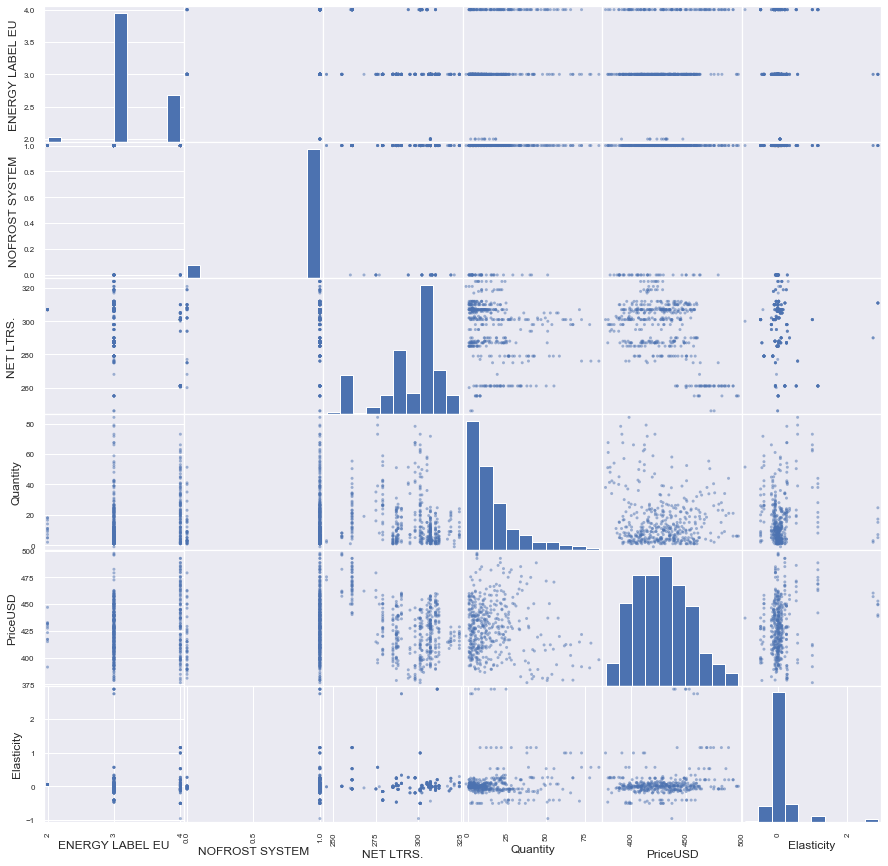

Кластер 7
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       568.000000       568.00000  568.000000  568.000000  568.000000   
mean          3.339789         0.87500  357.732394   11.771701  556.870846   
std           0.509903         0.33101   28.287118   12.007074   37.116710   
min           2.000000         0.00000  318.000000   -1.000000  463.239086   
25%           3.000000         1.00000  338.000000    3.000000  527.438918   
50%           3.000000         1.00000  357.000000    7.000000  559.133478   
75%           4.000000         1.00000  367.000000   16.000000  585.326742   
max           4.000000         1.00000  455.000000   90.000000  656.881750   

       Elasticity  
count  568.000000  
mean     0.009892  
std      0.127274  
min     -0.821023  
25%     -0.036511  
50%      0.009044  
75%      0.031996  
max      0.558278  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

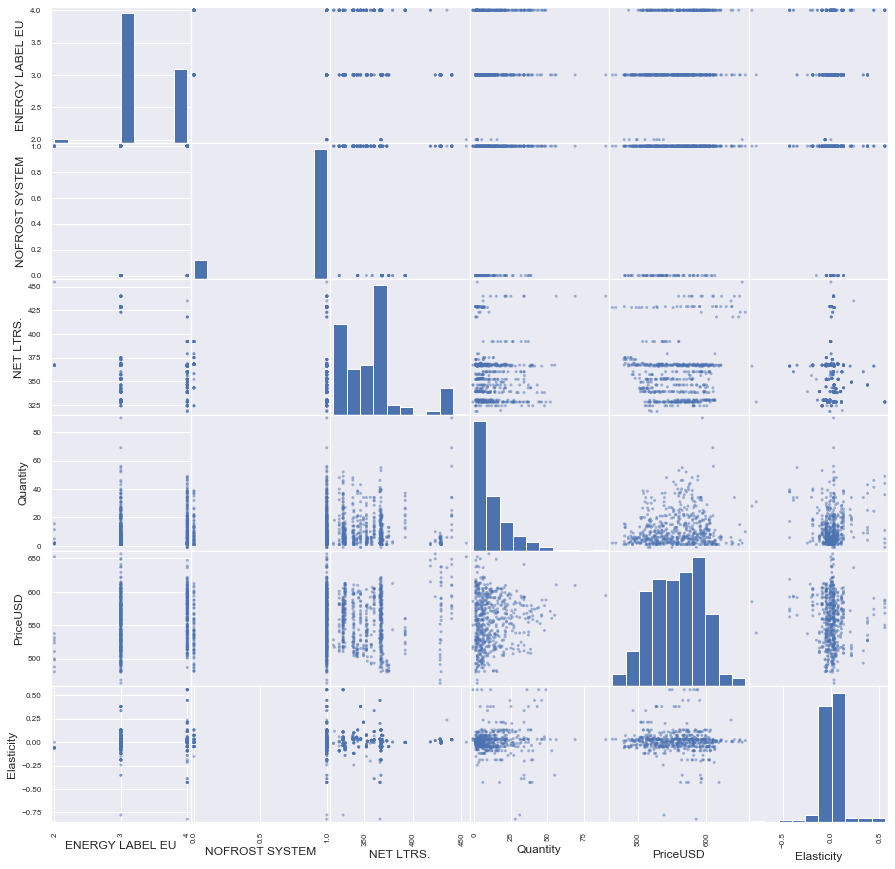

Кластер 8
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       597.000000      597.000000  597.000000  597.000000  597.000000   
mean          3.051926        0.247906  291.427136    8.955792  355.183132   
std           0.310310        0.432159   26.465759    7.923946   29.621991   
min           2.000000        0.000000  224.000000    1.000000  309.035554   
25%           3.000000        0.000000  279.000000    3.000000  334.598192   
50%           3.000000        0.000000  297.000000    6.300000  349.125713   
75%           3.000000        0.000000  310.000000   12.700000  369.097759   
max           4.000000        1.000000  329.000000   40.166667  475.665161   

       Elasticity  
count  597.000000  
mean     0.009395  
std      0.296045  
min     -2.814364  
25%     -0.053520  
50%      0.008117  
75%      0.069637  
max      1.137789  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

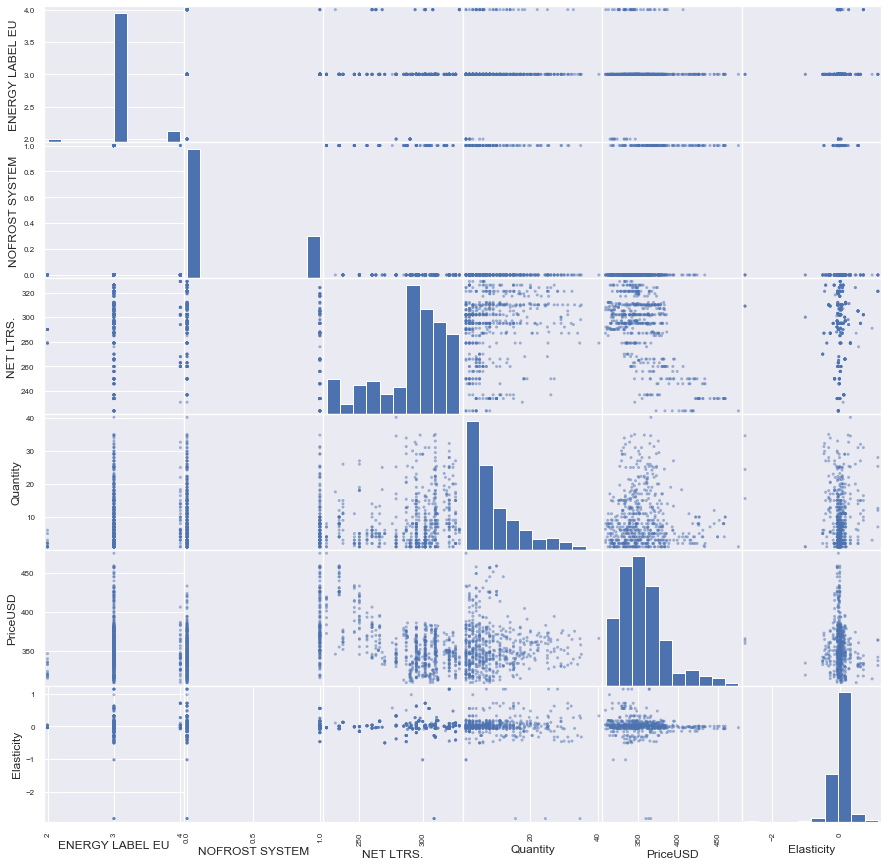

Кластер 9
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.     Quantity    PriceUSD  \
count       500.000000      500.000000  500.000000   500.000000  500.000000   
mean          3.146000        0.384000  281.666000   305.336640  371.831647   
std           0.359085        0.486845   77.085997   237.322440  137.518611   
min           2.000000        0.000000   90.000000     1.000000  107.239559   
25%           3.000000        0.000000  240.000000   156.712500  266.267421   
50%           3.000000        0.000000  302.000000   241.950000  348.381796   
75%           3.000000        1.000000  345.250000   388.072852  490.496890   
max           4.000000        1.000000  393.000000  1590.000000  665.293054   

       Elasticity  
count  500.000000  
mean    -0.683428  
std      3.904413  
min    -22.929611  
25%     -1.165968  
50%     -0.120491  
75%      0.825359  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

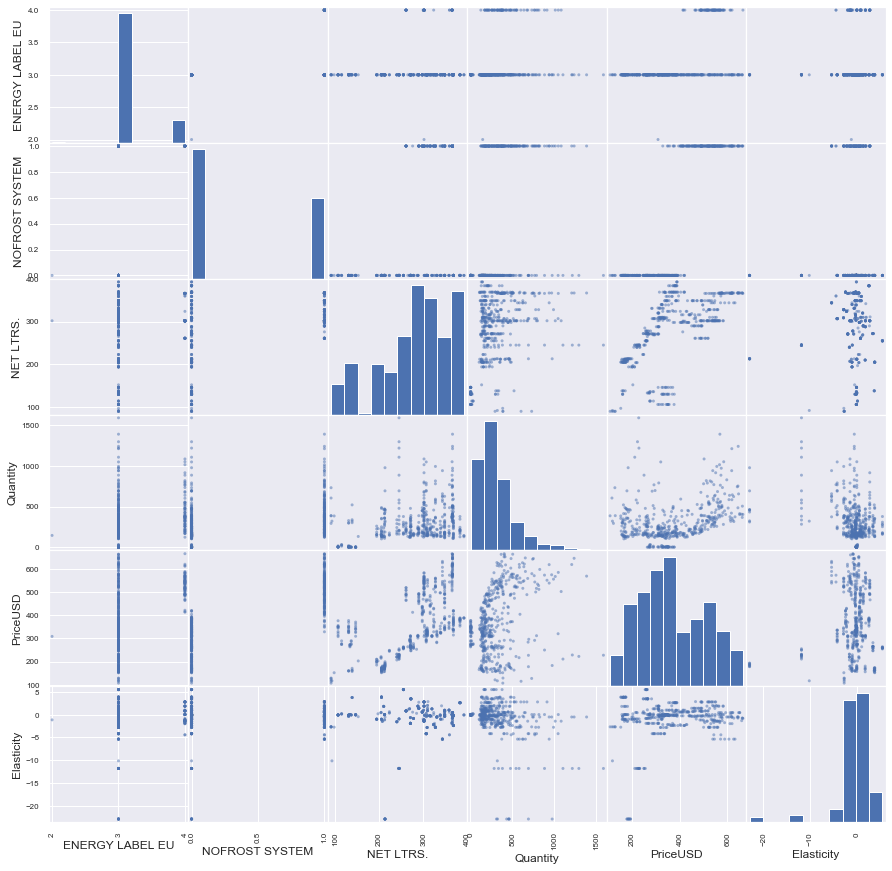

Кластер 10
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       468.000000           468.0  468.000000  468.000000   468.000000   
mean          3.384615             1.0  510.305556   29.099116   877.094043   
std           0.541173             0.0   61.230587   40.009565   116.947069   
min           2.000000             1.0  414.000000   -1.000000   670.516351   
25%           3.000000             1.0  450.000000    3.000000   778.551144   
50%           3.000000             1.0  516.000000    9.000000   855.767417   
75%           4.000000             1.0  550.000000   41.250000   973.704715   
max           4.000000             1.0  626.000000  209.000000  1143.731528   

       Elasticity  
count  468.000000  
mean    -0.085113  
std      0.261382  
min     -0.809636  
25%     -0.227900  
50%     -0.011835  
75%      0.010737  
max      0.462785  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 1.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


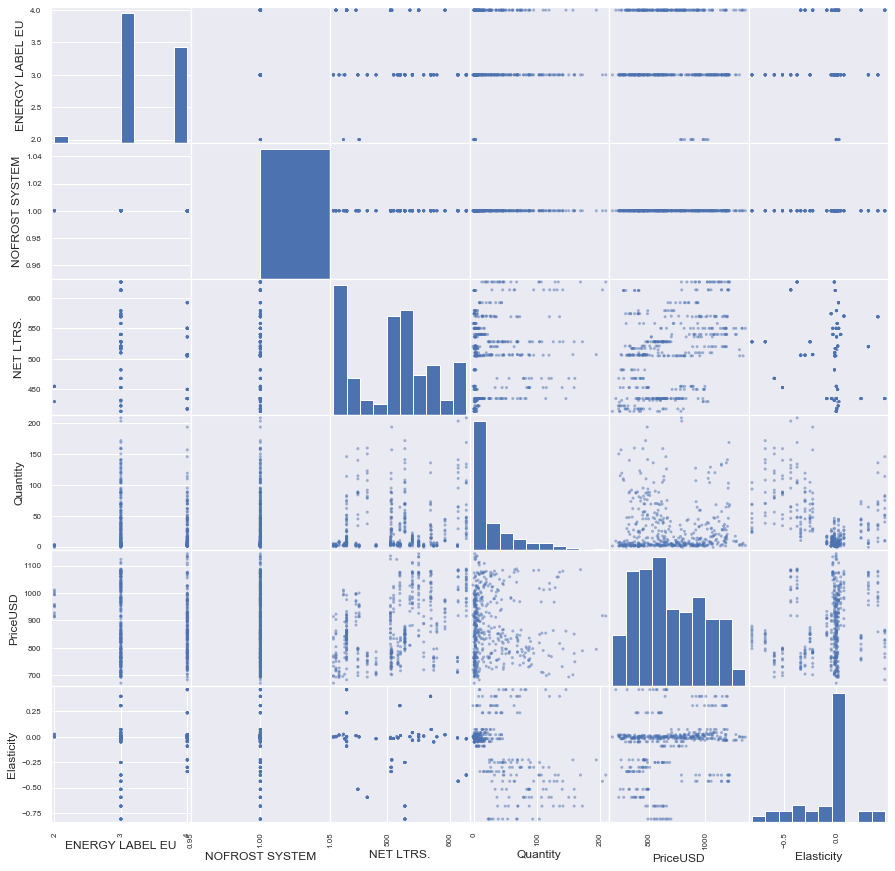

Кластер 11
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       380.000000      380.000000  380.000000  380.000000   380.000000   
mean          3.815789        0.842105  446.278947    6.578890  1397.268507   
std           0.710095        0.365123  134.274032    8.144717   261.908947   
min           2.000000        0.000000  237.000000   -1.000000  1016.553381   
25%           3.000000        1.000000  325.000000    2.000000  1173.802825   
50%           4.000000        1.000000  435.000000    4.000000  1381.152795   
75%           4.000000        1.000000  605.000000    7.000000  1570.039597   
max           5.000000        1.000000  651.000000   57.000000  2511.804930   

       Elasticity  
count  380.000000  
mean    -0.009821  
std      0.020305  
min     -0.062638  
25%     -0.021265  
50%     -0.002458  
75%      0.001160  
max      0.023892  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

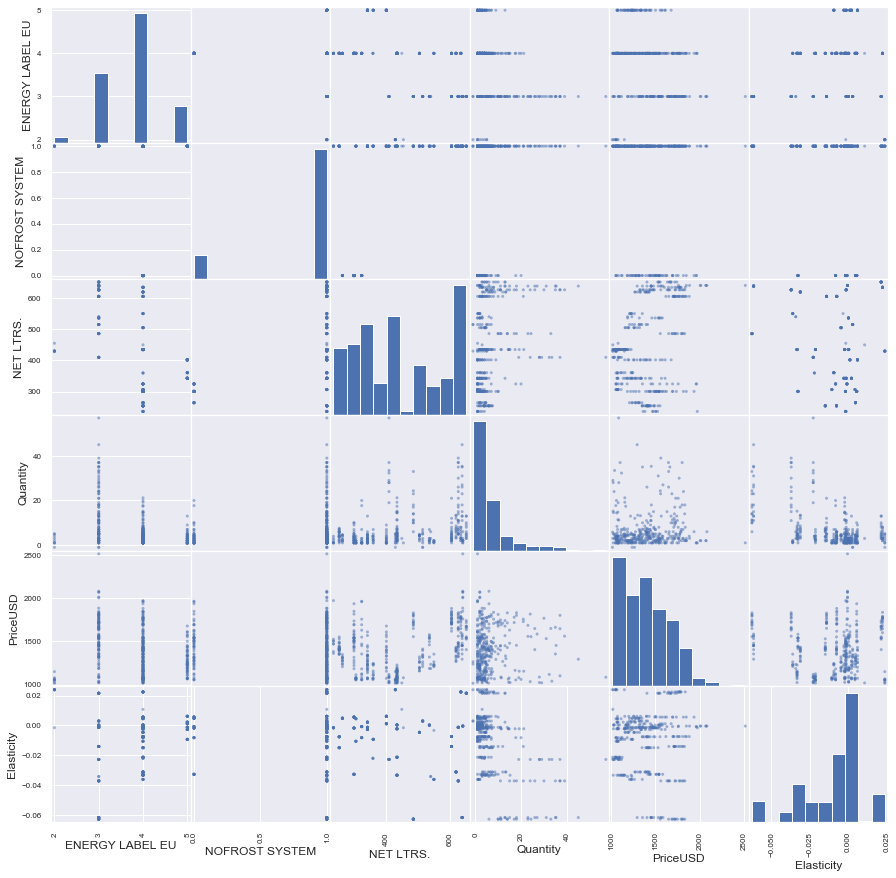

Кластер 12
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       530.000000      530.000000  530.000000  530.000000  530.000000   
mean          2.939623        0.133962  147.971698   43.093787  200.311097   
std           0.313731        0.340934  147.291608   56.967548  155.902346   
min           2.000000        0.000000    0.000000   -1.000000    0.000000   
25%           3.000000        0.000000   82.750000    5.000000  119.660391   
50%           3.000000        0.000000   97.000000   15.000000  148.255708   
75%           3.000000        0.000000  124.000000   62.750000  181.694230   
max           4.000000        1.000000  579.000000  261.000000  682.788432   

       Elasticity  
count  530.000000  
mean    -0.229983  
std      2.081653  
min    -10.147207  
25%     -0.351548  
50%      0.007895  
75%      0.480163  
max      3.772702  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

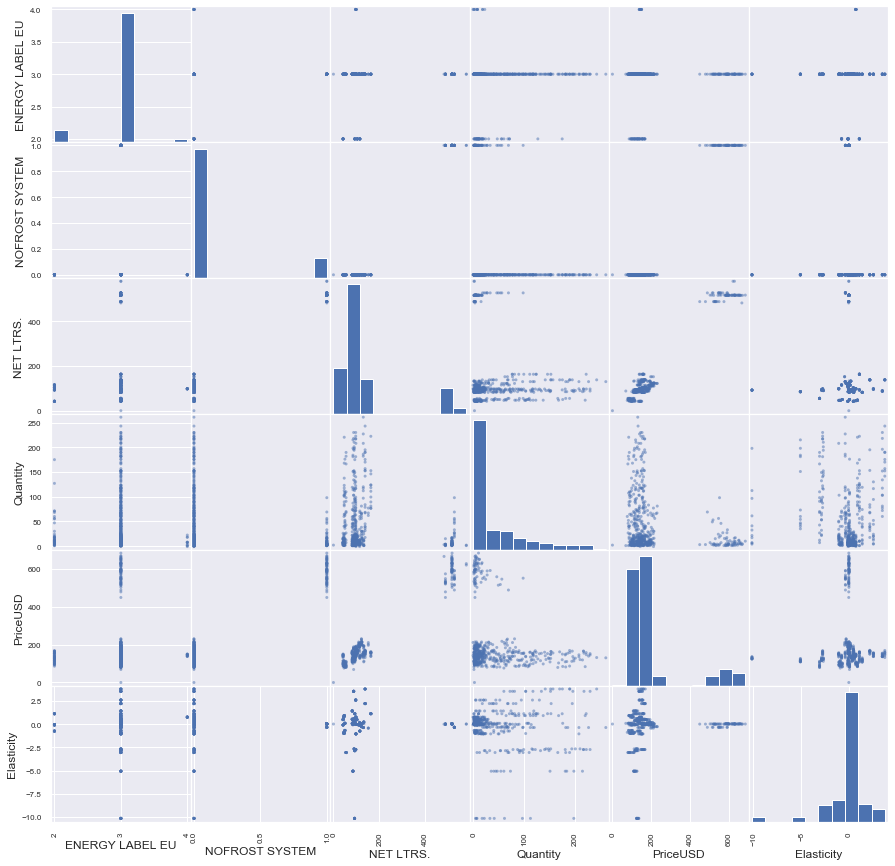

Кластер 13
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       517.000000      517.000000  517.000000  517.000000  517.000000   
mean          2.992263        0.226306  346.593810   18.761902  388.322014   
std           0.535501        0.418844   19.890821   19.890261   25.121046   
min           1.000000        0.000000  309.000000   -1.000000  317.453446   
25%           3.000000        0.000000  332.000000    4.000000  367.654875   
50%           3.000000        0.000000  342.000000   11.000000  388.062939   
75%           3.000000        0.000000  360.000000   27.300000  407.416412   
max           4.000000        1.000000  428.000000  105.000000  457.163292   

       Elasticity  
count  517.000000  
mean    -0.006576  
std      0.406219  
min     -2.814364  
25%     -0.070628  
50%     -0.001531  
75%      0.082041  
max      1.952064  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

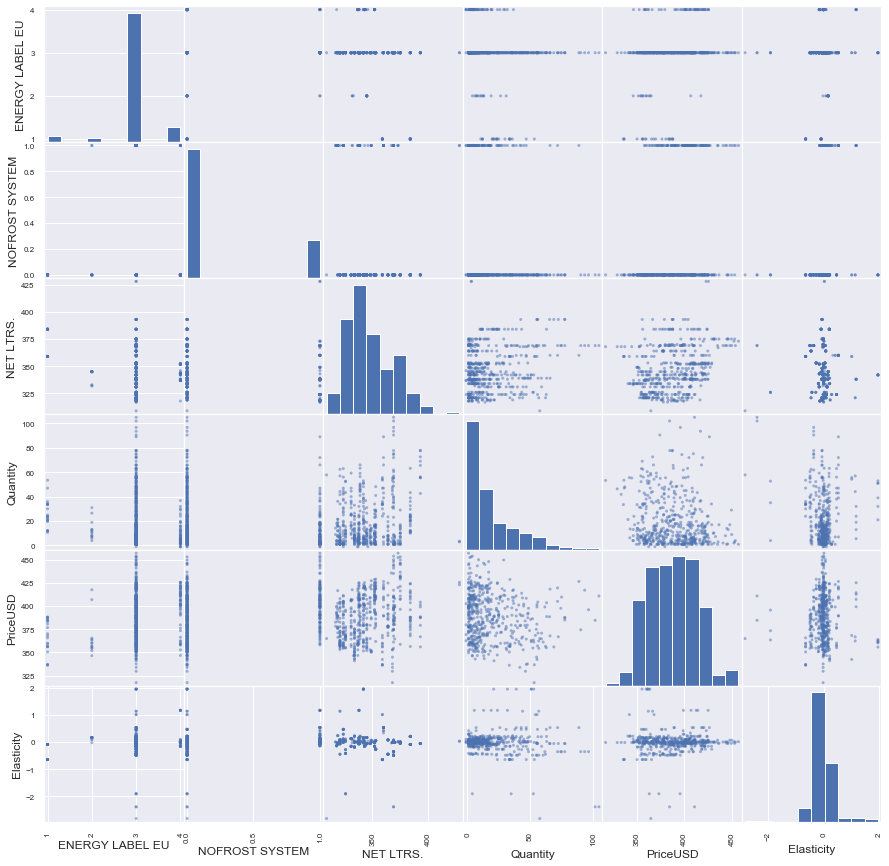

Кластер 14
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       486.000000      486.000000  486.000000  486.000000  486.000000   
mean          2.876543        0.004115  224.440329   34.080522  223.323520   
std           0.397395        0.064084   20.699906   32.989144   25.970601   
min           1.000000        0.000000  183.000000   -2.000000  161.060500   
25%           3.000000        0.000000  207.000000    8.000000  204.172732   
50%           3.000000        0.000000  223.000000   22.950000  222.889566   
75%           3.000000        0.000000  240.000000   50.840000  243.003538   
max           3.000000        1.000000  285.000000  137.000000  284.357100   

       Elasticity  
count  486.000000  
mean     0.069653  
std      1.285050  
min    -22.929611  
25%     -0.114245  
50%      0.025894  
75%      0.378136  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

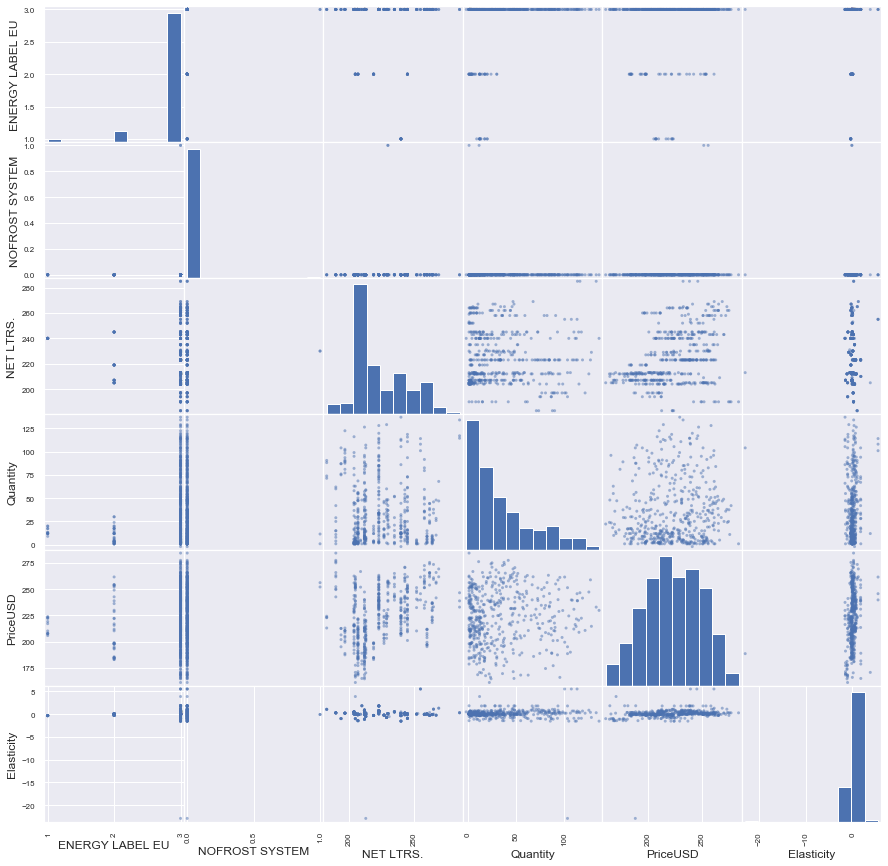

Кластер 15
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       486.000000      486.000000  486.000000  486.000000  486.000000   
mean          3.434156        0.816872  314.711934   75.726167  543.713575   
std           0.496156        0.387170   28.455705   73.489350   46.606023   
min           3.000000        0.000000  237.000000    1.000000  459.980663   
25%           3.000000        1.000000  302.000000   12.600000  506.484613   
50%           3.000000        1.000000  310.000000   57.666667  537.388690   
75%           4.000000        1.000000  338.000000  116.000000  575.850506   
max           4.000000        1.000000  367.000000  307.000000  709.108571   

       Elasticity  
count  486.000000  
mean     0.032786  
std      0.988448  
min     -5.370740  
25%     -0.087743  
50%      0.038385  
75%      0.330710  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

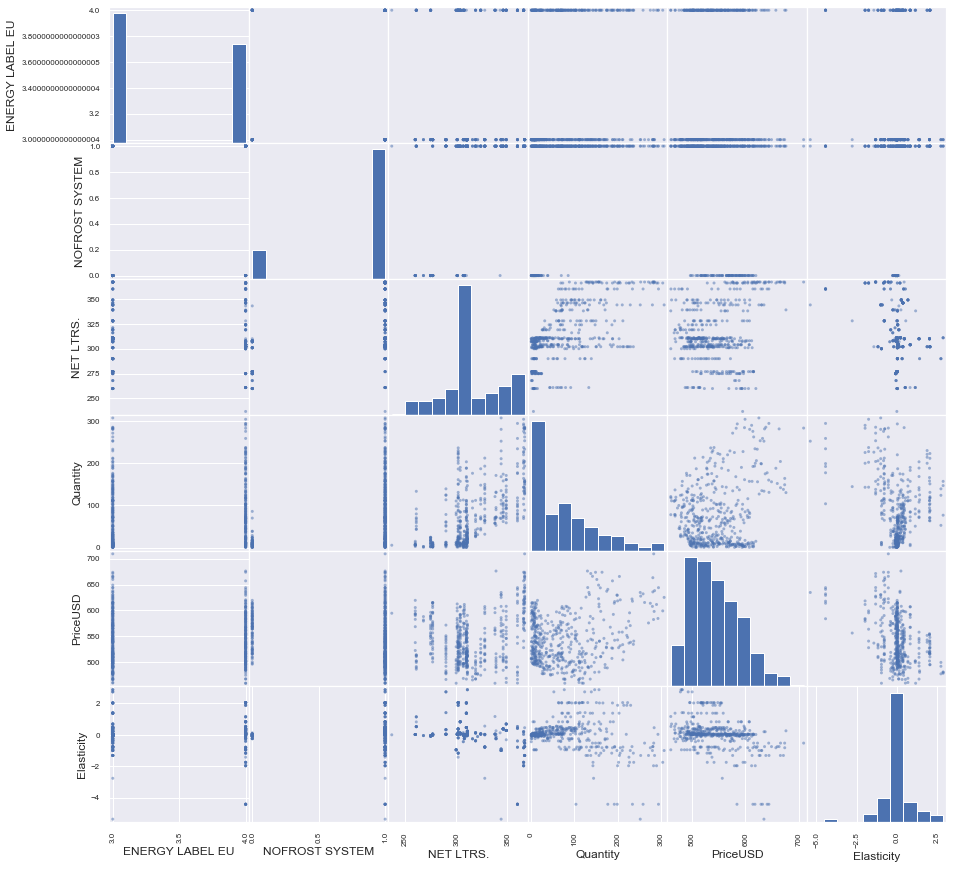

In [31]:
for i in np.unique(km.labels_+1):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_kmean_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_kmean_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_kmean_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [ ]:
Далі побудуємо кластеризації за допомогою ієрархічного методу

In [32]:
def fancy_dendrogram(*args, **kwargs):#функія побудови дендрограми
    sns.set()
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)
    ddata = dendrogram(*args, **kwargs)
    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

In [33]:
def lokot(data_linkage):# метод ліктя - найбільш оптимальна кількість сегментів
    last = data_linkage[-20:, 2] 
    last_rev = last[::-1]
    idxs = np.arange(1, len(last) + 1)
    plt.plot(idxs, last_rev)
    acceleration = np.diff(last, 2)  
    acceleration_rev = acceleration[::-1]
    plt.plot(idxs[:-2] + 1, acceleration_rev)
    plt.show()
    k = acceleration_rev.argmax() + 2 
    print("clusters:", k)

In [ ]:
#пошук кращої моделі
for method in ['ward','centroid', 'weighted', 'average', 'complete']:# за допомогою цього отримуємо оцінки для всіх комбінацій
    for metric in ['sqeuclidean','euclidean','cityblock','seuclidean','cosine','correlation','hamming','chebyshev','canberra','braycurtis']:
        try:
            print(method + ' ' + metric)
            print('Можлива к-ть класів')
            for i in range(2,20):
                dist = pdist(digits_proj_norm, metric)
                link = linkage(dist, method=method)
                cluster=fcluster(link, i, criterion='maxclust')
                c = silhouette_score(digits_proj_norm, cluster, metric=metric, sample_size=6000)
                ch = calinski_harabasz_score(digits_proj_norm, cluster)
                db = davies_bouldin_score(digits_proj_norm, cluster)
                if(c>0):
                    print('Clusters: ' + str(i) + '\nsilhouette_score: ' + str(c) + '\ncalinski harabasz score: ' + str(ch) + '\ndavies_bouldin_score: ' + str(db))
        except Exception:
            pass

In [34]:
data_dist = pdist(dataNorm, 'sqeuclidean') # побудова матриці відстаней

In [35]:
data_linkage = linkage(data_dist, method='ward') # об'єднання елементів у кластери

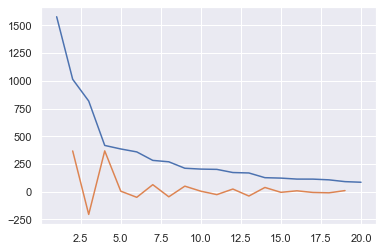

clusters: 4


In [36]:
lokot(data_linkage)

In [37]:
clustering_criterion_ierarhi(dataNorm, 'ward', 'sqeuclidean')

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.9319591307848271
calinski harabasz score: 752.2147838799174
davies_bouldin_score: 0.5862469816206451
Clusters: 3
silhouette_score: 0.8824966341829911
calinski harabasz score: 721.7853244700699
davies_bouldin_score: 0.7270525619013859
Clusters: 4
silhouette_score: 0.48585443926782
calinski harabasz score: 1964.7614848197127
davies_bouldin_score: 0.9709877781045599
Clusters: 5
silhouette_score: 0.460626009872095
calinski harabasz score: 2009.955084119885
davies_bouldin_score: 1.0911134958983226
Clusters: 6
silhouette_score: 0.4587532122869622
calinski harabasz score: 1693.0362292334198
davies_bouldin_score: 0.9414044861940729
Clusters: 7
silhouette_score: 0.48033484294590834
calinski harabasz score: 1684.4782334543752
davies_bouldin_score: 0.9815047278366069
Clusters: 8
silhouette_score: 0.4559935532434764
calinski harabasz score: 1932.3771914053057
davies_bouldin_score: 0.922821726904335
Clusters: 9
silhouette_score: 0.4547861801020767

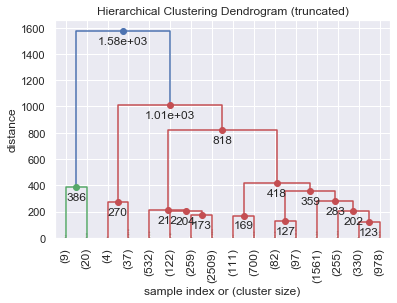

In [38]:
nCluster=16# побудова нашої дендрограми за вказаною к-тю кластерів дла ієрархічного методу
fancy_dendrogram(
    data_linkage,
    truncate_mode='lastp',
    p=nCluster, 
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=10,
)
plt.show()

In [39]:
clusters=fcluster(data_linkage, nCluster, criterion='maxclust')

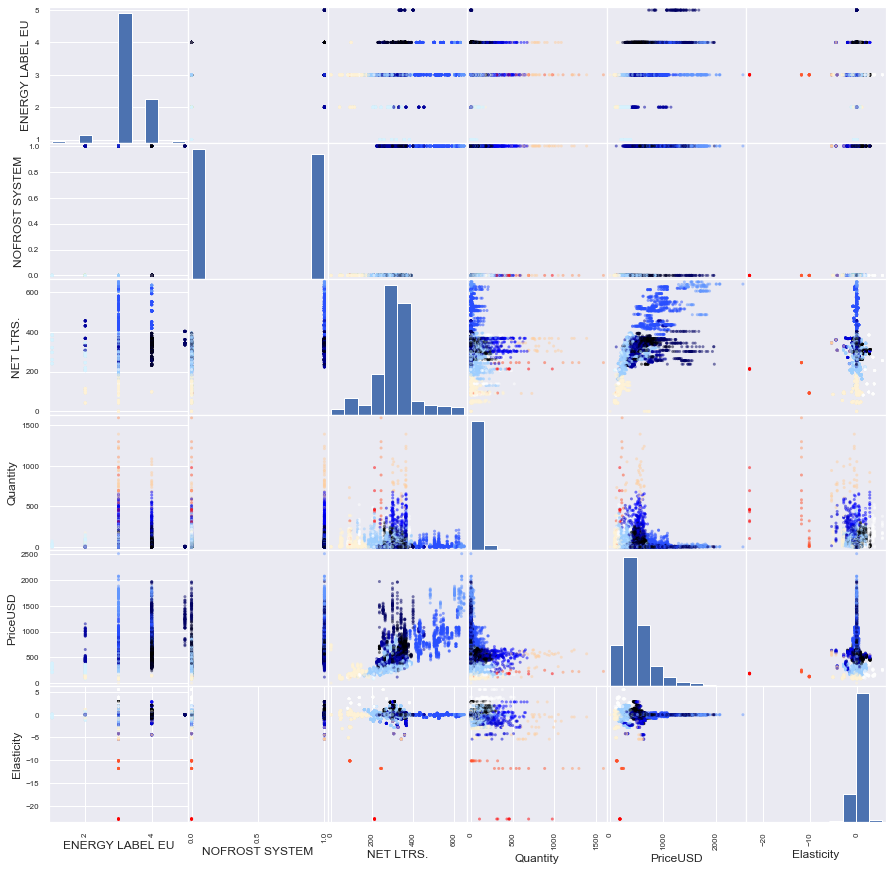

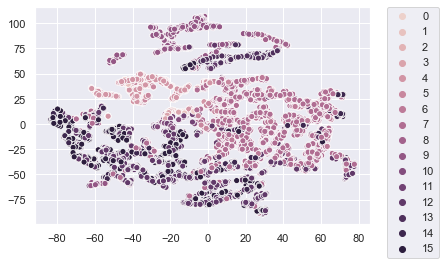

In [40]:
scatter_matrix(data_for_clust, c=clusters, cmap='flag', figsize=(15,15)) 
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=clusters-1, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [41]:
data['cluster_ier_we_16']=clusters

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.    Quantity    PriceUSD  \
count              9.0             9.0        9.0    9.000000    9.000000   
mean               3.0             0.0      213.0  469.000000  186.047872   
std                0.0             0.0        0.0  247.244818    5.413783   
min                3.0             0.0      213.0  104.000000  178.051725   
25%                3.0             0.0      213.0  324.000000  183.187402   
50%                3.0             0.0      213.0  457.000000  187.211267   
75%                3.0             0.0      213.0  464.000000  188.549703   
max                3.0             0.0      213.0  977.000000  193.524693   

       Elasticity  
count    9.000000  
mean   -22.929611  
std      0.000000  
min    -22.929611  
25%    -22.929611  
50%    -22.929611  
75%    -22.929611  
max    -22.929611  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN           

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 3.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 3.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 213.0 results in singular transformations; automatically expanding.
  ax.set_xli

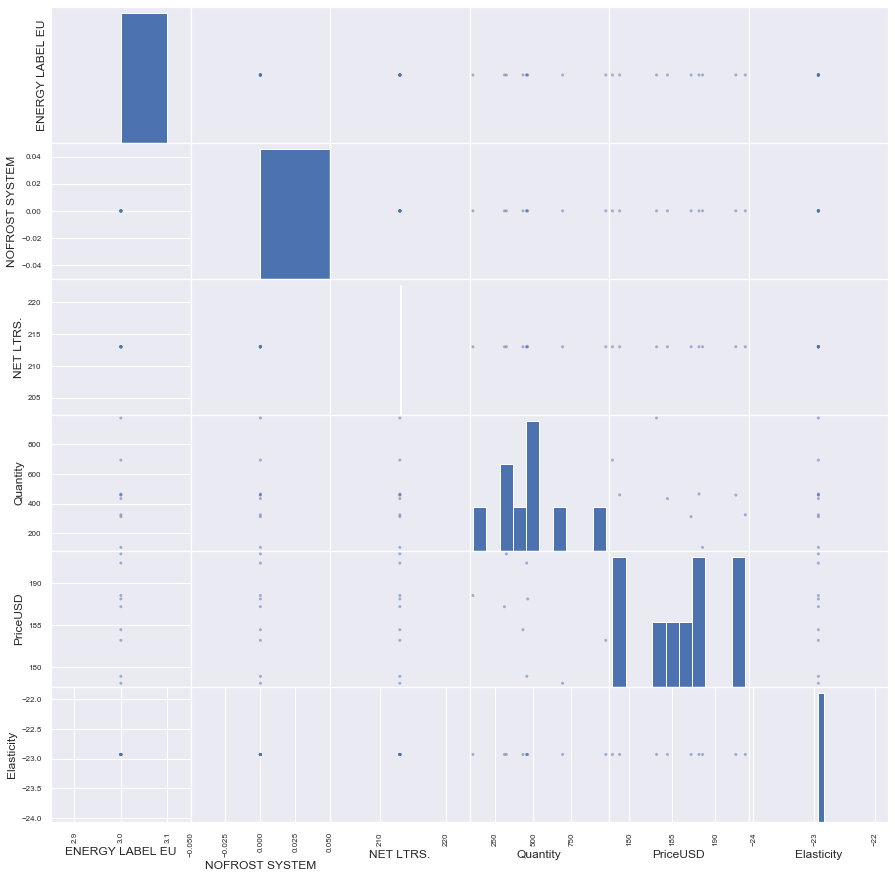

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count             20.0            20.0   20.000000   20.000000   20.000000   
mean               3.0             0.0  153.200000  255.006350  170.688923   
std                0.0             0.0   76.901578  265.182363   55.122318   
min                3.0             0.0   92.000000    4.000000  117.240770   
25%                3.0             0.0   92.000000   29.687893  125.660372   
50%                3.0             0.0   92.000000  155.135344  133.604524   
75%                3.0             0.0  245.000000  406.000000  228.088971   
max                3.0             0.0  245.000000  885.500000  255.354381   

       Elasticity  
count   20.000000  
mean   -10.814720  
std      0.838770  
min    -11.815988  
25%    -11.815988  
50%    -10.147207  
75%    -10.147207  
max    -10.147207  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

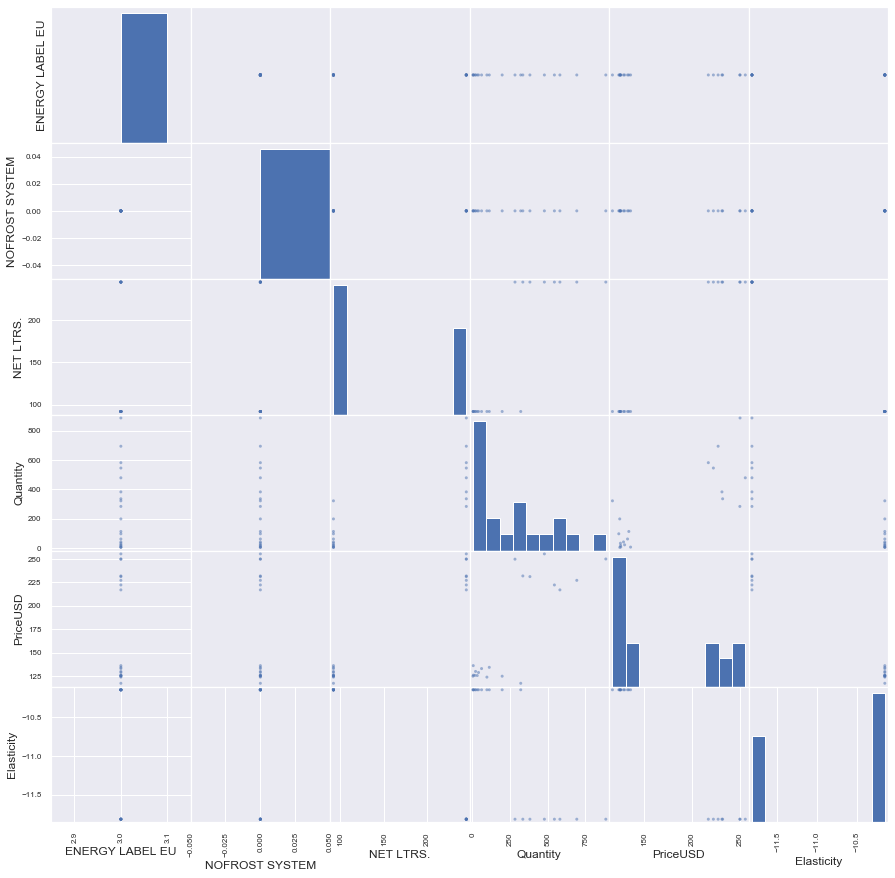

Кластер 3
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.     Quantity    PriceUSD  \
count              4.0             4.0        4.0     4.000000    4.000000   
mean               3.0             0.0      245.0  1302.500000  222.368449   
std                0.0             0.0        0.0   206.922691    8.084868   
min                3.0             0.0      245.0  1106.000000  210.926413   
25%                3.0             0.0      245.0  1190.000000  219.560679   
50%                3.0             0.0      245.0  1257.000000  224.993510   
75%                3.0             0.0      245.0  1369.500000  227.801280   
max                3.0             0.0      245.0  1590.000000  228.560364   

       Elasticity  
count    4.000000  
mean   -11.815988  
std      0.000000  
min    -11.815988  
25%    -11.815988  
50%    -11.815988  
75%    -11.815988  
max    -11.815988  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 245.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == -11.815988164088374 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 245.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 245.0 results in singular transformations; automatically exp

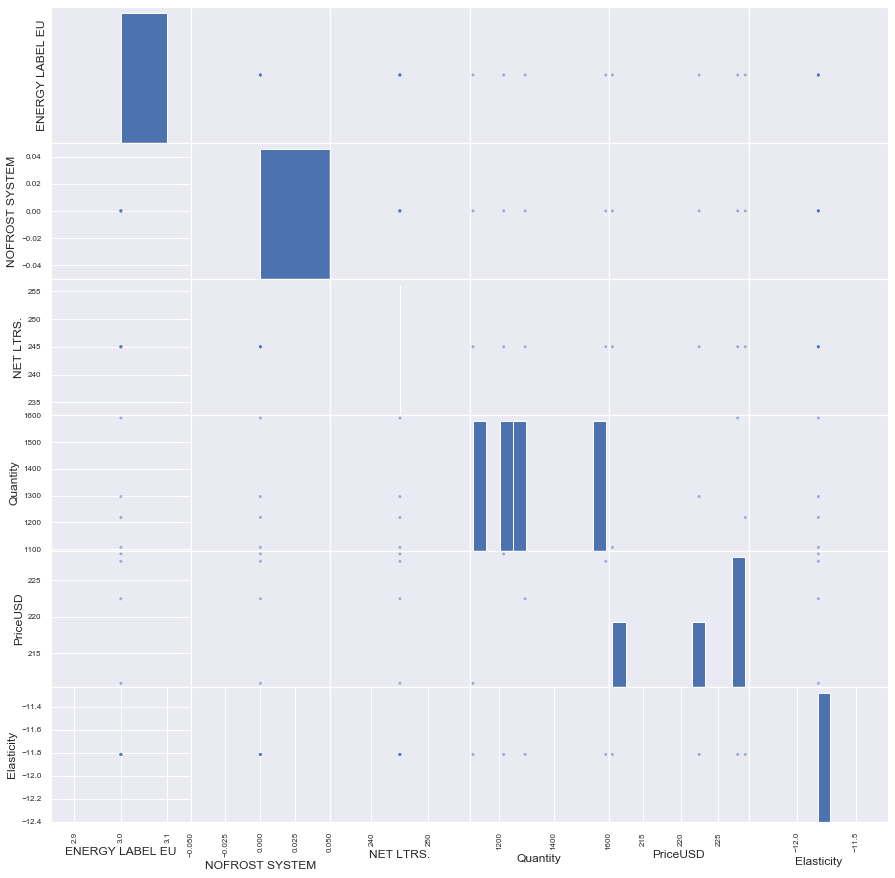

Кластер 4
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.     Quantity    PriceUSD  \
count        37.000000       37.000000   37.000000    37.000000   37.000000   
mean          3.351351        0.810811  325.972973   831.908380  510.214511   
std           0.483978        0.397061   62.886355   198.953905  137.717940   
min           3.000000        0.000000   90.000000   486.130000  115.165367   
25%           3.000000        1.000000  307.000000   697.000000  511.505616   
50%           3.000000        1.000000  344.000000   788.650000  558.595007   
75%           4.000000        1.000000  366.000000   941.100000  584.588007   
max           4.000000        1.000000  367.000000  1388.679739  645.429020   

       Elasticity  
count   37.000000  
mean    -2.149139  
std      2.305440  
min     -5.370740  
25%     -4.170003  
50%     -1.423114  
75%     -0.504816  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

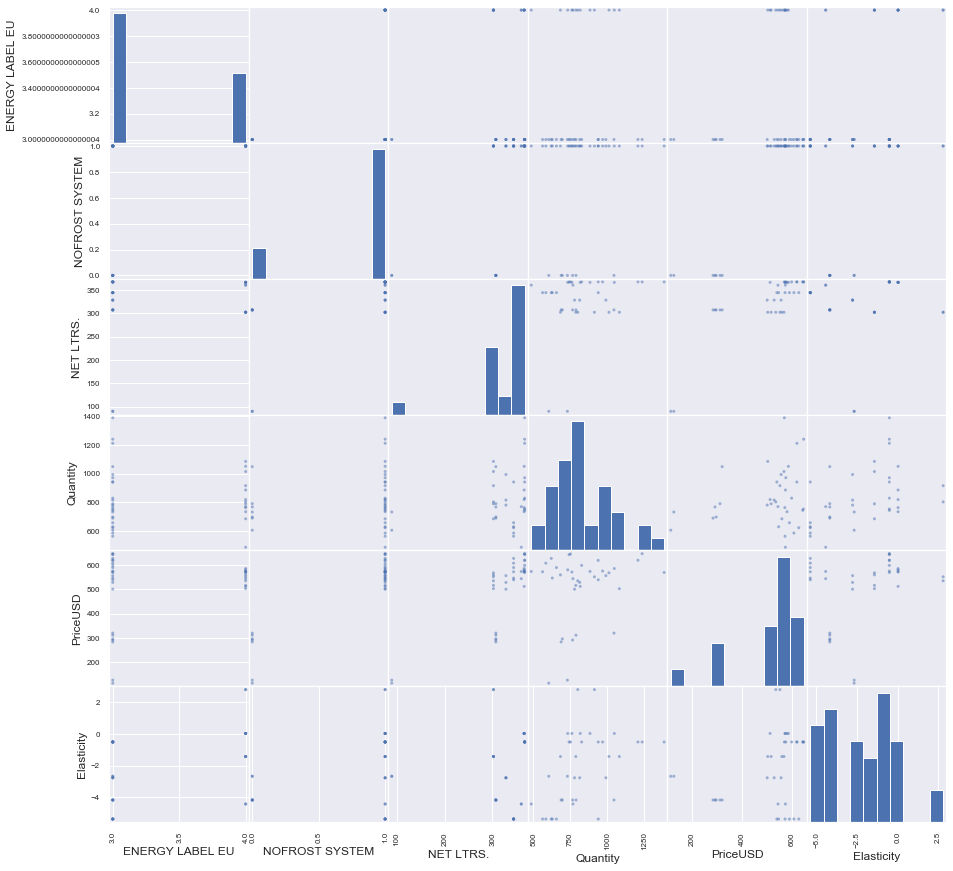

Кластер 5
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       532.000000           532.0  532.000000  532.000000  532.000000   
mean          2.939850             0.0  101.041353   31.659123  179.239859   
std           0.313161             0.0   39.969600   53.766000   97.703014   
min           2.000000             0.0    0.000000   -1.000000    0.000000   
25%           3.000000             0.0   85.000000    4.000000  121.016102   
50%           3.000000             0.0   98.000000   10.000000  157.388617   
75%           3.000000             0.0  130.000000   30.000000  209.855443   
max           4.000000             0.0  184.000000  388.500000  746.947794   

       Elasticity  
count  532.000000  
mean    -0.338737  
std      1.163582  
min     -5.071539  
25%     -0.279169  
50%     -0.024688  
75%      0.177658  
max      1.408134  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

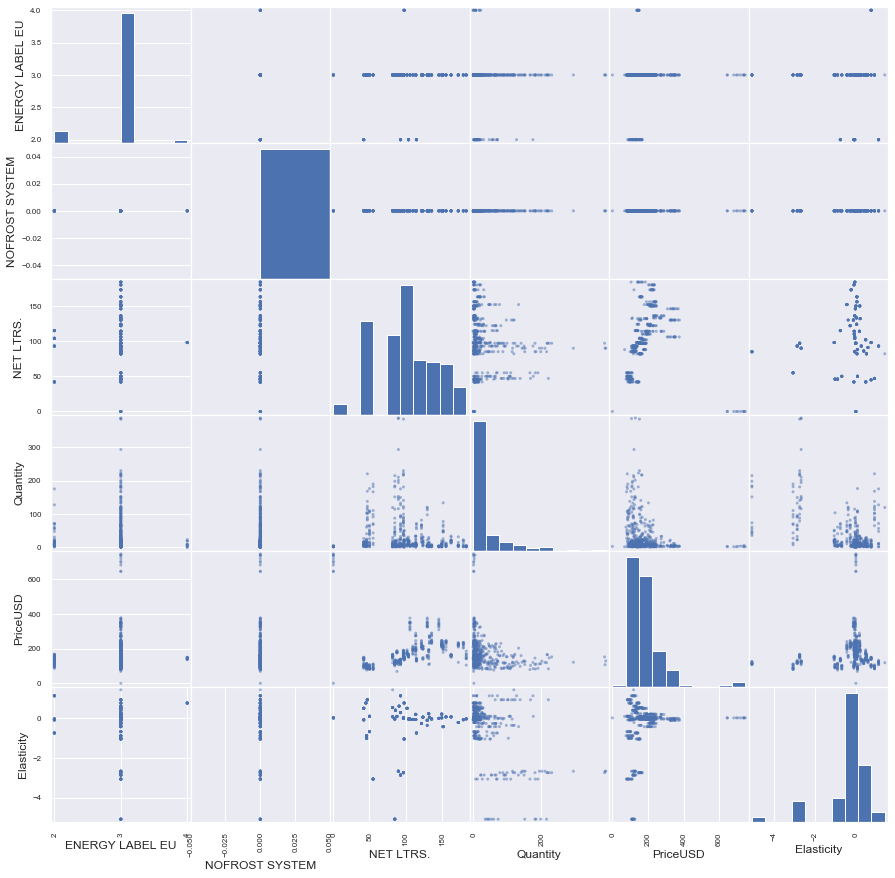

Кластер 6
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count            122.0           122.0  122.000000  122.000000  122.000000   
mean               3.0             0.0  189.073770  146.903094  198.224929   
std                0.0             0.0   91.735982  122.992199   76.007817   
min                3.0             0.0   82.000000   -3.000000   94.444739   
25%                3.0             0.0   97.000000   40.000386  148.359139   
50%                3.0             0.0  205.000000  131.000000  164.066848   
75%                3.0             0.0  255.000000  211.958649  255.277652   
max                3.0             0.0  384.000000  520.760000  388.172846   

       Elasticity  
count  122.000000  
mean     3.060465  
std      1.143802  
min      1.408134  
25%      2.200602  
50%      2.635396  
75%      3.772702  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU              NaN  

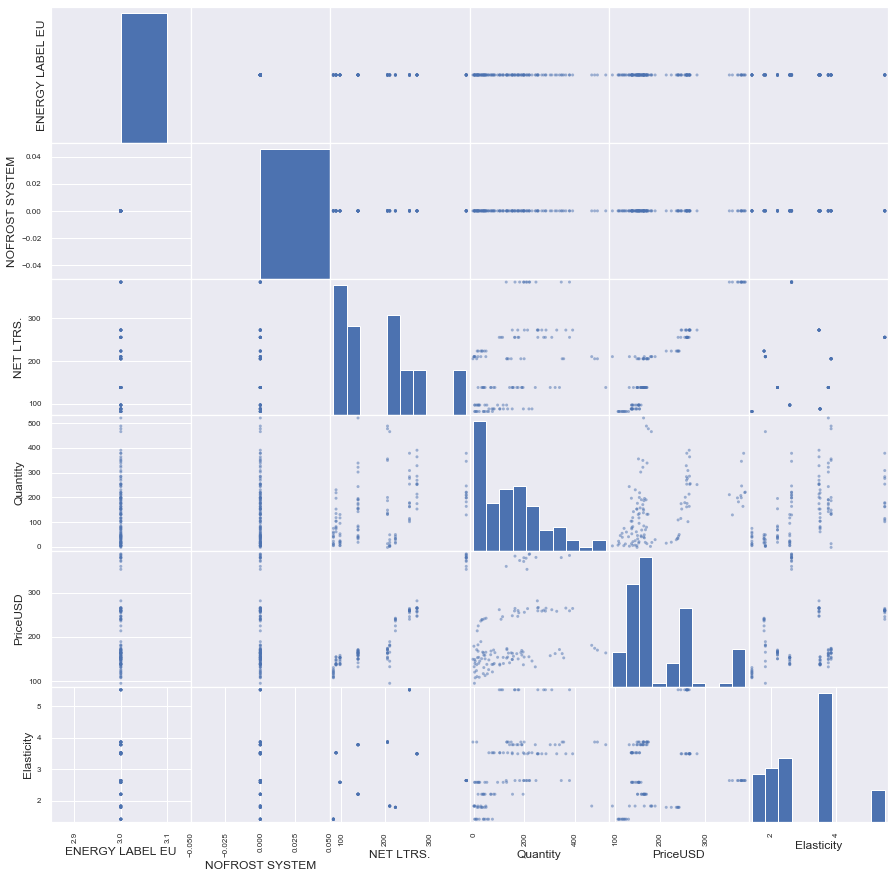

Кластер 7
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       259.000000           259.0  259.000000  259.000000  259.000000   
mean          1.733591             0.0  294.061776   23.352487  279.890818   
std           0.442937             0.0   46.559914   27.274933   57.212799   
min           1.000000             0.0  205.000000    1.000000   82.240372   
25%           1.000000             0.0  278.000000    4.437500  236.610096   
50%           2.000000             0.0  296.000000   13.333333  287.388271   
75%           2.000000             0.0  333.000000   30.250000  316.986389   
max           2.000000             0.0  384.000000  153.000000  388.210305   

       Elasticity  
count  259.000000  
mean    -0.108787  
std      0.376901  
min     -1.138110  
25%     -0.263523  
50%     -0.035574  
75%      0.106068  
max      0.842468  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

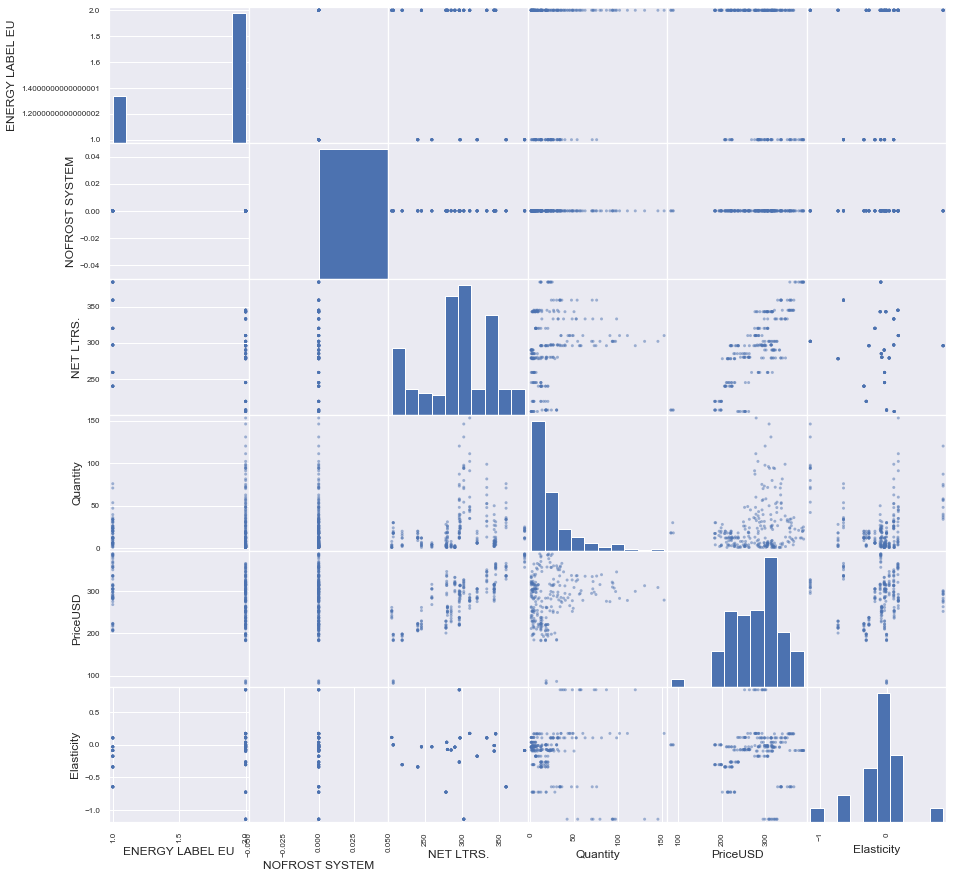

Кластер 8
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count           2509.0          2509.0  2509.000000  2509.000000  2509.000000   
mean               3.0             0.0   290.882423    35.920128   328.254544   
std                0.0             0.0    49.863363    52.351743   108.345766   
min                3.0             0.0    98.000000    -2.000000   130.095725   
25%                3.0             0.0   260.000000     5.000000   264.913331   
50%                3.0             0.0   300.000000    14.000000   316.087486   
75%                3.0             0.0   326.000000    46.000000   362.900572   
max                3.0             0.0   393.000000   472.000000   930.692078   

        Elasticity  
count  2509.000000  
mean      0.024865  
std       0.592257  
min      -2.814364  
25%      -0.137743  
50%       0.012578  
75%       0.156145  
max       2.055882  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

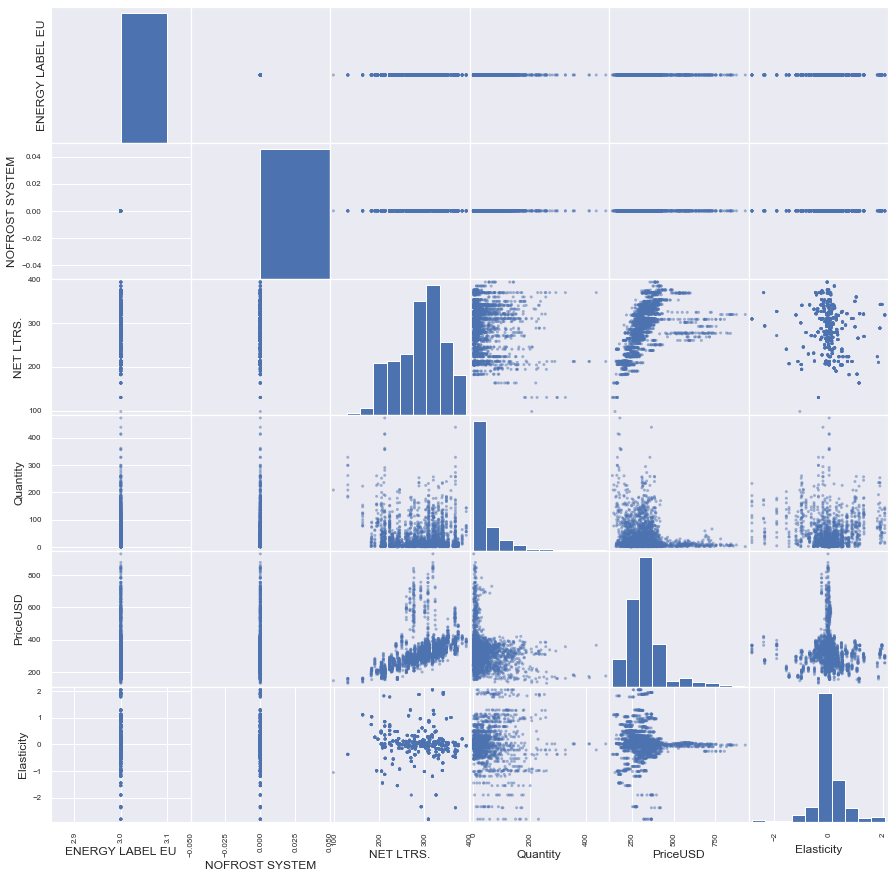

Кластер 9
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       111.000000           111.0  111.000000  111.000000   111.000000   
mean          3.207207             1.0  606.837838   10.675278  1669.611628   
std           0.407143             0.0   49.821963   10.239221   184.910915   
min           3.000000             1.0  486.000000    1.000000  1294.542322   
25%           3.000000             1.0  605.000000    3.000000  1539.491404   
50%           3.000000             1.0  626.000000    7.000000  1697.571150   
75%           3.000000             1.0  638.000000   14.000000  1773.338663   
max           4.000000             1.0  651.000000   45.000000  2511.804930   

       Elasticity  
count  111.000000  
mean    -0.015094  
std      0.029902  
min     -0.062638  
25%     -0.037067  
50%     -0.007408  
75%      0.000227  
max      0.022406  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 1.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


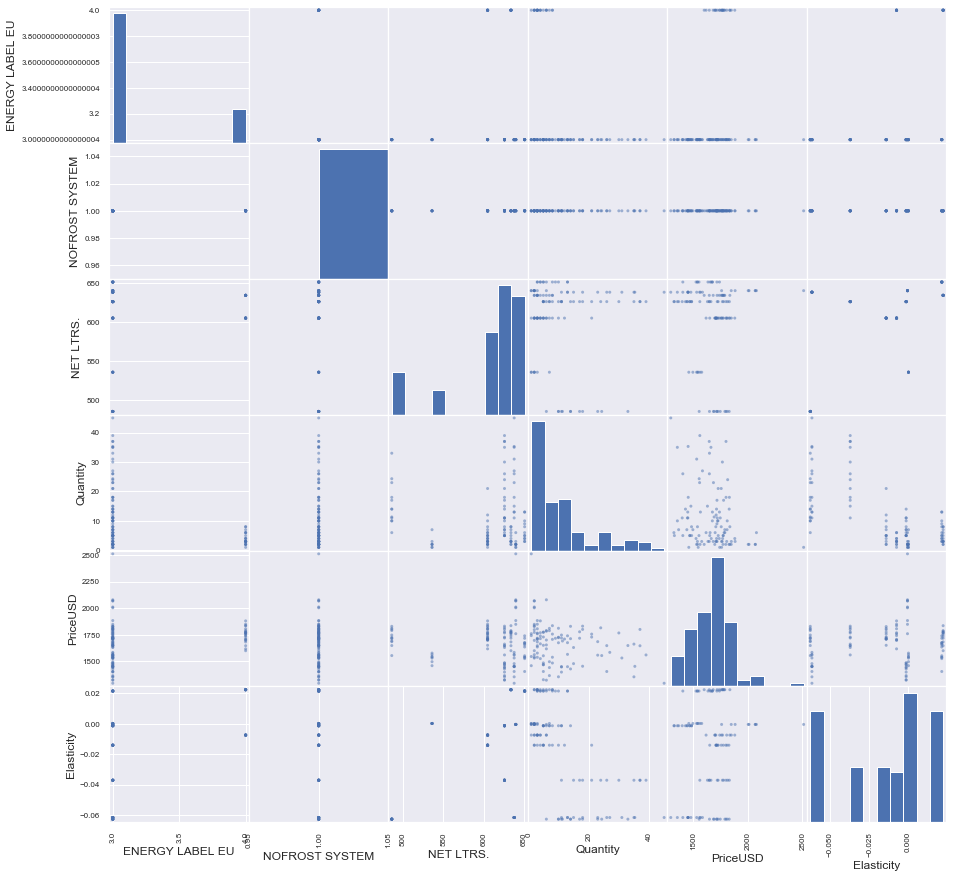

Кластер 10
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       700.000000           700.0  700.000000  700.000000   700.000000   
mean          3.388571             1.0  497.452857   23.865634   869.442205   
std           0.487774             0.0   64.275955   34.984202   199.354508   
min           3.000000             1.0  367.000000   -1.000000   423.116329   
25%           3.000000             1.0  435.000000    3.000000   738.600270   
50%           3.000000             1.0  506.500000    7.000000   853.688101   
75%           4.000000             1.0  540.000000   29.075000  1018.099820   
max           4.000000             1.0  626.000000  209.000000  1431.694360   

       Elasticity  
count  700.000000  
mean    -0.066366  
std      0.221059  
min     -0.809636  
25%     -0.048008  
50%     -0.010006  
75%      0.008385  
max      0.462785  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

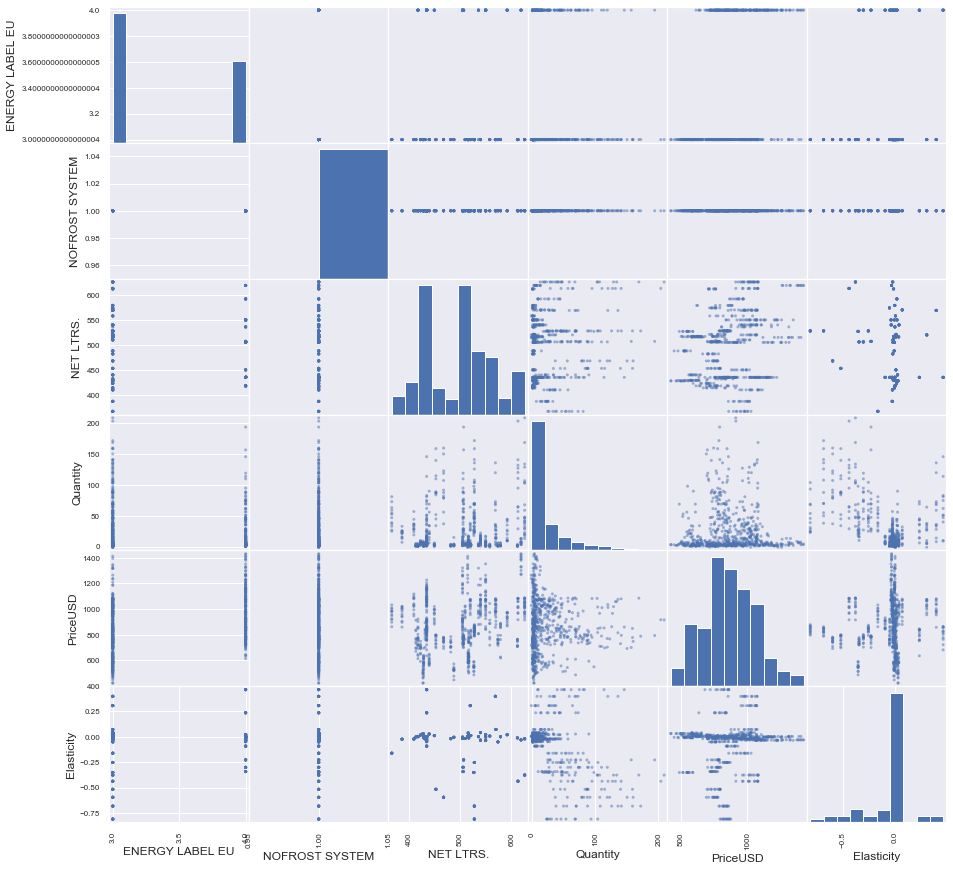

Кластер 11
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count        82.000000            82.0   82.000000   82.000000   82.000000   
mean          3.195122             1.0  336.000000  414.536824  544.307034   
std           0.398733             0.0   28.750094  114.969973   75.536646   
min           3.000000             1.0  290.000000  253.000000  328.615769   
25%           3.000000             1.0  302.000000  313.000000  493.570272   
50%           3.000000             1.0  349.000000  395.725000  542.185647   
75%           3.000000             1.0  367.000000  496.724528  606.720235   
max           4.000000             1.0  367.000000  674.547395  709.108571   

       Elasticity  
count   82.000000  
mean     0.316119  
std      1.432298  
min     -2.767178  
25%     -0.504816  
50%      0.455472  
75%      1.380684  
max      2.804369  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

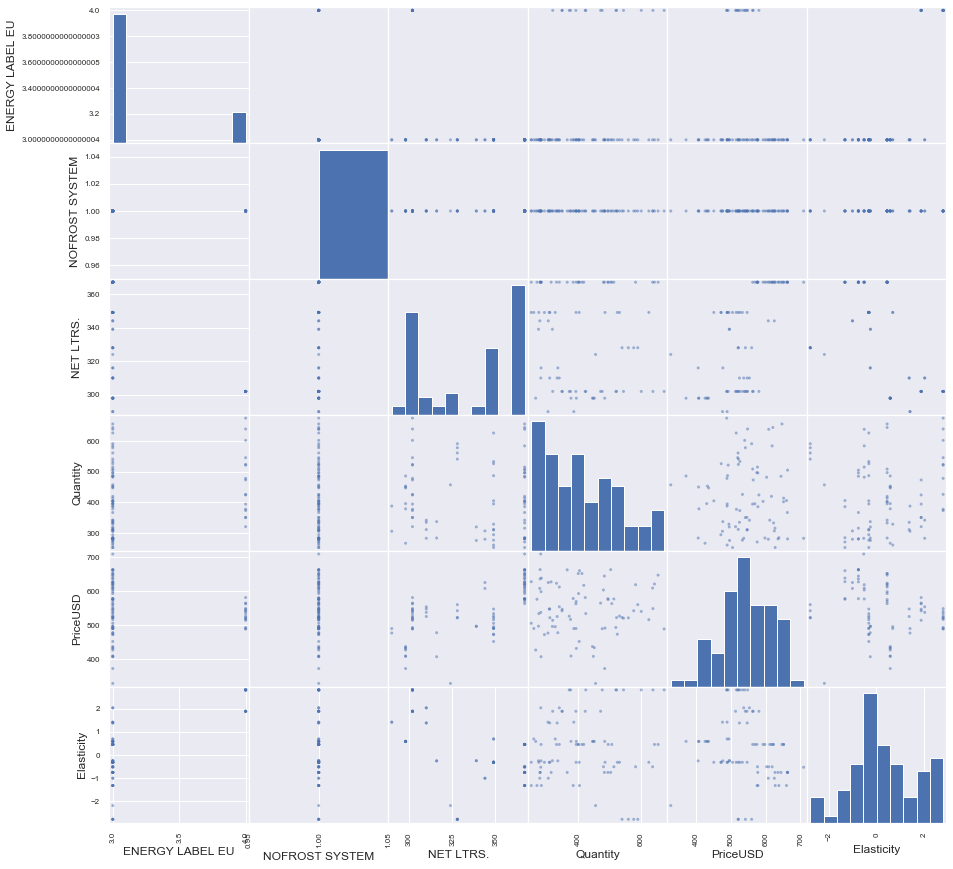

Кластер 12
       ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.    Quantity    PriceUSD  \
count        97.000000       97.000000   97.00000   97.000000   97.000000   
mean          3.628866        0.731959  330.71134  303.630145  494.468662   
std           0.485618        0.445240   37.28353  114.462218  126.985069   
min           3.000000        0.000000  240.00000   15.000000  219.267059   
25%           3.000000        0.000000  302.00000  228.000000  373.983799   
50%           4.000000        1.000000  344.00000  299.000000  536.940902   
75%           4.000000        1.000000  366.00000  372.900000  588.290041   
max           4.000000        1.000000  369.00000  592.000000  673.663951   

       Elasticity  
count   97.000000  
mean    -2.145253  
std      1.361591  
min     -5.370740  
25%     -2.384390  
50%     -1.906452  
75%     -1.165968  
max      0.055779  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000        0.

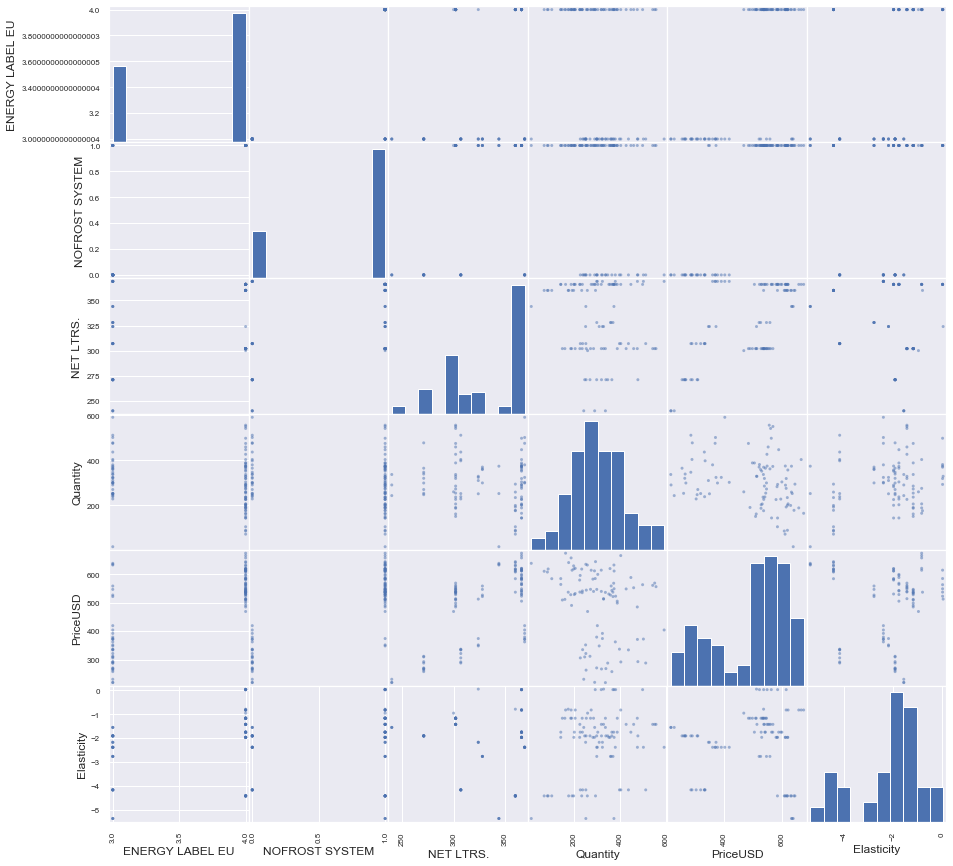

Кластер 13
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1561.000000          1561.0  1561.000000  1561.000000  1561.000000   
mean          2.956438             1.0   319.255605    20.943857   502.107017   
std           0.204183             0.0    35.915544    35.676440   128.492047   
min           2.000000             1.0   224.000000    -1.000000   116.905072   
25%           3.000000             1.0   303.000000     4.000000   423.765979   
50%           3.000000             1.0   321.000000     8.000000   469.529382   
75%           3.000000             1.0   339.000000    21.000000   553.255742   
max           3.000000             1.0   455.000000   262.000000  1150.639897   

        Elasticity  
count  1561.000000  
mean     -0.026320  
std       0.288016  
min      -2.767178  
25%      -0.060761  
50%      -0.001524  
75%       0.069517  
max       0.691027  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity 

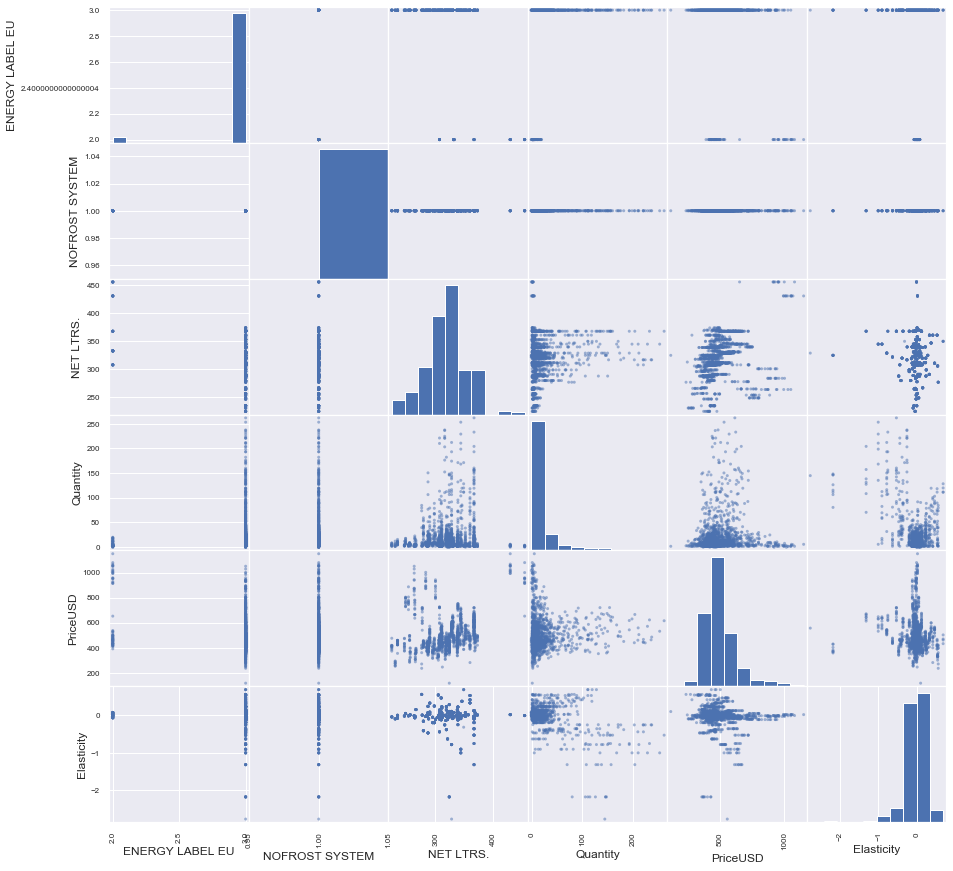

Кластер 14
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count       255.000000      255.000000  255.000000  255.000000   255.000000   
mean          4.262745        0.800000  325.274510    5.123974  1205.917891   
std           0.440991        0.400787   46.452871    5.315895   263.307138   
min           4.000000        0.000000  237.000000    1.000000   726.613059   
25%           4.000000        1.000000  301.000000    2.000000   982.586855   
50%           4.000000        1.000000  335.000000    3.600000  1157.910549   
75%           5.000000        1.000000  360.000000    6.000000  1414.506748   
max           5.000000        1.000000  402.000000   39.000000  1971.058245   

       Elasticity  
count  255.000000  
mean    -0.006689  
std      0.020967  
min     -0.060931  
25%     -0.014859  
50%     -0.001724  
75%      0.004647  
max      0.041490  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

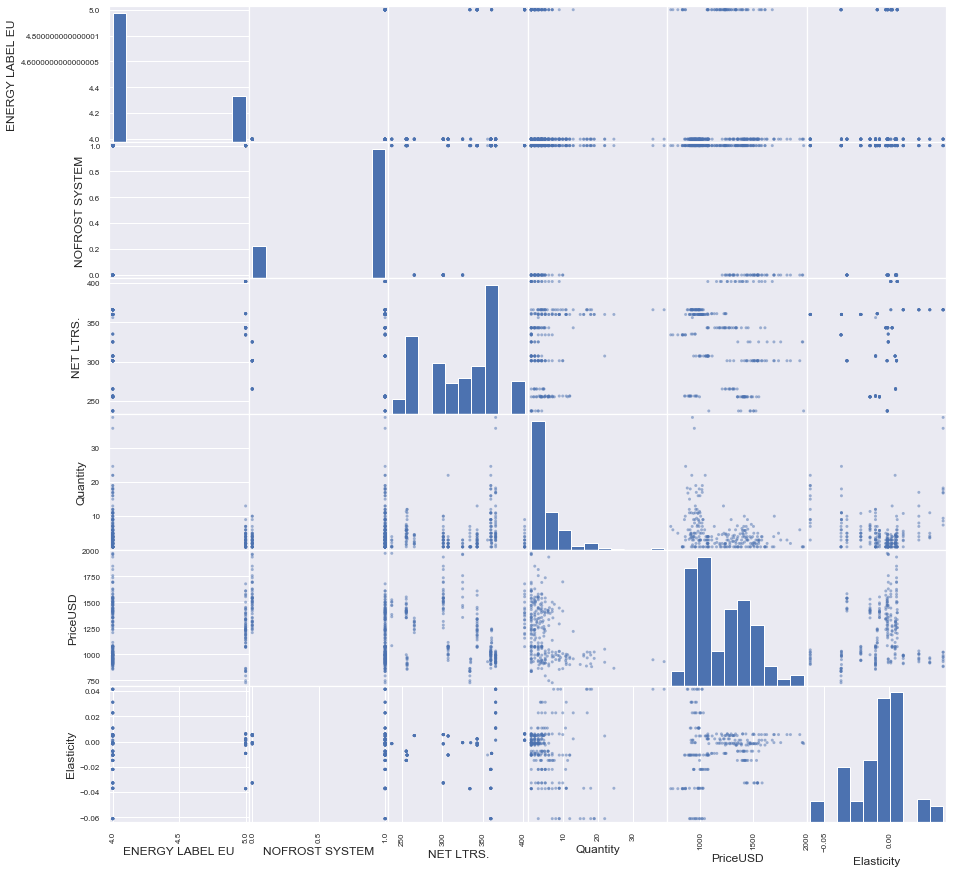

Кластер 15
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity     PriceUSD  \
count            330.0           330.0  330.000000  330.000000   330.000000   
mean               4.0             0.0  321.978788   12.611657   504.684110   
std                0.0             0.0   39.203655   16.015817   191.215550   
min                4.0             0.0  231.000000   -1.000000   239.013902   
25%                4.0             0.0  301.000000    3.000000   358.051345   
50%                4.0             0.0  337.000000    6.000000   450.210862   
75%                4.0             0.0  346.000000   15.000000   586.331044   
max                4.0             0.0  392.000000  110.500000  1221.635657   

       Elasticity  
count  330.000000  
mean     0.021934  
std      0.154728  
min     -0.238619  
25%     -0.025225  
50%     -0.002624  
75%      0.018103  
max      0.706790  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 4.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 4.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 4.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:95: RuntimeWarning: invalid value encountered in true_divide
  adj = (locs - lim1[0]) / (lim1[1] - lim1[0])


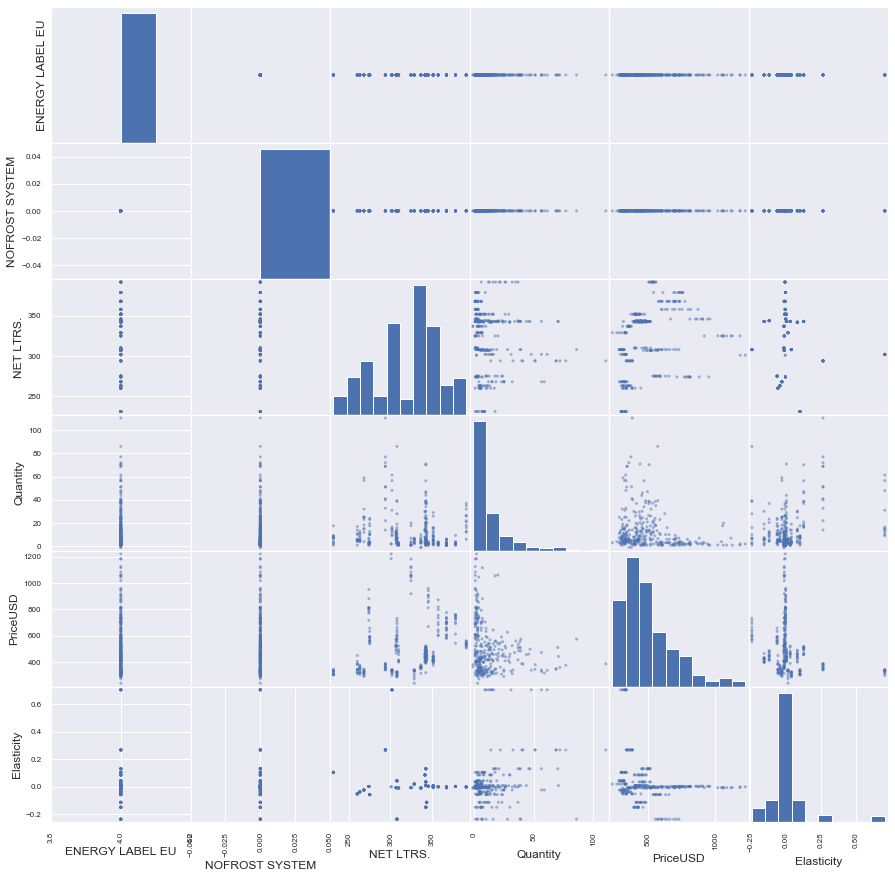

Кластер 16
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       978.000000           978.0  978.000000  978.000000  978.000000   
mean          3.931493             1.0  329.706544   39.201263  576.900714   
std           0.252743             0.0   31.786983   50.765169  109.666173   
min           3.000000             1.0  237.000000   -1.000000  326.271099   
25%           4.000000             1.0  304.000000    6.000000  488.492085   
50%           4.000000             1.0  338.000000   19.000000  571.974342   
75%           4.000000             1.0  360.000000   52.300000  650.234439   
max           4.000000             1.0  367.000000  301.000000  893.999618   

       Elasticity  
count  978.000000  
mean     0.198263  
std      0.660839  
min     -1.967937  
25%     -0.048011  
50%      0.024942  
75%      0.198748  
max      2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000 

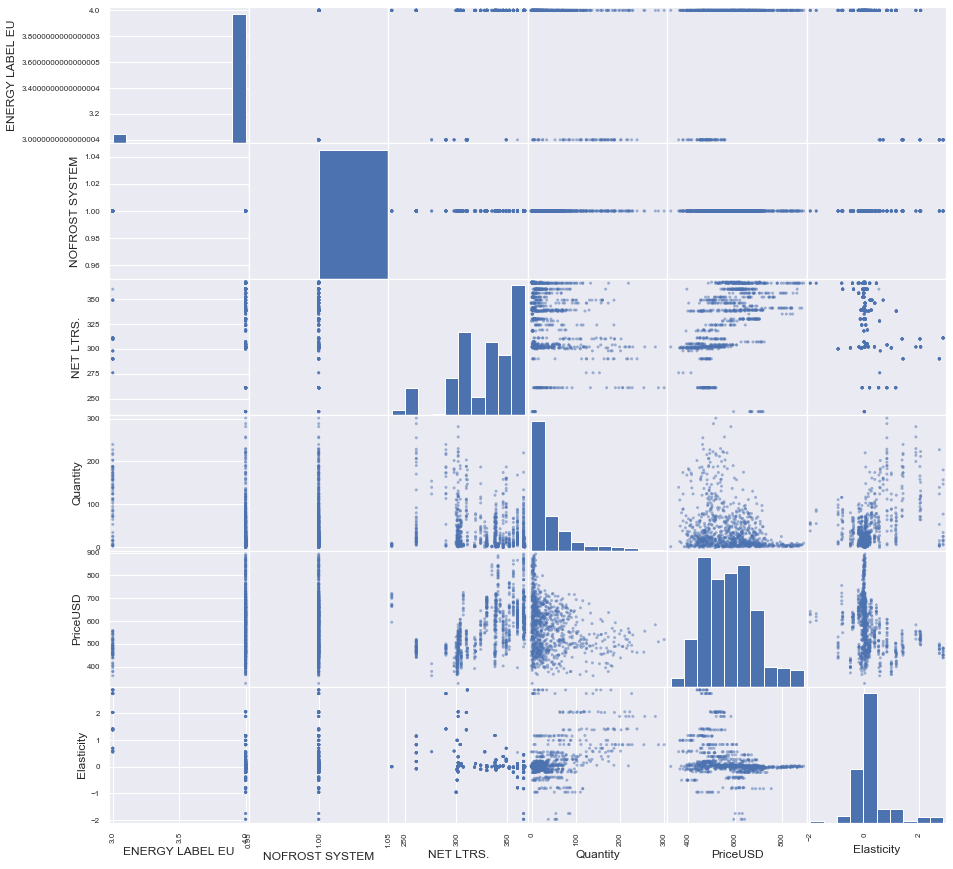

In [42]:
for i in np.unique(clusters):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_ier_we_16']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_ier_we_16']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_ier_we_16']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [43]:
data_dist = pdist(dataNorm, 'braycurtis') # побудова матриці відстаней

In [44]:
data_linkage = linkage(data_dist, method='ward') # об'єднання елементів у кластери

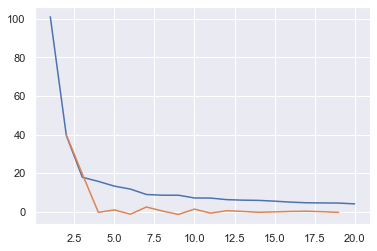

clusters: 2


In [45]:
lokot(data_linkage)

In [46]:
clustering_criterion_ierarhi(dataNorm, 'ward', 'braycurtis')

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.6231486410539219
calinski harabasz score: 3011.670994175157
davies_bouldin_score: 1.229623962781454
Clusters: 3
silhouette_score: 0.5643972410091553
calinski harabasz score: 2197.846082159399
davies_bouldin_score: 1.4161048138674872
Clusters: 4
silhouette_score: 0.46713630715849724
calinski harabasz score: 1651.3734972075379
davies_bouldin_score: 1.2740342179754767
Clusters: 5
silhouette_score: 0.4753054010204575
calinski harabasz score: 1571.825610654052
davies_bouldin_score: 1.3034793732678414
Clusters: 6
silhouette_score: 0.39443637412082794
calinski harabasz score: 1503.2802808017748
davies_bouldin_score: 1.491068712670777
Clusters: 7
silhouette_score: 0.39506397334639837
calinski harabasz score: 1594.0172415187958
davies_bouldin_score: 1.249107300102165
Clusters: 8
silhouette_score: 0.4110859333658033
calinski harabasz score: 1522.7065036925728
davies_bouldin_score: 1.2030808133893978
Clusters: 9
silhouette_score: 0.4081211899142

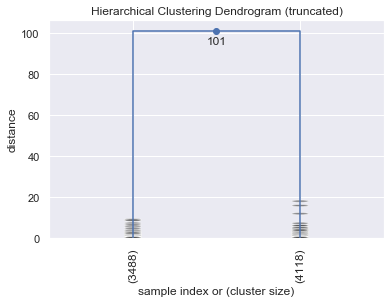

In [47]:
nCluster=2# побудова нашої дендрограми за вказаною к-тю кластерів дла ієрархічного методу
fancy_dendrogram(
    data_linkage,
    truncate_mode='lastp',
    p=nCluster, 
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=10,
)
plt.show()

In [48]:
clusters=fcluster(data_linkage, nCluster, criterion='maxclust')

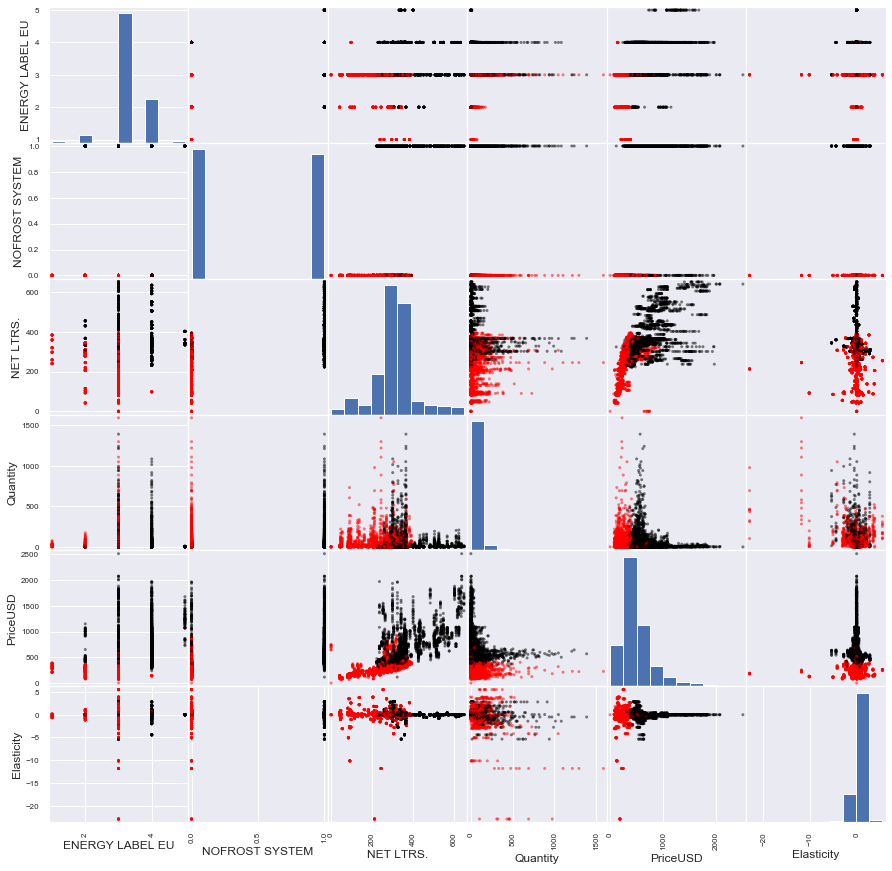

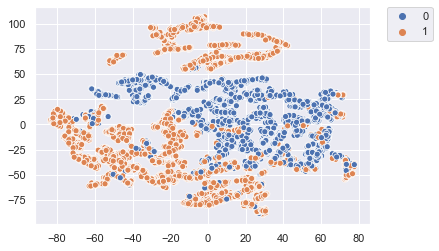

In [49]:
scatter_matrix(data_for_clust, c=clusters, cmap='flag', figsize=(15,15)) 
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=clusters-1, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [50]:
data['cluster_ier_wb_2']=clusters

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      3488.000000          3488.0  3488.000000  3488.000000  3488.000000   
mean          2.896789             0.0   257.561353    45.850789   295.716253   
std           0.372115             0.0    86.219318    91.641559   117.081106   
min           1.000000             0.0     0.000000    -3.000000     0.000000   
25%           3.000000             0.0   212.000000     5.000000   221.333983   
50%           3.000000             0.0   279.000000    14.000000   293.027541   
75%           3.000000             0.0   321.000000    48.470000   348.496915   
max           4.000000             0.0   393.000000  1590.000000   930.692078   

        Elasticity  
count  3488.000000  
mean     -0.096453  
std       1.769244  
min     -22.929611  
25%      -0.152218  
50%       0.007911  
75%       0.174288  
max       5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:80: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:81: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\users\zelen\desktop\python projects\lib\site-packages\pandas\plotting\_matplotlib\misc.py:71: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


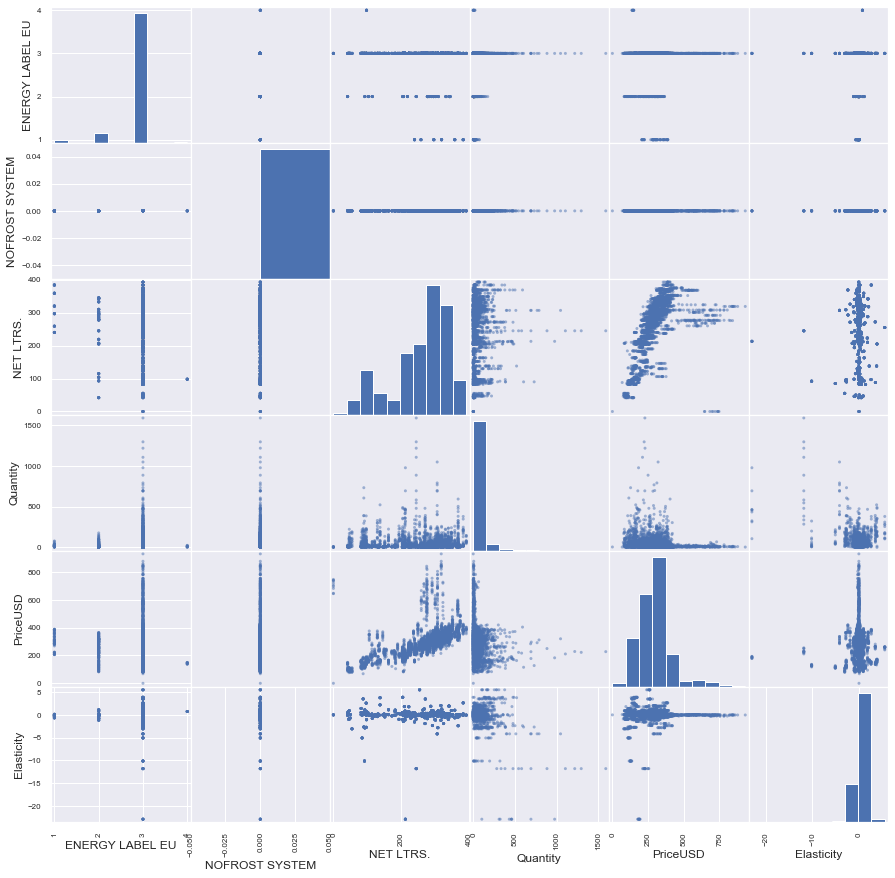

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      4118.000000     4118.000000  4118.000000  4118.000000  4118.000000   
mean          3.456532        0.907479   361.260563    42.291552   659.933120   
std           0.560136        0.289795    87.735838   105.157882   301.799504   
min           2.000000        0.000000   224.000000    -1.000000   116.905072   
25%           3.000000        1.000000   307.000000     4.000000   460.302881   
50%           3.000000        1.000000   339.000000     9.300000   563.783481   
75%           4.000000        1.000000   367.000000    30.000000   758.692695   
max           5.000000        1.000000   651.000000  1388.679739  2511.804930   

        Elasticity  
count  4118.000000  
mean     -0.013984  
std       0.603334  
min      -5.370740  
25%      -0.052266  
50%      -0.001531  
75%       0.046686  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

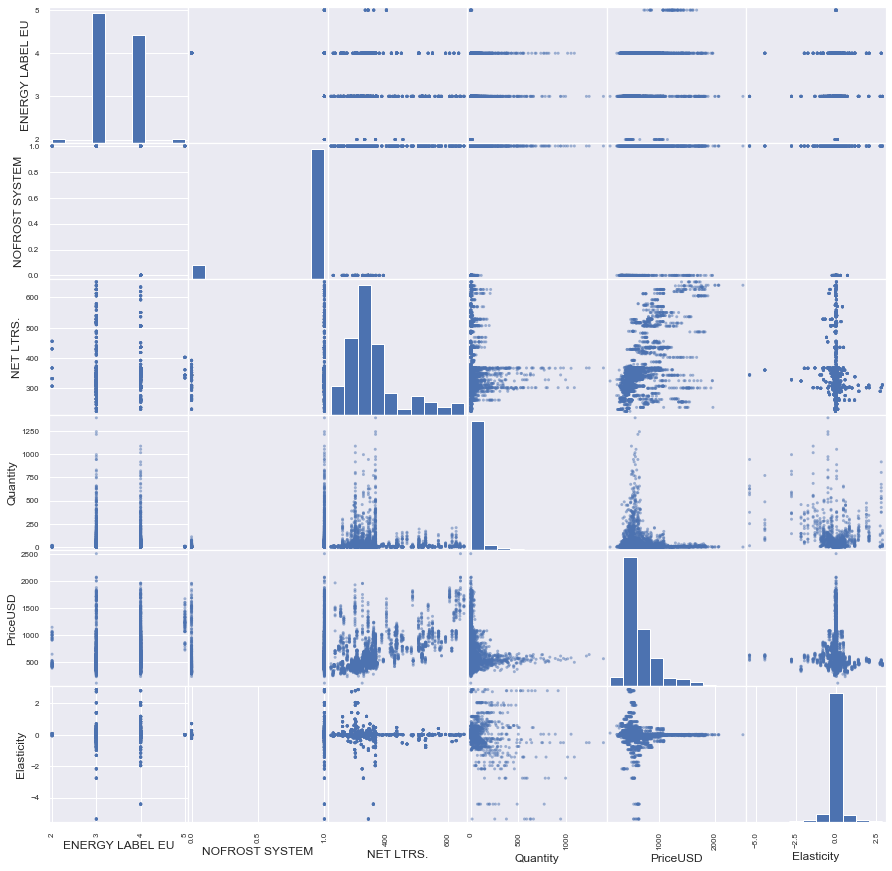

In [51]:
for i in np.unique(clusters):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_ier_wb_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_ier_wb_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_ier_wb_2']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()

In [ ]:
Розглянемо те саме але для T-SNE

In [52]:
data_dist = pdist(digits_proj_norm, 'cosine') # побудова матриці відстаней

In [53]:
data_linkage = linkage(data_dist, method='ward') # об'єднання елементів у кластери

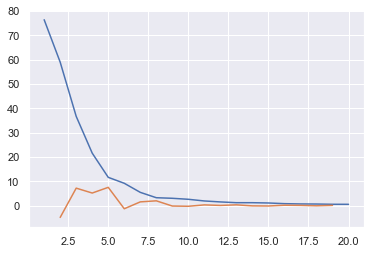

clusters: 5


In [54]:
lokot(data_linkage)

In [55]:
clustering_criterion_ierarhi(digits_proj_norm, 'ward', 'cosine')

Можлива к-ть класів
Clusters: 2
silhouette_score: 0.519493
calinski harabasz score: 4130.888663865481
davies_bouldin_score: 1.2189960969231426
Clusters: 3
silhouette_score: 0.58224785
calinski harabasz score: 4966.422015805908
davies_bouldin_score: 0.9257784107002097
Clusters: 4
silhouette_score: 0.6291542
calinski harabasz score: 6308.423013858931
davies_bouldin_score: 0.879909697137724
Clusters: 5
silhouette_score: 0.6698837
calinski harabasz score: 6629.021032671045
davies_bouldin_score: 0.9151355798472072
Clusters: 6
silhouette_score: 0.69452685
calinski harabasz score: 6211.118067458519
davies_bouldin_score: 1.0218808687174732
Clusters: 7
silhouette_score: 0.712506
calinski harabasz score: 6059.634317313586
davies_bouldin_score: 1.0602574179432451
Clusters: 8
silhouette_score: 0.7230755
calinski harabasz score: 5892.418678902577
davies_bouldin_score: 1.1344001974667606
Clusters: 9
silhouette_score: 0.702689
calinski harabasz score: 5380.554686819167
davies_bouldin_score: 1.2583764

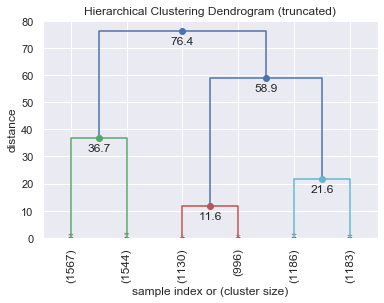

In [56]:
nCluster=6# побудова нашої дендрограми за вказаною к-тю кластерів дла ієрархічного методу
fancy_dendrogram(
    data_linkage,
    truncate_mode='lastp',
    p=nCluster, 
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=10,
)
plt.show()

In [57]:
clusters=fcluster(data_linkage, nCluster, criterion='maxclust')

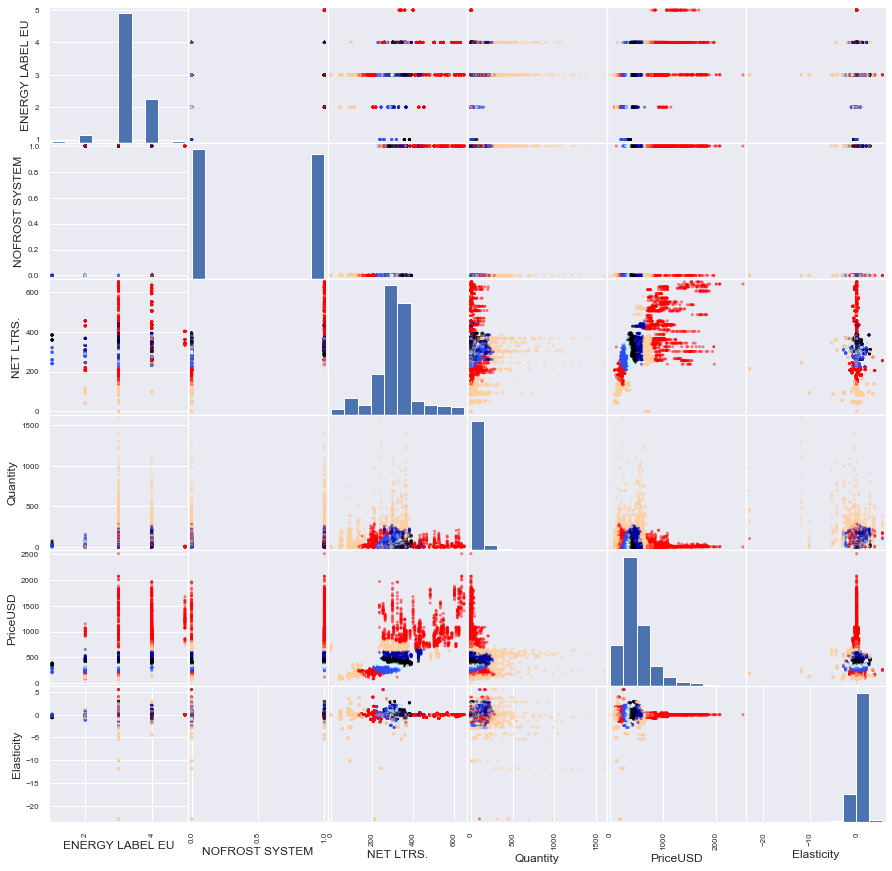

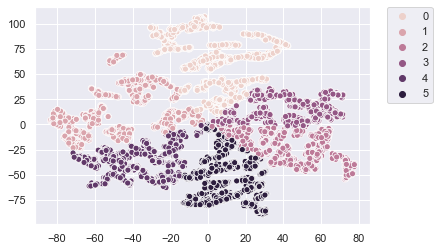

In [58]:
scatter_matrix(data_for_clust, c=clusters, cmap='flag', figsize=(15,15)) 
plt.show()
sns.scatterplot(digits_proj[:,0], digits_proj[:,1], hue=clusters-1, legend='full')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [59]:
data['cluster_ier_t_sne']=clusters

Кластер 1
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1567.000000     1567.000000  1567.000000  1567.000000  1567.000000   
mean          3.402042        0.634333   374.192725    27.519069   801.248546   
std           0.625508        0.481770   148.038287    44.462654   470.315219   
min           2.000000        0.000000   133.000000    -3.000000    82.240372   
25%           3.000000        0.000000   223.000000     3.000000   237.807987   
50%           3.000000        1.000000   366.000000     7.000000   858.742696   
75%           4.000000        1.000000   506.000000    29.275000  1062.798971   
max           5.000000        1.000000   651.000000   290.300000  2511.804930   

        Elasticity  
count  1567.000000  
mean      0.009059  
std       0.846323  
min     -22.929611  
25%      -0.050143  
50%      -0.004626  
75%       0.021262  
max       5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

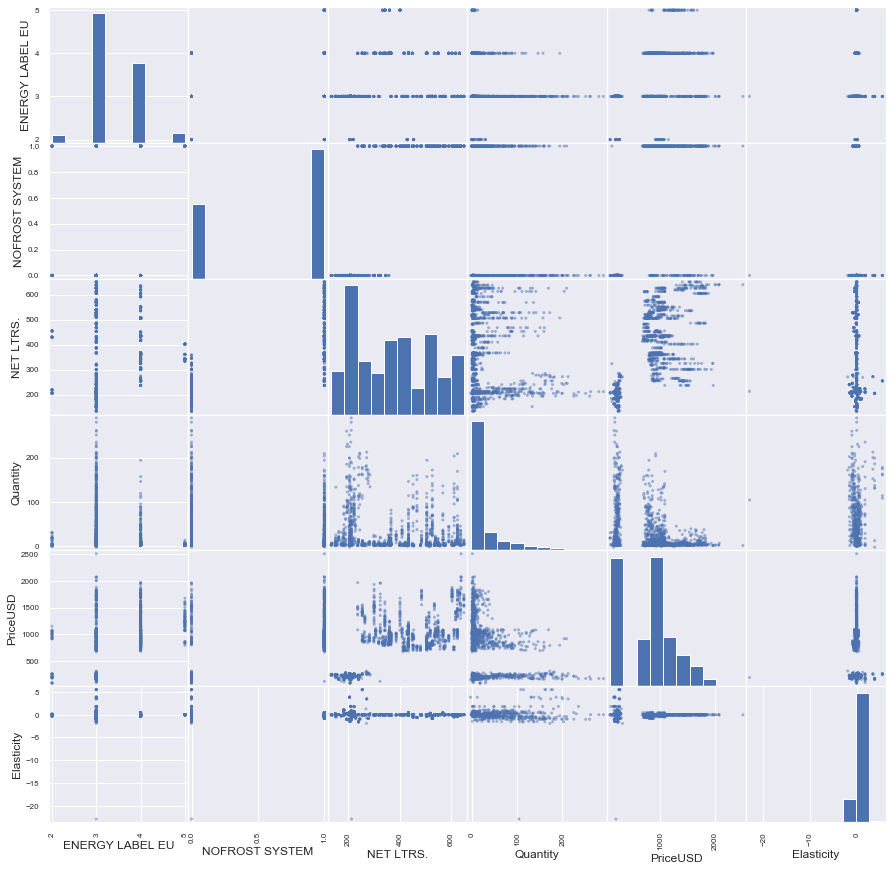

Кластер 2
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1544.000000     1544.000000  1544.000000  1544.000000  1544.000000   
mean          3.297280        0.511658   256.436528   109.823704   453.536451   
std           0.517076        0.500026   130.334282   191.059090   241.250586   
min           2.000000        0.000000     0.000000    -1.000000     0.000000   
25%           3.000000        0.000000   114.000000     6.000000   168.819468   
50%           3.000000        1.000000   307.000000    22.000000   568.599051   
75%           4.000000        1.000000   360.000000   114.325000   657.555952   
max           5.000000        1.000000   579.000000  1590.000000   827.670944   

        Elasticity  
count  1544.000000  
mean     -0.447599  
std       2.505210  
min     -22.929611  
25%      -0.353053  
50%      -0.024688  
75%       0.055247  
max       5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

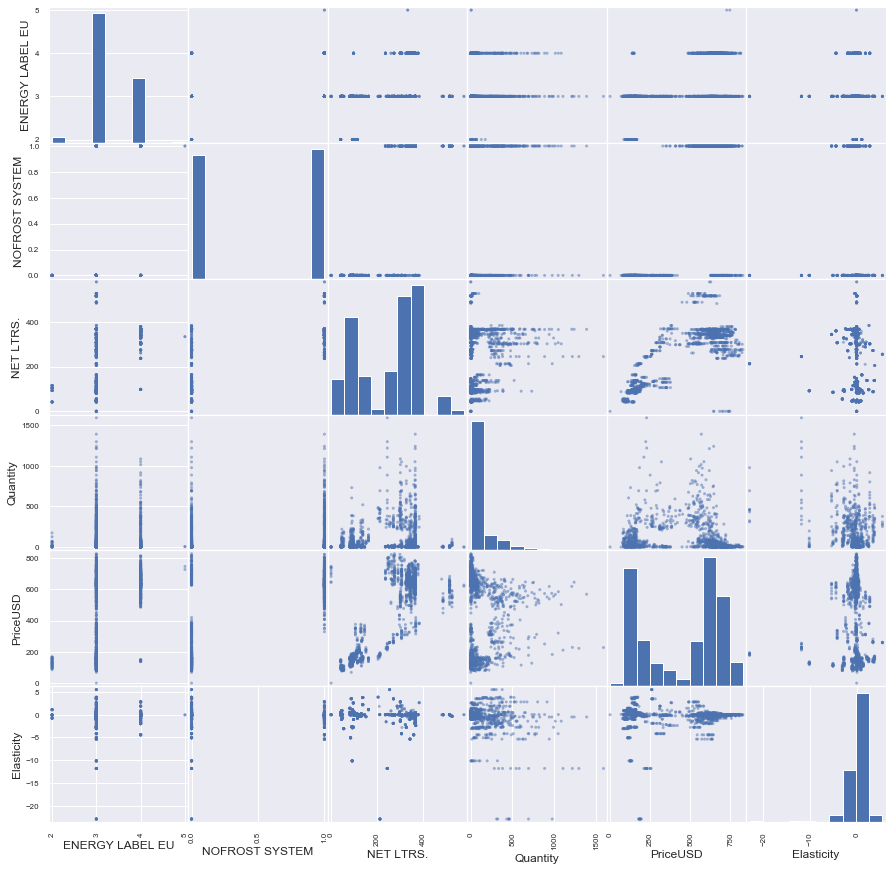

Кластер 3
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1130.000000     1130.000000  1130.000000  1130.000000  1130.000000   
mean          2.990265        0.170796   308.891150    20.141572   345.500974   
std           0.402487        0.376498    29.777528    25.786142    29.321337   
min           1.000000        0.000000   224.000000    -1.000000   266.583893   
25%           3.000000        0.000000   295.000000     4.000000   324.661052   
50%           3.000000        0.000000   310.000000     9.100000   344.256293   
75%           3.000000        0.000000   331.000000    24.875000   362.569330   
max           4.000000        1.000000   373.000000   150.200000   475.665161   

        Elasticity  
count  1130.000000  
mean      0.016620  
std       0.476151  
min      -2.814364  
25%      -0.070628  
50%       0.005319  
75%       0.106068  
max       1.952064  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

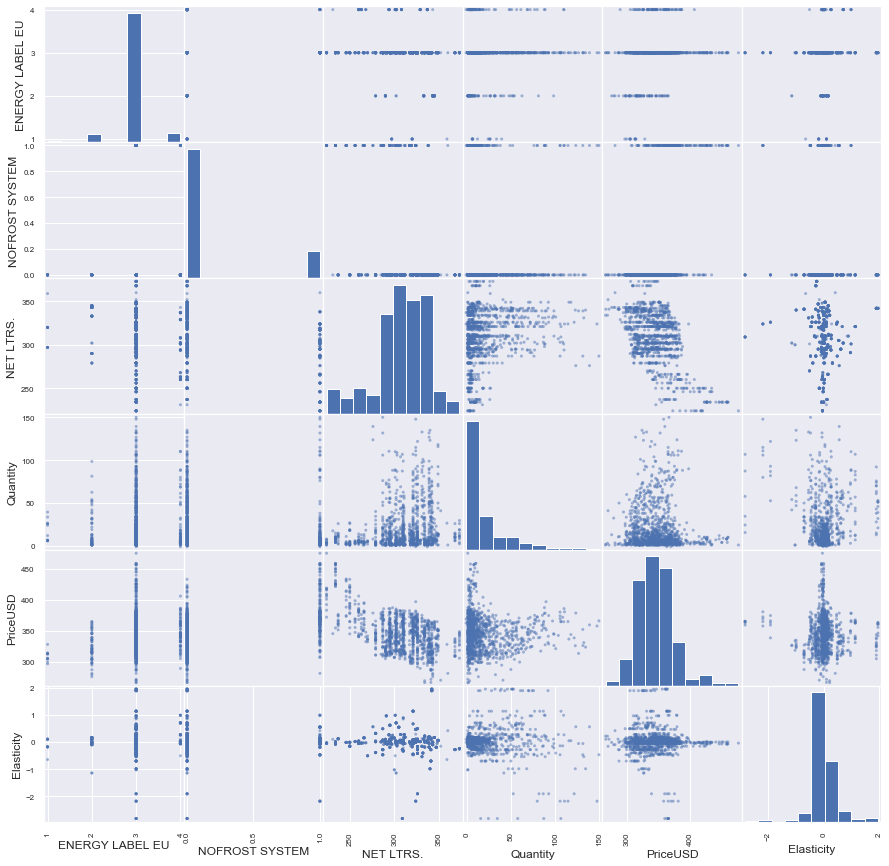

Кластер 4
       ENERGY LABEL EU  NOFROST SYSTEM   NET LTRS.    Quantity    PriceUSD  \
count       996.000000      996.000000  996.000000  996.000000  996.000000   
mean          2.869478        0.025100  275.418675   30.506734  274.261386   
std           0.504285        0.156509   30.131911   39.001166   30.403060   
min           1.000000        0.000000  209.000000   -2.000000  195.218610   
25%           3.000000        0.000000  256.000000    4.000000  254.445629   
50%           3.000000        0.000000  277.000000   13.000000  277.513633   
75%           3.000000        0.000000  300.500000   39.101198  296.000972   
max           4.000000        1.000000  341.000000  188.001597  347.990860   

       Elasticity  
count  996.000000  
mean     0.052039  
std      0.656559  
min     -2.814364  
25%     -0.137743  
50%      0.026943  
75%      0.218018  
max      5.517989  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  \
ENERGY LABEL EU         1.000000  

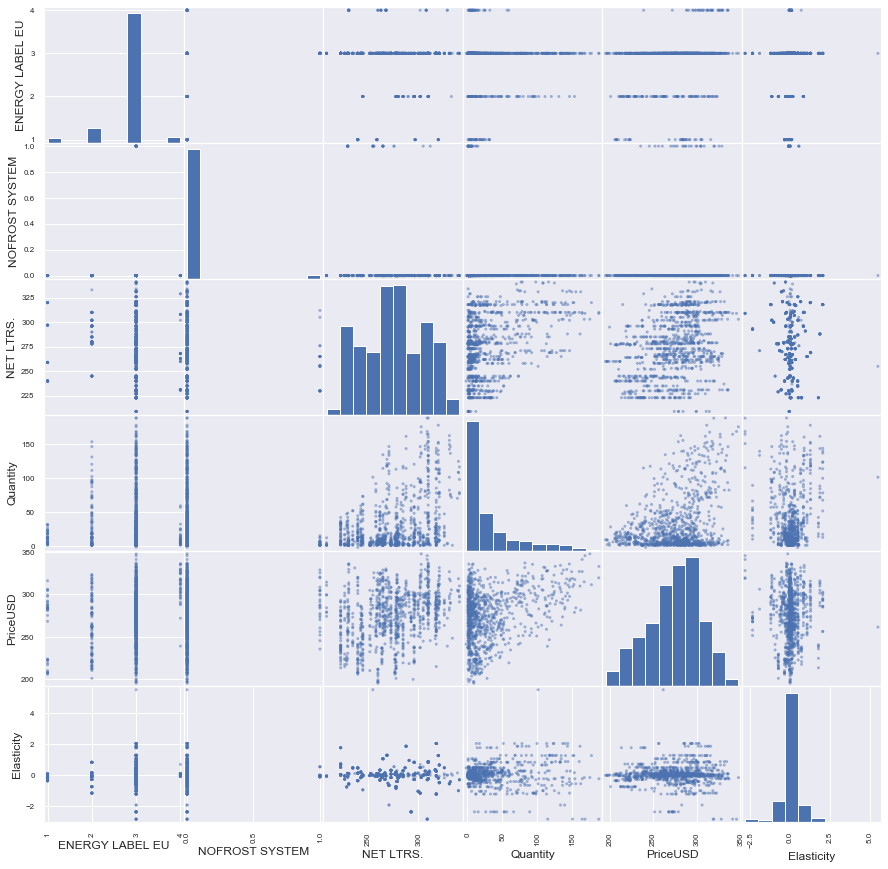

Кластер 5
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1186.000000     1186.000000  1186.000000  1186.000000  1186.000000   
mean          3.344013        0.827993   335.526981    37.526747   529.931778   
std           0.511177        0.377546    34.808477    55.308698    49.966580   
min           2.000000        0.000000   237.000000    -1.000000   342.452610   
25%           3.000000        1.000000   310.000000     5.000000   494.866776   
50%           3.000000        1.000000   332.000000    13.000000   528.496606   
75%           4.000000        1.000000   360.000000    39.075000   568.904939   
max           4.000000        1.000000   455.000000   267.000000   656.881750   

        Elasticity  
count  1186.000000  
mean      0.129251  
std       0.565529  
min      -2.767178  
25%      -0.031780  
50%       0.024942  
75%       0.108766  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

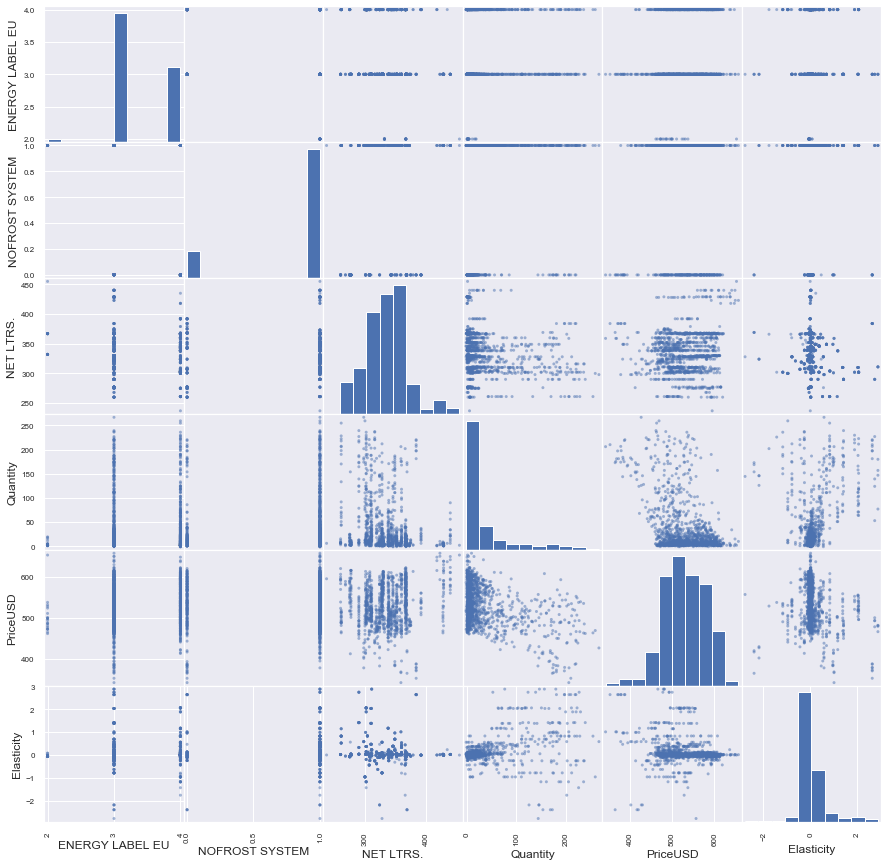

Кластер 6
       ENERGY LABEL EU  NOFROST SYSTEM    NET LTRS.     Quantity     PriceUSD  \
count      1183.000000     1183.000000  1183.000000  1183.000000  1183.000000   
mean          3.138631        0.636517   323.286560    20.069804   423.640405   
std           0.527793        0.481206    30.405103    26.938580    34.495953   
min           1.000000        0.000000   246.000000    -1.000000   317.453446   
25%           3.000000        0.000000   305.000000     4.000000   398.764905   
50%           3.000000        1.000000   319.000000    10.300000   423.970800   
75%           3.000000        1.000000   343.000000    24.350000   451.478616   
max           4.000000        1.000000   428.000000   188.000000   497.453630   

        Elasticity  
count  1183.000000  
mean      0.049856  
std       0.452696  
min      -2.384390  
25%      -0.075772  
50%       0.002265  
75%       0.088861  
max       2.876504  
                 ENERGY LABEL EU  NOFROST SYSTEM  NET LTRS.  Quantity  

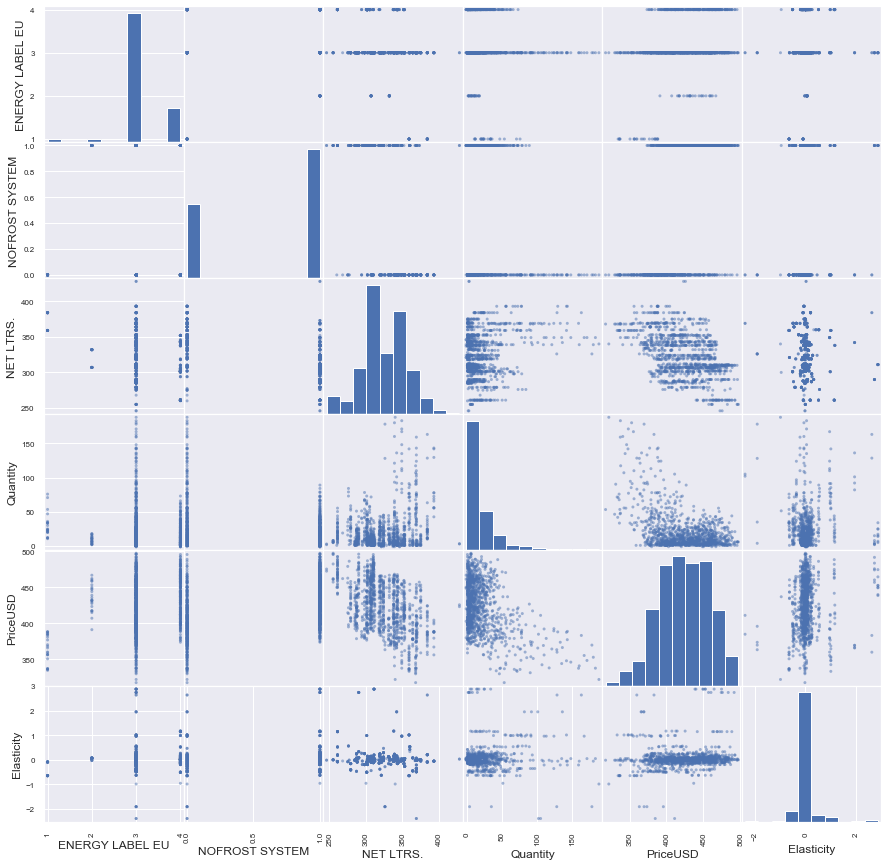

In [60]:
for i in np.unique(clusters):# виведемо відомості по класам
    print('Кластер ' + str(i))
    print(data[data['cluster_ier_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].describe())
    print(data[data['cluster_ier_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']].corr())
    scatter_matrix(data[data['cluster_ier_t_sne']==i][['ENERGY LABEL EU', 'NOFROST SYSTEM', 'NET LTRS.', 'Quantity', 'PriceUSD', 'Elasticity']], cmap='flag', figsize=(15,15)) 
    plt.show()